In [1]:
import sys
print (sys.version)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.basemap import Basemap
from itertools import chain
import math
from datetime import datetime
from geopy.distance import distance
%matplotlib inline

3.8.3 (default, Jul  2 2020, 17:30:36) [MSC v.1916 64 bit (AMD64)]


# Project WP1-2
### code 4: produce input csv file for weather requiring. 
<span style='font-family:"Times New Roman"'> <span styel=''> 

The final files should include the basic info of journey timestamp,ship_id, ais_lat,ais_lon,and journey_id;
Two original files are used: fleet_trade_journeys.csv" and testPos.csv".
 
### Basic steps: 
    a) Load and check data;
    b) Clean and merge data;
    c) Drop rows;
    d) Save data;

# a) Load and check data
all original data are loaded for checking. 
The houly AIS data, "TORMVesselsHourly_20200924.csv" are for way points identification (training).

In [2]:
df_positionH=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/dataOrig/TORMVesselsHourly_20200924.csv",sep=";")
df_positionD=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/testPos.csv",sep=";")
df_ships=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/fleet_ships.csv")
df_journey=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/fleet_trade_journeys.csv")
df_ports=pd.read_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/cleanedData/ports_update1.csv")

C:\Users\jiec\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (7,11) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
# credits from gustav
# compute geodistance of each voyages based on AIS data.

def uniqueID(shipID, dataframe, positionDF_key):
    """
    calculate all the voyages distances for the ship with shipID
    shipID: num
    dataframe: df
    positionDF_key:str, the name of column containing all "shipID"
    return : an updated dataframe with journey distance.
    
    note that operation is conducted directly on input dataframe (in place).
    """
    print("Current ship id:",shipID)
    shipIDs = dataframe.loc[dataframe[positionDF_key] == shipID]
    #print(shipIDs["MovementID"].value_counts() )
    
    changedPort = False
    lat, lon, preLat, preLon, dist, preDist, prePortName = reset_values()
    
    indexList = []
    
    for index, row in shipIDs.iterrows():
        
        portName = row["Destination"]
        portName = str(portName)
        changedPort = change_dest(portName, prePortName)
        prePortName = portName
        
        # when the destination changes, it means a distance of voyage has been found. 
        # then restart to compute another voyage.
        if changedPort == True:
            df = insert_total_dist(dataframe, dist, indexList)
            lat, lon, preLat, preLon, dist, preDist, prePortName = reset_values()
            indexList.clear()
        
        # under the same destination
        lat = row["Latitude"]
        lon = row["Longitude"]
        indexList.append(index)
        
        if isinstance(preLon, float) == True and isinstance(preLat, float) == True:
            try:
                dist = calculate_dist(lat, lon, preLat, preLon, dist)
            except:
                lat = preLat
                lon = preLon
        
        # reserve current locations as pre locations for next loop
        preLat = lat
        preLon = lon
    
    return dataframe


def change_dest(destination, preDest):
    """
    Judge if the current timeseries destination is the same as the previous timeseries. 
    destination: string
    preDest:string
    return: True: not the same destination, Flase: the same destination
    """
    assert isinstance(destination, str) == True, "it is not string, the value {} is type {}".format(destination,type(destination))
    assert isinstance(preDest, str) == True, f"is not string, the value is {destination} of type {type(destination)}"
    
    if destination != preDest and preDest != "nan":
        print("====================================================================")
        print("new destination", destination, "previous destination", preDest)
        return True
    else: return False
    
def calculate_dist(lat, lon, destPortLat, destPortLong ,preDist):
    """
    compute the overall distance of a voyage: preDist+currentDist
    return: distance in nautical miles
    """
    assert isinstance(lat, float) == True, f"is not float / not a coordinate. value is {lat}"
    assert isinstance(lon, float) == True, f"is not float / not a coordinate. value is {lon}"
    #assert isinstance(preDist, float) == True, f"preDist is not a digit value, value is  {preDist}"
    distan = distance((lat, lon), (destPortLat, destPortLong)).miles * 0.868976242
    dist = distan + preDist

    return dist

def reset_values():
    lat = 0.00
    lon = 0.00
    
    preLat = "no coord"
    preLon = "no coord"
    
    dist = 0
    preDist = 0
    
    prePortName = "nan"
    
    return lat, lon, preLat, preLon, dist, preDist, prePortName

def insert_total_dist(dataframe, distance, indexList):
    """
    add an extra distance column in dataframe for the points of each voyages.
    """
    for intIndex in indexList:
        dataframe.at[intIndex, "Total Distance of Journey"] = distance
    return dataframe

def set_distance_interval(dataframe, dataframe_distance_key, minDistance = 0, maxDistance = 0):
    if minDistance == 0 and maxDistance != 0:
        return dataframe.loc[dataframe[dataframe_distance_key] <= maxDistance]
    elif minDistance != 0 and maxDistance == 0:
        return dataframe.loc[dataframe[dataframe_distance_key] >= minDistance]
    elif minDistance != 0 and maxDistance != 0:
        return dataframe.loc[( (dataframe[dataframe_distance_key] >= minDistance) & (dataframe[dataframe_distance_key] <= maxDistance))]
    else:
        return print("insert minimum or maximum distance")

In [4]:
# Compute overall distance of every journey based AIS data 
# no need to apply in this script

#ship_imos=df_positionH["LR_IMO_Ship_No"].unique()
#ship_imos
# for shipid in ship_imos:
#     df_temp=uniqueID(shipid, df_positionH, "LR_IMO_Ship_No")
#     df_positionH.update(df_temp)

In [5]:
# filter dataframe with input distance 
#set_distance_interval(df_positionH, "Total Distance of Journey", minDistance = 3000, maxDistance = 0 )

In [6]:
print (df_positionD.columns)
df_positionD["ais_position_id"]=df_positionD["ais_position_id"].astype(np.str)
df_positionD.head()

Index(['Unnamed: 0', 'ais_position_id', 'ais_ship_id', 'ais_position_mmsi',
       'ais_position_timestamp', 'ais_position_latitude',
       'ais_position_longitude', 'ais_position_speed', 'ais_position_course',
       'ais_position_heading', 'nav_status_id', 'nav_status_desc',
       'special_maneuvre_id', 'special_maneuvre_desc',
       'ais_position_satellite', 'ais_position_msg_type', 'ship_build_year',
       'ship_id', 'ship_imo', 'ship_name', 'ship_size', 'ship_size_type',
       'f.ship_status', 'Journey Number', 'sailing distance'],
      dtype='object')


,Unnamed: 0,ais_position_id,ais_ship_id,ais_position_mmsi,ais_position_timestamp,ais_position_latitude,ais_position_longitude,ais_position_speed,ais_position_course,ais_position_heading,...,ais_position_msg_type,ship_build_year,ship_id,ship_imo,ship_name,ship_size,ship_size_type,f.ship_status,Journey Number,sailing distance
0,0,3237546,97,209110000,2014-01-01 13:01:04,51.45500,140.92503,0.0,288.0,233,...,3,2005,9301421,9301421,Victor Konetsky,101000,DWT,Live,286559091.0,319.489709
1,1,8442368,97,209110000,2014-01-02 12:31:21,51.46248,140.90523,0.0,177.0,268,...,3,2005,9301421,9301421,Victor Konetsky,101000,DWT,Live,286559091.0,93.204520
2,2,14080197,97,209110000,2014-01-03 22:18:59,48.74732,140.77492,15.4,203.0,204,...,1,2005,9301421,9301421,Victor Konetsky,101000,DWT,Live,286559091.0,326.908731
3,3,19397589,97,209110000,2014-01-04 23:34:08,43.20852,136.17353,14.8,210.0,212,...,1,2005,9301421,9301421,Victor Konetsky,101000,DWT,Live,286559091.0,191.981044
4,4,24273113,97,209110000,2014-01-05 21:30:08,38.53695,132.48110,15.0,211.0,211,...,1,2005,9301421,9301421,Victor Konetsky,101000,DWT,Live,286559091.0,286.624267


In [7]:
print (df_journey.columns)
print (len(df_journey))
print (len(df_positionD))
df_journey.head()

Index(['journey_id', 'ship_id', 'ais_ship_id', 'journey_laden',
       'journey_start_stoppage_id', 'journey_start_timestamp',
       'journey_start_draft', 'journey_start_latitude',
       'journey_start_longitude', 'journey_start_location_type',
       'journey_start_location_name', 'journey_start_location_country',
       'journey_start_location_unlocode', 'journey_end_stoppage_id',
       'journey_end_timestamp', 'journey_end_draft', 'journey_end_latitude',
       'journey_end_longitude', 'journey_end_location_type',
       'journey_end_location_name', 'journey_end_location_country',
       'journey_end_location_unlocode', 'journey_distance_nm',
       'journey_underway_calc_avg_speed', 'journey_processed',
       'journey_current', 'journey_estimated_cargo_tons',
       'journey_underway_distance', 'journey_underway_time_hours'],
      dtype='object')
501331
6050012


,journey_id,ship_id,ais_ship_id,journey_laden,journey_start_stoppage_id,journey_start_timestamp,journey_start_draft,journey_start_latitude,journey_start_longitude,journey_start_location_type,...,journey_end_location_name,journey_end_location_country,journey_end_location_unlocode,journey_distance_nm,journey_underway_calc_avg_speed,journey_processed,journey_current,journey_estimated_cargo_tons,journey_underway_distance,journey_underway_time_hours
0,286559091,9301421,97,1,886369008,2013-12-30 05:34:03,9.0,51.45277,140.92767,Port,...,Yeosu,South Korea,KRYOS,1247.352457,13.959216,2019-03-28 06:53:38,0,98235,1195.141506,85.616667
1,286559092,9301421,97,0,886369009,2014-01-07 13:30:04,14.2,34.71473,127.81125,Anchorage,...,De Kastri,Russia,RUDKA,1251.511628,13.074002,2019-03-28 06:53:38,0,0,1233.310535,94.333056
2,286559093,9301421,97,1,886369012,2014-01-19 01:02:19,9.0,51.48012,140.92478,Anchorage,...,Ulsan,South Korea,KRUSN,1166.283499,14.453006,2019-03-28 06:53:38,0,98235,1132.023627,78.324444
3,286559094,9301421,97,0,886369014,2014-01-25 05:06:44,14.2,35.44117,129.39453,Port,...,De Kastri,Russia,RUDKA,1339.352542,13.024184,2019-03-28 06:53:38,0,0,1197.562825,91.949167
4,286559095,9301421,97,1,886369018,2014-02-05 12:23:14,9.0,51.48157,140.92332,Port,...,Gwangyang,South Korea,KRKAN,1299.165114,13.671880,2019-03-28 06:53:38,0,98235,1288.684831,94.258056


# b) Clean and merge data

In [8]:
# some features in dataset df_positionD and df_journey are not needed here, remove them and then mergy
# select useful columns
df_positionD_sim=df_positionD[['ais_position_id','ais_position_timestamp','ais_position_latitude','ais_position_longitude','ship_id', 'ship_imo', 'ship_name','Journey Number']]
df_journey_sim=df_journey[['journey_id','journey_start_timestamp','journey_start_location_name', 'journey_start_location_country',
                          'journey_end_timestamp','journey_end_location_name', 'journey_end_location_country',
                           'journey_distance_nm']]
# Some basic cleans
# drop columns with missing Journey_Number
df_positionD_sim=df_positionD_sim.dropna(subset=['Journey Number'])

# rename "Journey Number" to "journey_id"
df_positionD_sim.rename(columns={"Journey Number":"journey_id"},inplace=True)

df_positionD_sim["journey_id"]=df_positionD_sim["journey_id"].astype(np.int64)
df_positionD_sim

,ais_position_id,ais_position_timestamp,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id
0,3237546,2014-01-01 13:01:04,51.45500,140.92503,9301421,9301421,Victor Konetsky,286559091
1,8442368,2014-01-02 12:31:21,51.46248,140.90523,9301421,9301421,Victor Konetsky,286559091
2,14080197,2014-01-03 22:18:59,48.74732,140.77492,9301421,9301421,Victor Konetsky,286559091
3,19397589,2014-01-04 23:34:08,43.20852,136.17353,9301421,9301421,Victor Konetsky,286559091
4,24273113,2014-01-05 21:30:08,38.53695,132.48110,9301421,9301421,Victor Konetsky,286559091
...,...,...,...,...,...,...,...,...
6048935,25890032246,2019-03-18 23:44:11,-23.80239,-45.38495,9547697,9547697,Olavo Bilac,292096974
6048936,25898997166,2019-03-19 14:35:11,-23.80238,-45.38490,9547697,9547697,Olavo Bilac,292096974
6048937,25918794134,2019-03-20 23:43:06,-23.73711,-45.35460,9547697,9547697,Olavo Bilac,292096974
6048938,25933200761,2019-03-21 23:55:06,-23.73720,-45.35433,9547697,9547697,Olavo Bilac,292096974


In [9]:
df_journey_sim_3000=df_journey_sim[df_journey_sim.journey_distance_nm>=3000]
df_journey_sim_3000

,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm
33,286559124,2014-11-23 08:12:17,Yeosu,South Korea,2014-12-13 10:59:49,De Kastri,Russia,3718.687614
68,286559159,2015-10-04 23:10:24,De Kastri,Russia,2015-10-25 02:20:12,JXTG Sakai Refinery,Japan,4125.757777
125,286559216,2017-02-03 23:12:34,JX Nippon Oil and Energy Kiire Terminal,Japan,2017-02-26 21:30:24,De Kastri,Russia,4104.286293
143,286559234,2017-07-07 01:52:16,Yeosu,South Korea,2017-07-21 04:50:27,De Kastri,Russia,3472.883145
150,286559241,2017-08-30 13:20:47,De Kastri,Russia,2017-09-23 11:54:10,Singapore,Singapore,3868.035508
...,...,...,...,...,...,...,...,...
501288,292353356,2019-03-06 14:19:17,Galle,Sri Lanka,NaN,NaN,NaN,4899.703980
501291,289604933,2019-01-29 06:29:39,Tuas Boulevard Shipyard,Singapore,2019-02-28 14:10:42,Ruwais,United Arab Emirates,4157.795514
501292,292382141,2019-02-28 14:10:42,Ruwais,United Arab Emirates,2019-03-25 02:48:00,Barcelona,Spain,6003.714978
501294,291936074,2019-01-27 13:24:52,Tarahan,Indonesia,2019-03-02 00:00:22,Naples,Italy,7167.448221


In [10]:
df_all=pd.merge(df_positionD_sim,df_journey_sim_3000,on='journey_id',how='right')
# drop rows without ais positions
df_all=df_all.dropna(subset=["ais_position_latitude"])
df_all

,ais_position_id,ais_position_timestamp,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm
0,5811207,2014-01-01 23:48:12,41.93912,139.07770,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
1,8821505,2014-01-02 23:24:23,39.15283,142.35820,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
2,13536291,2014-01-03 23:53:30,34.64402,139.67570,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
3,19155353,2014-01-04 23:56:46,34.03151,134.98734,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
4,24344334,2014-01-05 22:27:52,34.55417,135.43150,9301407.0,9301407.0,Viktor Titov,285689023,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,2014-02-03 01:15:37,De Kastri,Russia,4364.329539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2190867,25848553475,2019-03-15 23:59:20,1.48693,149.78317,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353
2190868,25862262642,2019-03-16 23:49:32,-2.61357,153.04519,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353
2190869,25875803276,2019-03-17 23:28:16,-6.77629,156.28137,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353
2190870,25890184605,2019-03-18 23:30:27,-8.92604,159.37613,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353


# Randomly double-checking data

In [11]:
print (df_positionD_sim[df_positionD_sim.journey_id==291835447])
print ("========================================================================================")
print (df_journey_sim_3000[df_journey_sim_3000.journey_id==291835447])

        ais_position_id ais_position_timestamp  ais_position_latitude  \
6030488     25718872792    2019-03-06 23:38:17               34.86389   
6030489     25733142779    2019-03-07 23:17:16               34.86392   
6030490     25748110001    2019-03-08 22:57:31               30.63167   
6030491     25762766304    2019-03-09 23:39:33               26.55667   
6030492     25776775760    2019-03-10 22:51:35               22.48667   
6030493     25791481075    2019-03-11 23:41:41               17.83061   
6030494     25805208665    2019-03-12 23:25:39               13.68123   
6030495     25819499018    2019-03-13 23:50:20                9.58162   
6030496     25834180406    2019-03-14 23:48:58                5.46724   
6030497     25848553475    2019-03-15 23:59:20                1.48693   
6030498     25862262642    2019-03-16 23:49:32               -2.61357   
6030499     25875803276    2019-03-17 23:28:16               -6.77629   
6030500     25890184605    2019-03-18 23:30:27     

In [12]:
def check_missData(df):
    """
    check the missing data of dataFrame.
    return: a dataFrame describing missing data percentage
    sum(): count the number of missing data in each column
    isnull(): return a dataFrame with True and False   
    """
    miss_tot=df.isnull().sum().sort_values(ascending=False)
    counts_all=df.isnull().count() # count all the elements, including the missed elements
    miss_per=((df.isnull().sum())*100/counts_all).sort_values(ascending=False)
    miss_all=pd.concat([miss_tot,miss_per],axis=1,keys=['TotalNum','TotalPerc(\%)'])
    return miss_all

In [13]:
check_missData(df_all)

,TotalNum,TotalPerc(\%)
journey_end_location_country,4155,0.189651
journey_start_location_country,2988,0.136384
journey_end_location_name,503,0.022959
journey_start_location_name,414,0.018897
journey_distance_nm,0,0.000000
journey_end_timestamp,0,0.000000
journey_start_timestamp,0,0.000000
journey_id,0,0.000000
ship_name,0,0.000000
ship_imo,0,0.000000


# c)  drop rows. 

1) if the ais points are belonged to the close sea, they may be droped;
2) if the ais points are belonged to a journey within a country, they may be droped;
3) if the ais points are within the start of the journey, or within the end of the journey, they may be droped.

In [14]:
def draw_map(m, scale=0.5):
    """
    plot backgroud map
    m: Basemap object
    scale: plot scale
    return: plot a backgroud map
    """
    # draw a shaded-relief image
    m.shadedrelief(scale=scale)
    #m.bluemarble(scale=scale)  #Project NASA's blue marble image onto the map
    #m.drawcoastlines()
    
    # lats and longs are returned as a dictionary
    lats = m.drawparallels(np.linspace(-90, 90, 13))
    lons = m.drawmeridians(np.linspace(-180, 180, 13))

    # keys contain the plt.Line2D instances
    lat_lines = chain(*(tup[1][0] for tup in lats.items()))
    lon_lines = chain(*(tup[1][0] for tup in lons.items()))
    all_lines = chain(lat_lines, lon_lines)
    
    # cycle through these lines and set the desired style
    for line in all_lines:
        line.set(linestyle='-', alpha=0.3, color='w')

def plotPorts(df,directory="C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/",file_name="longVoyage_3000.png"):
    """
    Plot ports on geomap
    df: dataframe with location coordinates
    """
    #bbox=(df.ais_position_latitude.min(),df.ais_position_latitude.max(),df.ais_position_longitude.min(),df.ais_position_longitude.max())                                                        
    bbox=(-90,90,-180,180)
    #print ("The respective minimum and maximum latitude and longitude coordiates of ports are:",bbox)

    fig,ax=plt.subplots(figsize=(22,14))
    m = Basemap(projection='cyl', resolution='l',
                llcrnrlat=bbox[0], urcrnrlat=bbox[1],
                llcrnrlon=bbox[2], urcrnrlon=bbox[3])
    ax.scatter(df.ais_position_longitude,df.ais_position_latitude,c=df.journey_distance_nm,s=20)
    draw_map(m)

    ax.set_xlim(bbox[2],bbox[3]);
    ax.set_ylim(bbox[0],bbox[1]);
    fig.savefig(directory+file_name,dpi=400)
    
def df2ts(df):
    """
    update dataframe to time series format
    df: dataframe
    return: new dataframe with time series format
    """
    # to datetime format
    df_copy=df.copy()
    df_copy["ais_position_timestamp"]=pd.to_datetime(df_copy.ais_position_timestamp,format="%Y-%m-%d")
    df_copy.ais_position_timestamp=df_copy.ais_position_timestamp.apply(lambda x:x.strftime('%Y-%m-%d'))
    df_copy.index=pd.DatetimeIndex(df_copy["ais_position_timestamp"])
    df_copy.drop(["ais_position_timestamp"],axis=1,inplace=True)
    return df_copy


In [15]:
#display_ids=df_all.journey_id.unique()
#plotPorts(df_all[(df_all.journey_id>=273427218) & (df_all.journey_id<=282546097)])

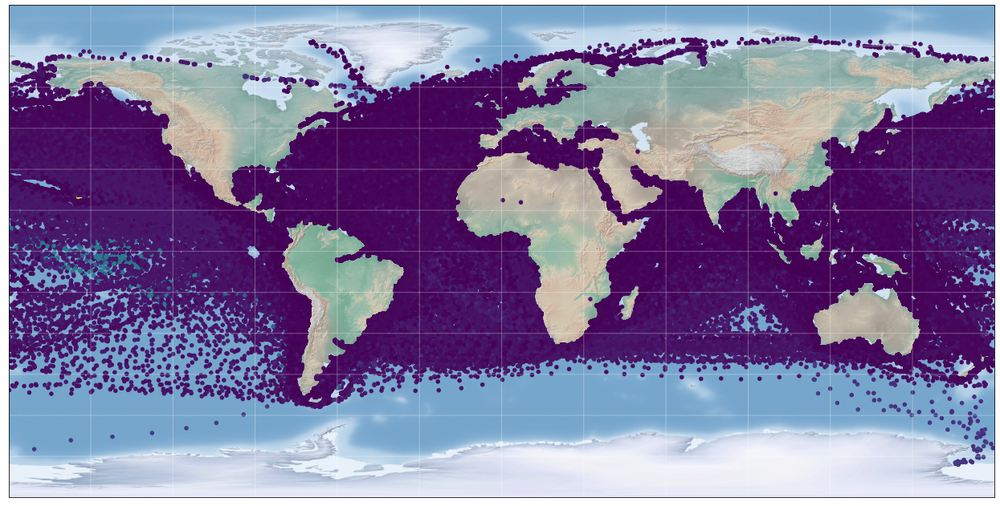

In [16]:
plotPorts(df_all,file_name="longVoyage_3000_all.png")

In [17]:
df_all_1=df2ts(df_all)
df_all_1

,ais_position_id,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm
ais_position_timestamp,,,,,,,,,,,,,,
2014-01-01,5811207,41.93912,139.07770,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
2014-01-02,8821505,39.15283,142.35820,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
2014-01-03,13536291,34.64402,139.67570,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
2014-01-04,19155353,34.03151,134.98734,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
2014-01-05,24344334,34.55417,135.43150,9301407.0,9301407.0,Viktor Titov,285689023,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,2014-02-03 01:15:37,De Kastri,Russia,4364.329539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-03-15,25848553475,1.48693,149.78317,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353
2019-03-16,25862262642,-2.61357,153.04519,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353
2019-03-17,25875803276,-6.77629,156.28137,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353


In [18]:
# df_temp=df_all_group.get_group(273427218)
# print (len(df_temp))

# journey_ids=df_all_1.journey_id.unique()
# print (len(journey_ids))

# np.random.seed(0)
# remove_n = 160000

# #  the sample assumes a uniform distribution over all entries
# drop_indices = np.random.choice(df_all.index, remove_n, replace=False)
# print (drop_indices)
# print (len(drop_indices))
# df_subset = df_all.loc[drop_indices]

#print (len(df_subset))
#df_subset.head()

In [19]:
def remove_dups(df):
    """
    Find and drop the first duplicates
    df: original df
    return: dataFrame without duplicate "timestamp"
    """
    # find and drop the first duplicate
    df_noDup=df.drop_duplicates(subset=["Terminal"],keep=False,inplace=False)
    
    pd_dupTs=pd.concat(g for _, g in df.groupby("Terminal") if len(g) > 1)
    pd_dupTs.drop_duplicates(subset=["Terminal"],keep='first',inplace=True)
    
    return pd_dupTs,df_noDup

from itertools import product, starmap

lat_b1,lat_b2=-90,90
long_b3,long_b4=-180,180
def shipLocations():
    # 笛卡尔积，相当于嵌套的for循环
    return product(range(-90,90),range(-180,180))

def lat_long_names():
    # Make an iterator that computes the function using arguments obtained from the iterable.
    #starmap(function, iterable)
    return list (starmap(lambda i,s: "lat_{}_lon_{}_position".format(i,s),shipLocations()))

In [20]:
#longitude（+：E　-：W）
#latitude（+：N　-：S）
#format of sea area boundary: (lat_down,lat_up,lon_left,lon_right)


closeSeaBounds={"Baltic":(50,68,8,32),"Black sea":(40,50,25,45),"Gulf":(12,35,-100,-80),"Mediterranean":(30,48,-8,40),
                "Red sea":(5,30,30,55),"Mid East":(15,35,45,60)}
               
def removeAIS_closeSea(df,seaName="Baltic",seaBounds=(50,65,8,20)):
    """
    remove all ais points inside the closed sea such as 'Baltic', 'Black sea','Gulf','Mediterranean','Red sea',
    and 'Mid East'.
    Tips: directly modify the original dataframe
    df:dataframe
    seaName:string, the name of sea
    seaBounds: four numbers: lat_down,lat_up,lon_left,lon_right
    """
    assert isinstance(seaBounds[0],str)== False, "{} is not a float or int".format(seaBounds[0])
    assert isinstance(seaBounds[1],str)== False, "{} is not a float or int".format(seaBounds[1])
    assert isinstance(seaBounds[2],str)== False, "{} is not a float or int".format(seaBounds[2])
    assert isinstance(seaBounds[3],str)== False, "{} is not a float or int".format(seaBounds[3])
    print ("The current sea name is {} with bounds {}".format(seaName,seaBounds))
    
    lat_mask=(df.ais_position_latitude<seaBounds[1]) & (df.ais_position_latitude>seaBounds[0])
    lon_mask=(df.ais_position_longitude<seaBounds[3]) &(df.ais_position_longitude>seaBounds[2])
    
    df_subset=df[lat_mask & lon_mask]
    #rest_id= np.array([i for i in df.index.values if i not in df_subset.index.values])
    #df_rest=df.loc[rest_id]
    subset_id=df_subset.index.values
    df.drop(subset_id,axis=0,inplace=True)
    
    return df

def removeAIS_sameCty(df):
    # drop all points of a voyage within a country
    df_sameCountry=df[df.journey_start_location_country==df.journey_end_location_country]
    
    same_id=df_sameCountry.index.values
    df.drop(same_id,axis=0,inplace=True)
    return df_all
    
    
def removeAIS_closePort(df,port_name,dist=500):
    """
    drop all ais points within a distance of 500 nm
    """
    
    pass


def addAIS_region(df,lat_d,lat_u,lon_l,lon_r):
    """
    add all the ais points into a specific sea area
    """
    pass
    

In [21]:
# remove the AIS points in closed sea regions.
for closesea, location in closeSeaBounds.items():
    df_all=removeAIS_closeSea(df_all,seaName=closesea,seaBounds=location)
print ("the overall length of all data without closed sea points:",len(df_all))
print (len(df_all))

The current sea name is Baltic with bounds (50, 68, 8, 32)
The current sea name is Black sea with bounds (40, 50, 25, 45)
The current sea name is Gulf with bounds (12, 35, -100, -80)
The current sea name is Mediterranean with bounds (30, 48, -8, 40)
The current sea name is Red sea with bounds (5, 30, 30, 55)
The current sea name is Mid East with bounds (15, 35, 45, 60)
the overall length of all data without closed sea points: 1677805
1677805


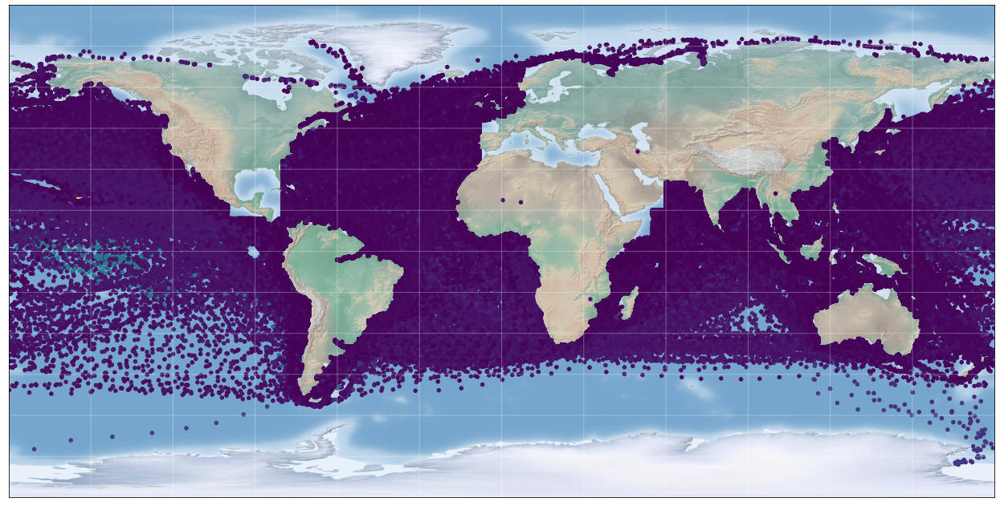

In [22]:
plotPorts(df_all,file_name="longVoyage_3000_noCloseSea.png")

In [23]:
# remove the AIS points for journeys in the same country
df_all=removeAIS_sameCty(df_all)

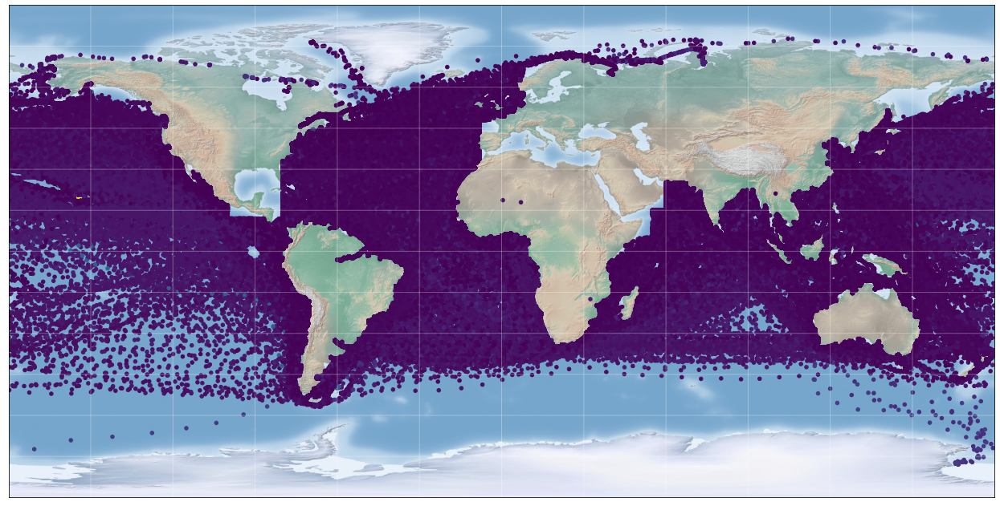

In [24]:
plotPorts(df_all,file_name="longVoyage_3000_NosameCountry.png")

In [25]:
def calculate_dist(lat, lon, destPortLat, destPortLong):
    """
    compute the distance between the port and a given location
    return: distance in nautical miles
    """
    assert isinstance(lat, float) == True, f"is not float / not a coordinate. value is {lat}"
    assert isinstance(lon, float) == True, f"is not float / not a coordinate. value is {lon}"
    dist = distance((lat, lon), (destPortLat, destPortLong)).miles * 0.868976242 

    return dist


def get_portCoords(portName):
    """
    get the geolocation of any given port
    """
    df_temp=df_ports[df_ports.Terminal==str(portName)]
        
    if len(df_temp)==0:
        lat="nan"
        lon="nan"
    
    for ix,row in df_temp.iterrows():
        lat=row["Lat"]
        lon=row["Lon"]
    return lat,lon


def uniqueJourneyId(journeyId, dataframe, journeyId_key):
    """
    calculate distances between journey points and start/end ports
    add two distance columns
    shipID: num
    dataframe: df
    positionid_key:string, the name of column containing all "journey id"
    return : an updated dataframe with two extra distance columns
    
    note that operation is conducted directly on input dataframe (in place).
    """
    print("Current journey id:",journeyId)
    journeyId_df = dataframe.loc[dataframe[journeyId_key] == journeyId]
    
    # ports including start and end
    start_port=journeyId_df.journey_start_location_name.values[0]
    end_port=journeyId_df.journey_end_location_name.values[0]
    
    portLat1,portLon1=get_portCoords(start_port)
    portLat2,portLon2=get_portCoords(end_port)
    

    for index, row in journeyId_df.iterrows():
        
        if portLat1=="nan" or portLon1=="nan" or portLat2=="nan" or portLon2=="nan":
                dataframe.at[index, "dist2start"] = 0
                dataframe.at[index, "dist2send"] = 0
        else:
            lat_temp=row["ais_position_latitude"]
            lon_temp=row["ais_position_longitude"]

            dist1 = calculate_dist(lat_temp, lon_temp, portLat1, portLon1)
            dist2 = calculate_dist(lat_temp, lon_temp, portLat2, portLon2)

            dataframe.at[index, "dist2start"] = dist1
            dataframe.at[index, "dist2send"] = dist2
        
    return dataframe

In [26]:
# drop rows with wrong lat, long coordinates.
# for instance, geolocation with lat larger than 90 or long coordinates larger than 180
df_error=df_all[(df_all.ais_position_latitude>90) | (df_all.ais_position_latitude<-90) | (df_all.ais_position_longitude>180) | (df_all.ais_position_longitude<-180)]
errorId=df_error.index.values
df_all.drop(errorId,axis=0,inplace=True)

journeys=df_all.journey_id.unique()
print (journeys)
print (len(journeys))

[285689022 285689023 283864844 ... 292199370 292019598 291835447]
75268


In [27]:
counts=len(journeys)
for journey in journeys:
    counts=counts-1
    print (counts)
    df_all=uniqueJourneyId(journey, df_all, "journey_id")

75267
Current journey id: 285689022
75266
Current journey id: 285689023
75265
Current journey id: 283864844
75264
Current journey id: 286149910
75263
Current journey id: 291332413
75262
Current journey id: 292385429
75261
Current journey id: 285406541
75260
Current journey id: 288573217
75259
Current journey id: 288573220
75258
Current journey id: 291333560
75257
Current journey id: 284825944
75256
Current journey id: 283483100
75255
Current journey id: 283483102
75254
Current journey id: 291458167
75253
Current journey id: 291321121
75252
Current journey id: 291321122
75251
Current journey id: 291321124
75250
Current journey id: 285403278
75249
Current journey id: 285403280
75248
Current journey id: 288579958
75247
Current journey id: 285171126
75246
Current journey id: 287800665
75245
Current journey id: 292253194
75244
Current journey id: 283351568
75243
Current journey id: 287659062
75242
Current journey id: 291337660
75241
Current journey id: 283867747
75240
Current journey id: 28

Current journey id: 292187350
75029
Current journey id: 285435125
75028
Current journey id: 282552623
75027
Current journey id: 284870130
75026
Current journey id: 291973998
75025
Current journey id: 292234303
75024
Current journey id: 291981031
75023
Current journey id: 286459040
75022
Current journey id: 282573089
75021
Current journey id: 284862250
75020
Current journey id: 283807303
75019
Current journey id: 283807304
75018
Current journey id: 292384212
75017
Current journey id: 283999787
75016
Current journey id: 283004120
75015
Current journey id: 282610980
75014
Current journey id: 283972198
75013
Current journey id: 283763416
75012
Current journey id: 292250345
75011
Current journey id: 292250346
75010
Current journey id: 282609307
75009
Current journey id: 282609308
75008
Current journey id: 288596061
75007
Current journey id: 288573545
75006
Current journey id: 292025664
75005
Current journey id: 292025665
75004
Current journey id: 282609758
75003
Current journey id: 28260976

74788
Current journey id: 283845249
74787
Current journey id: 283845251
74786
Current journey id: 291255560
74785
Current journey id: 291224483
74784
Current journey id: 282636516
74783
Current journey id: 292214511
74782
Current journey id: 292214513
74781
Current journey id: 284028832
74780
Current journey id: 283826122
74779
Current journey id: 291292169
74778
Current journey id: 283788957
74777
Current journey id: 283788958
74776
Current journey id: 291281964
74775
Current journey id: 291281966
74774
Current journey id: 291265531
74773
Current journey id: 292312360
74772
Current journey id: 292311600
74771
Current journey id: 284774835
74770
Current journey id: 284774837
74769
Current journey id: 286156116
74768
Current journey id: 286156117
74767
Current journey id: 286156118
74766
Current journey id: 282745384
74765
Current journey id: 282745385
74764
Current journey id: 283789655
74763
Current journey id: 288592679
74762
Current journey id: 288592680
74761
Current journey id: 28

74551
Current journey id: 283731603
74550
Current journey id: 291217715
74549
Current journey id: 291217716
74548
Current journey id: 283652915
74547
Current journey id: 283453785
74546
Current journey id: 286435851
74545
Current journey id: 291842966
74544
Current journey id: 292170618
74543
Current journey id: 292170619
74542
Current journey id: 287656668
74541
Current journey id: 291398726
74540
Current journey id: 285436708
74539
Current journey id: 285433831
74538
Current journey id: 291184248
74537
Current journey id: 291184250
74536
Current journey id: 282546030
74535
Current journey id: 285289500
74534
Current journey id: 285289501
74533
Current journey id: 292170219
74532
Current journey id: 285288910
74531
Current journey id: 285288911
74530
Current journey id: 285288912
74529
Current journey id: 282722163
74528
Current journey id: 286161357
74527
Current journey id: 286448647
74526
Current journey id: 282557761
74525
Current journey id: 283739008
74524
Current journey id: 28

74308
Current journey id: 285187629
74307
Current journey id: 285392567
74306
Current journey id: 285392568
74305
Current journey id: 286153155
74304
Current journey id: 284877378
74303
Current journey id: 283722366
74302
Current journey id: 283817637
74301
Current journey id: 283817638
74300
Current journey id: 283817639
74299
Current journey id: 282572103
74298
Current journey id: 292409842
74297
Current journey id: 292409844
74296
Current journey id: 285370553
74295
Current journey id: 283803711
74294
Current journey id: 291866817
74293
Current journey id: 291257938
74292
Current journey id: 291257940
74291
Current journey id: 292234975
74290
Current journey id: 292234976
74289
Current journey id: 283788715
74288
Current journey id: 283788717
74287
Current journey id: 286136222
74286
Current journey id: 286136223
74285
Current journey id: 286136224
74284
Current journey id: 282568451
74283
Current journey id: 282568452
74282
Current journey id: 282568453
74281
Current journey id: 28

74072
Current journey id: 287593797
74071
Current journey id: 287803102
74070
Current journey id: 282554576
74069
Current journey id: 283836050
74068
Current journey id: 292026932
74067
Current journey id: 291976960
74066
Current journey id: 291976961
74065
Current journey id: 282743379
74064
Current journey id: 283723365
74063
Current journey id: 282559399
74062
Current journey id: 282559400
74061
Current journey id: 283733369
74060
Current journey id: 282570247
74059
Current journey id: 284860243
74058
Current journey id: 282583789
74057
Current journey id: 282657937
74056
Current journey id: 282657938
74055
Current journey id: 282657939
74054
Current journey id: 284035663
74053
Current journey id: 288326964
74052
Current journey id: 288326965
74051
Current journey id: 285127471
74050
Current journey id: 284908362
74049
Current journey id: 282621591
74048
Current journey id: 292231769
74047
Current journey id: 291424725
74046
Current journey id: 291424726
74045
Current journey id: 29

73840
Current journey id: 285373586
73839
Current journey id: 284058554
73838
Current journey id: 283835831
73837
Current journey id: 283835832
73836
Current journey id: 283835833
73835
Current journey id: 291274953
73834
Current journey id: 292188844
73833
Current journey id: 292188846
73832
Current journey id: 282633734
73831
Current journey id: 282766967
73830
Current journey id: 284119615
73829
Current journey id: 286047742
73828
Current journey id: 286934906
73827
Current journey id: 285125898
73826
Current journey id: 292018105
73825
Current journey id: 292018109
73824
Current journey id: 288573352
73823
Current journey id: 288573353
73822
Current journey id: 284864673
73821
Current journey id: 285437049
73820
Current journey id: 283797133
73819
Current journey id: 283797134
73818
Current journey id: 282549815
73817
Current journey id: 288597297
73816
Current journey id: 282590288
73815
Current journey id: 283783003
73814
Current journey id: 292182180
73813
Current journey id: 29

73610
Current journey id: 287697253
73609
Current journey id: 284853569
73608
Current journey id: 284125986
73607
Current journey id: 284125988
73606
Current journey id: 283740224
73605
Current journey id: 283742495
73604
Current journey id: 283742496
73603
Current journey id: 292044820
73602
Current journey id: 284113940
73601
Current journey id: 284114601
73600
Current journey id: 283753109
73599
Current journey id: 284893615
73598
Current journey id: 282728617
73597
Current journey id: 288589735
73596
Current journey id: 288589737
73595
Current journey id: 292047693
73594
Current journey id: 284128681
73593
Current journey id: 284128683
73592
Current journey id: 282578727
73591
Current journey id: 282578730
73590
Current journey id: 288609999
73589
Current journey id: 288610001
73588
Current journey id: 288600888
73587
Current journey id: 285817653
73586
Current journey id: 287657096
73585
Current journey id: 287657097
73584
Current journey id: 287596067
73583
Current journey id: 28

73380
Current journey id: 282773239
73379
Current journey id: 288587893
73378
Current journey id: 292395636
73377
Current journey id: 292395638
73376
Current journey id: 283380188
73375
Current journey id: 291980003
73374
Current journey id: 283456160
73373
Current journey id: 291842491
73372
Current journey id: 288579859
73371
Current journey id: 284876564
73370
Current journey id: 292384006
73369
Current journey id: 292030217
73368
Current journey id: 286233300
73367
Current journey id: 292221730
73366
Current journey id: 291994566
73365
Current journey id: 291994568
73364
Current journey id: 291330208
73363
Current journey id: 291330209
73362
Current journey id: 283397848
73361
Current journey id: 285309562
73360
Current journey id: 291873687
73359
Current journey id: 288590622
73358
Current journey id: 288590623
73357
Current journey id: 285164542
73356
Current journey id: 288590125
73355
Current journey id: 288590127
73354
Current journey id: 292384399
73353
Current journey id: 29

73151
Current journey id: 283420044
73150
Current journey id: 287763768
73149
Current journey id: 291408589
73148
Current journey id: 291345203
73147
Current journey id: 291955040
73146
Current journey id: 288585870
73145
Current journey id: 286455488
73144
Current journey id: 288586205
73143
Current journey id: 288585222
73142
Current journey id: 283430310
73141
Current journey id: 282672104
73140
Current journey id: 287647477
73139
Current journey id: 292059122
73138
Current journey id: 292248445
73137
Current journey id: 291858607
73136
Current journey id: 283455992
73135
Current journey id: 292194950
73134
Current journey id: 292194951
73133
Current journey id: 284034560
73132
Current journey id: 284897555
73131
Current journey id: 284862551
73130
Current journey id: 288609119
73129
Current journey id: 288595174
73128
Current journey id: 283411095
73127
Current journey id: 285312966
73126
Current journey id: 282563009
73125
Current journey id: 282563010
73124
Current journey id: 29

72922
Current journey id: 282670546
72921
Current journey id: 283752875
72920
Current journey id: 283752876
72919
Current journey id: 288566170
72918
Current journey id: 285315933
72917
Current journey id: 292228322
72916
Current journey id: 292198204
72915
Current journey id: 286532346
72914
Current journey id: 285307870
72913
Current journey id: 285307871
72912
Current journey id: 292026366
72911
Current journey id: 292026368
72910
Current journey id: 282632007
72909
Current journey id: 282632009
72908
Current journey id: 287665410
72907
Current journey id: 287665411
72906
Current journey id: 292031123
72905
Current journey id: 282586828
72904
Current journey id: 287765520
72903
Current journey id: 287765521
72902
Current journey id: 287672214
72901
Current journey id: 285291310
72900
Current journey id: 283753517
72899
Current journey id: 283753519
72898
Current journey id: 292046886
72897
Current journey id: 292199002
72896
Current journey id: 292192690
72895
Current journey id: 29

72684
Current journey id: 282742434
72683
Current journey id: 285295243
72682
Current journey id: 288608629
72681
Current journey id: 284115744
72680
Current journey id: 283784271
72679
Current journey id: 291223604
72678
Current journey id: 288592298
72677
Current journey id: 282732762
72676
Current journey id: 292391984
72675
Current journey id: 292218220
72674
Current journey id: 282553875
72673
Current journey id: 292380229
72672
Current journey id: 282585990
72671
Current journey id: 291283710
72670
Current journey id: 291273753
72669
Current journey id: 285338264
72668
Current journey id: 292294719
72667
Current journey id: 292294720
72666
Current journey id: 287707260
72665
Current journey id: 283793626
72664
Current journey id: 285353967
72663
Current journey id: 283845252
72662
Current journey id: 291224485
72661
Current journey id: 283095356
72660
Current journey id: 282636518
72659
Current journey id: 292214514
72658
Current journey id: 283788959
72657
Current journey id: 29

72454
Current journey id: 291410184
72453
Current journey id: 291409222
72452
Current journey id: 283823111
72451
Current journey id: 283823112
72450
Current journey id: 285917684
72449
Current journey id: 291303336
72448
Current journey id: 291305394
72447
Current journey id: 291305395
72446
Current journey id: 283816435
72445
Current journey id: 285353229
72444
Current journey id: 283814028
72443
Current journey id: 283800817
72442
Current journey id: 283806735
72441
Current journey id: 291972860
72440
Current journey id: 286139683
72439
Current journey id: 286139685
72438
Current journey id: 282730275
72437
Current journey id: 292207767
72436
Current journey id: 284875892
72435
Current journey id: 282575009
72434
Current journey id: 291188964
72433
Current journey id: 285187630
72432
Current journey id: 285392569
72431
Current journey id: 284877382
72430
Current journey id: 282572105
72429
Current journey id: 292409845
72428
Current journey id: 283759494
72427
Current journey id: 28

72222
Current journey id: 288573354
72221
Current journey id: 288573355
72220
Current journey id: 284864676
72219
Current journey id: 283797135
72218
Current journey id: 282549816
72217
Current journey id: 283783006
72216
Current journey id: 292182183
72215
Current journey id: 284126931
72214
Current journey id: 285860940
72213
Current journey id: 286453414
72212
Current journey id: 283960062
72211
Current journey id: 283960661
72210
Current journey id: 283961098
72209
Current journey id: 292209748
72208
Current journey id: 292028767
72207
Current journey id: 283729856
72206
Current journey id: 285778079
72205
Current journey id: 282555319
72204
Current journey id: 283351690
72203
Current journey id: 283351691
72202
Current journey id: 283407170
72201
Current journey id: 292191196
72200
Current journey id: 285115639
72199
Current journey id: 283932182
72198
Current journey id: 282584081
72197
Current journey id: 282580324
72196
Current journey id: 283800572
72195
Current journey id: 29

71992
Current journey id: 283842289
71991
Current journey id: 284861621
71990
Current journey id: 287666068
71989
Current journey id: 282571233
71988
Current journey id: 283763865
71987
Current journey id: 292058844
71986
Current journey id: 283785646
71985
Current journey id: 285870098
71984
Current journey id: 292023740
71983
Current journey id: 282568960
71982
Current journey id: 292029158
71981
Current journey id: 283398339
71980
Current journey id: 292030382
71979
Current journey id: 285906183
71978
Current journey id: 285447713
71977
Current journey id: 284835779
71976
Current journey id: 286543526
71975
Current journey id: 291338491
71974
Current journey id: 291870920
71973
Current journey id: 291868372
71972
Current journey id: 291869676
71971
Current journey id: 292235322
71970
Current journey id: 282622264
71969
Current journey id: 283838330
71968
Current journey id: 282596984
71967
Current journey id: 283981064
71966
Current journey id: 285296693
71965
Current journey id: 28

71753
Current journey id: 286126324
71752
Current journey id: 292047302
71751
Current journey id: 292215415
71750
Current journey id: 292218069
71749
Current journey id: 292218913
71748
Current journey id: 292218914
71747
Current journey id: 292289415
71746
Current journey id: 282577125
71745
Current journey id: 282588896
71744
Current journey id: 283857218
71743
Current journey id: 291355552
71742
Current journey id: 288584838
71741
Current journey id: 291180358
71740
Current journey id: 291180359
71739
Current journey id: 283978811
71738
Current journey id: 286165986
71737
Current journey id: 291994170
71736
Current journey id: 287699430
71735
Current journey id: 291180526
71734
Current journey id: 285818891
71733
Current journey id: 282561132
71732
Current journey id: 291090974
71731
Current journey id: 291977975
71730
Current journey id: 287801613
71729
Current journey id: 284861222
71728
Current journey id: 288575639
71727
Current journey id: 288575640
71726
Current journey id: 28

71520
Current journey id: 286050170
71519
Current journey id: 283793627
71518
Current journey id: 283855715
71517
Current journey id: 283855716
71516
Current journey id: 288288946
71515
Current journey id: 283845253
71514
Current journey id: 283845254
71513
Current journey id: 291255563
71512
Current journey id: 291255565
71511
Current journey id: 292214515
71510
Current journey id: 282580800
71509
Current journey id: 291292172
71508
Current journey id: 283788960
71507
Current journey id: 283788961
71506
Current journey id: 291281968
71505
Current journey id: 284774839
71504
Current journey id: 286156121
71503
Current journey id: 286156122
71502
Current journey id: 282745390
71501
Current journey id: 283789657
71500
Current journey id: 288592682
71499
Current journey id: 283790025
71498
Current journey id: 282555873
71497
Current journey id: 288602952
71496
Current journey id: 288600353
71495
Current journey id: 288755512
71494
Current journey id: 282572779
71493
Current journey id: 28

71291
Current journey id: 285517444
71290
Current journey id: 291288881
71289
Current journey id: 285917685
71288
Current journey id: 291303337
71287
Current journey id: 291303339
71286
Current journey id: 291415865
71285
Current journey id: 292208111
71284
Current journey id: 292208112
71283
Current journey id: 291305396
71282
Current journey id: 291305397
71281
Current journey id: 283814029
71280
Current journey id: 283808028
71279
Current journey id: 291972863
71278
Current journey id: 286139688
71277
Current journey id: 282730276
71276
Current journey id: 282730277
71275
Current journey id: 292207768
71274
Current journey id: 292207769
71273
Current journey id: 286939879
71272
Current journey id: 282575012
71271
Current journey id: 283817154
71270
Current journey id: 291347218
71269
Current journey id: 285187631
71268
Current journey id: 285392570
71267
Current journey id: 291843191
71266
Current journey id: 283722368
71265
Current journey id: 283817641
71264
Current journey id: 29

71057
Current journey id: 292168615
71056
Current journey id: 285297104
71055
Current journey id: 284875508
71054
Current journey id: 284879835
71053
Current journey id: 285431014
71052
Current journey id: 292215256
71051
Current journey id: 283825189
71050
Current journey id: 288595664
71049
Current journey id: 283320529
71048
Current journey id: 285870867
71047
Current journey id: 291132337
71046
Current journey id: 285974537
71045
Current journey id: 283835119
71044
Current journey id: 286142966
71043
Current journey id: 291972050
71042
Current journey id: 291972051
71041
Current journey id: 291869484
71040
Current journey id: 283836865
71039
Current journey id: 292163503
71038
Current journey id: 292205340
71037
Current journey id: 287701064
71036
Current journey id: 287701065
71035
Current journey id: 282582891
71034
Current journey id: 282637081
71033
Current journey id: 282704281
71032
Current journey id: 283784839
71031
Current journey id: 285359521
71030
Current journey id: 28

70821
Current journey id: 283786206
70820
Current journey id: 285124788
70819
Current journey id: 283446171
70818
Current journey id: 283358968
70817
Current journey id: 291416065
70816
Current journey id: 285317285
70815
Current journey id: 282567352
70814
Current journey id: 292028534
70813
Current journey id: 284903759
70812
Current journey id: 292232507
70811
Current journey id: 282556932
70810
Current journey id: 284869416
70809
Current journey id: 292209034
70808
Current journey id: 292060791
70807
Current journey id: 283316487
70806
Current journey id: 288605392
70805
Current journey id: 292380024
70804
Current journey id: 288596596
70803
Current journey id: 284882236
70802
Current journey id: 284908124
70801
Current journey id: 287593028
70800
Current journey id: 288612426
70799
Current journey id: 292030028
70798
Current journey id: 291847417
70797
Current journey id: 292193765
70796
Current journey id: 282918145
70795
Current journey id: 282918146
70794
Current journey id: 29

70588
Current journey id: 284883524
70587
Current journey id: 286933799
70586
Current journey id: 285670028
70585
Current journey id: 288592976
70584
Current journey id: 287975974
70583
Current journey id: 292180299
70582
Current journey id: 283837194
70581
Current journey id: 292018463
70580
Current journey id: 285293493
70579
Current journey id: 292186210
70578
Current journey id: 288601017
70577
Current journey id: 282558828
70576
Current journey id: 292222076
70575
Current journey id: 284822624
70574
Current journey id: 288574970
70573
Current journey id: 291848000
70572
Current journey id: 288580442
70571
Current journey id: 288587009
70570
Current journey id: 282589834
70569
Current journey id: 284115173
70568
Current journey id: 288580585
70567
Current journey id: 283406137
70566
Current journey id: 292199660
70565
Current journey id: 286437228
70564
Current journey id: 286937815
70563
Current journey id: 292228453
70562
Current journey id: 283856225
70561
Current journey id: 29

70356
Current journey id: 291392140
70355
Current journey id: 291403918
70354
Current journey id: 283129832
70353
Current journey id: 292230242
70352
Current journey id: 287651867
70351
Current journey id: 292055592
70350
Current journey id: 282592667
70349
Current journey id: 285987481
70348
Current journey id: 287700905
70347
Current journey id: 288592809
70346
Current journey id: 288607613
70345
Current journey id: 285376742
70344
Current journey id: 282581491
70343
Current journey id: 283825434
70342
Current journey id: 285295246
70341
Current journey id: 291243011
70340
Current journey id: 282569981
70339
Current journey id: 283784273
70338
Current journey id: 292216538
70337
Current journey id: 282635638
70336
Current journey id: 288592301
70335
Current journey id: 284900382
70334
Current journey id: 292391988
70333
Current journey id: 292218222
70332
Current journey id: 282553879
70331
Current journey id: 292380233
70330
Current journey id: 282585991
70329
Current journey id: 29

70126
Current journey id: 283426767
70125
Current journey id: 284055429
70124
Current journey id: 291932945
70123
Current journey id: 284029821
70122
Current journey id: 283359338
70121
Current journey id: 292383172
70120
Current journey id: 286054548
70119
Current journey id: 284857156
70118
Current journey id: 291268131
70117
Current journey id: 291268132
70116
Current journey id: 283051916
70115
Current journey id: 283732535
70114
Current journey id: 286226972
70113
Current journey id: 283889704
70112
Current journey id: 288569443
70111
Current journey id: 291941415
70110
Current journey id: 283253799
70109
Current journey id: 288589156
70108
Current journey id: 292218557
70107
Current journey id: 283832621
70106
Current journey id: 284856179
70105
Current journey id: 286942124
70104
Current journey id: 283359501
70103
Current journey id: 288588294
70102
Current journey id: 284887262
70101
Current journey id: 291864624
70100
Current journey id: 283717707
70099
Current journey id: 28

69896
Current journey id: 291266625
69895
Current journey id: 283716121
69894
Current journey id: 282552071
69893
Current journey id: 282562259
69892
Current journey id: 291244372
69891
Current journey id: 291244373
69890
Current journey id: 283959853
69889
Current journey id: 283959854
69888
Current journey id: 291102074
69887
Current journey id: 288260286
69886
Current journey id: 291261923
69885
Current journey id: 291982047
69884
Current journey id: 285059605
69883
Current journey id: 292031839
69882
Current journey id: 292336692
69881
Current journey id: 285433580
69880
Current journey id: 283348711
69879
Current journey id: 283840076
69878
Current journey id: 292210074
69877
Current journey id: 284052162
69876
Current journey id: 288599545
69875
Current journey id: 288592100
69874
Current journey id: 292204674
69873
Current journey id: 288587658
69872
Current journey id: 284054200
69871
Current journey id: 283430935
69870
Current journey id: 282570886
69869
Current journey id: 29

69668
Current journey id: 282734129
69667
Current journey id: 282571670
69666
Current journey id: 292060401
69665
Current journey id: 283392667
69664
Current journey id: 284070738
69663
Current journey id: 284860572
69662
Current journey id: 285148941
69661
Current journey id: 285148942
69660
Current journey id: 283818545
69659
Current journey id: 283818546
69658
Current journey id: 292014464
69657
Current journey id: 283456786
69656
Current journey id: 284849950
69655
Current journey id: 284849951
69654
Current journey id: 292382550
69653
Current journey id: 285687064
69652
Current journey id: 282659353
69651
Current journey id: 292182505
69650
Current journey id: 282999081
69649
Current journey id: 292053715
69648
Current journey id: 284859074
69647
Current journey id: 291181401
69646
Current journey id: 292025115
69645
Current journey id: 292032006
69644
Current journey id: 292032008
69643
Current journey id: 282581746
69642
Current journey id: 292224713
69641
Current journey id: 28

69438
Current journey id: 292041692
69437
Current journey id: 283937190
69436
Current journey id: 284864107
69435
Current journey id: 284864108
69434
Current journey id: 285309168
69433
Current journey id: 288595056
69432
Current journey id: 287706886
69431
Current journey id: 285918238
69430
Current journey id: 292189122
69429
Current journey id: 284818923
69428
Current journey id: 287668529
69427
Current journey id: 285660890
69426
Current journey id: 284814283
69425
Current journey id: 291519941
69424
Current journey id: 282591083
69423
Current journey id: 288586640
69422
Current journey id: 283937587
69421
Current journey id: 288595399
69420
Current journey id: 283711823
69419
Current journey id: 292377794
69418
Current journey id: 288590395
69417
Current journey id: 283414232
69416
Current journey id: 286528523
69415
Current journey id: 291846023
69414
Current journey id: 288576130
69413
Current journey id: 282726639
69412
Current journey id: 283802716
69411
Current journey id: 29

69205
Current journey id: 283999791
69204
Current journey id: 283972204
69203
Current journey id: 284944645
69202
Current journey id: 282609314
69201
Current journey id: 282609315
69200
Current journey id: 292025673
69199
Current journey id: 282609768
69198
Current journey id: 288751700
69197
Current journey id: 292249445
69196
Current journey id: 284844613
69195
Current journey id: 292394440
69194
Current journey id: 292394441
69193
Current journey id: 283977751
69192
Current journey id: 292251587
69191
Current journey id: 292048409
69190
Current journey id: 292048410
69189
Current journey id: 292362136
69188
Current journey id: 292361764
69187
Current journey id: 292360339
69186
Current journey id: 282731786
69185
Current journey id: 283971221
69184
Current journey id: 292262913
69183
Current journey id: 285568990
69182
Current journey id: 285778419
69181
Current journey id: 292191380
69180
Current journey id: 283831895
69179
Current journey id: 288570141
69178
Current journey id: 28

68977
Current journey id: 292216079
68976
Current journey id: 284059494
68975
Current journey id: 292225069
68974
Current journey id: 291459778
68973
Current journey id: 291981847
68972
Current journey id: 292046447
68971
Current journey id: 285108673
68970
Current journey id: 287601460
68969
Current journey id: 287664619
68968
Current journey id: 292285498
68967
Current journey id: 283731611
68966
Current journey id: 291217724
68965
Current journey id: 283453791
68964
Current journey id: 282619344
68963
Current journey id: 286435860
68962
Current journey id: 292170626
68961
Current journey id: 285436719
68960
Current journey id: 291184257
68959
Current journey id: 285289510
68958
Current journey id: 282722173
68957
Current journey id: 282546217
68956
Current journey id: 286161366
68955
Current journey id: 291324988
68954
Current journey id: 282557769
68953
Current journey id: 282557771
68952
Current journey id: 291250399
68951
Current journey id: 292214190
68950
Current journey id: 28

68738
Current journey id: 282574847
68737
Current journey id: 292204842
68736
Current journey id: 282630399
68735
Current journey id: 292202850
68734
Current journey id: 282631686
68733
Current journey id: 288577077
68732
Current journey id: 284125298
68731
Current journey id: 284125299
68730
Current journey id: 283810458
68729
Current journey id: 283810459
68728
Current journey id: 283720653
68727
Current journey id: 291274711
68726
Current journey id: 291274712
68725
Current journey id: 282554586
68724
Current journey id: 283836059
68723
Current journey id: 292026942
68722
Current journey id: 282743387
68721
Current journey id: 283723375
68720
Current journey id: 282559411
68719
Current journey id: 282559413
68718
Current journey id: 282570258
68717
Current journey id: 282657946
68716
Current journey id: 285161671
68715
Current journey id: 284035670
68714
Current journey id: 288326970
68713
Current journey id: 283846361
68712
Current journey id: 283846362
68711
Current journey id: 28

68505
Current journey id: 284118992
68504
Current journey id: 292396547
68503
Current journey id: 288580126
68502
Current journey id: 288580127
68501
Current journey id: 292290077
68500
Current journey id: 292290078
68499
Current journey id: 283000721
68498
Current journey id: 291256445
68497
Current journey id: 283381069
68496
Current journey id: 283092999
68495
Current journey id: 288594234
68494
Current journey id: 283399066
68493
Current journey id: 284034166
68492
Current journey id: 283860352
68491
Current journey id: 283860354
68490
Current journey id: 286931207
68489
Current journey id: 285794276
68488
Current journey id: 292195489
68487
Current journey id: 292195491
68486
Current journey id: 286050700
68485
Current journey id: 286050702
68484
Current journey id: 291527752
68483
Current journey id: 284854004
68482
Current journey id: 283407020
68481
Current journey id: 287697258
68480
Current journey id: 285829126
68479
Current journey id: 284125998
68478
Current journey id: 28

68275
Current journey id: 291433690
68274
Current journey id: 282607355
68273
Current journey id: 291131933
68272
Current journey id: 283350969
68271
Current journey id: 292028938
68270
Current journey id: 288595920
68269
Current journey id: 292396893
68268
Current journey id: 284068750
68267
Current journey id: 284881144
68266
Current journey id: 291256109
68265
Current journey id: 285864507
68264
Current journey id: 286136599
68263
Current journey id: 289869971
68262
Current journey id: 285128443
68261
Current journey id: 283750521
68260
Current journey id: 283859987
68259
Current journey id: 284911936
68258
Current journey id: 282593680
68257
Current journey id: 288568932
68256
Current journey id: 292240194
68255
Current journey id: 292021086
68254
Current journey id: 288585417
68253
Current journey id: 287653659
68252
Current journey id: 284867990
68251
Current journey id: 287608027
68250
Current journey id: 288603993
68249
Current journey id: 286135850
68248
Current journey id: 28

68046
Current journey id: 283069192
68045
Current journey id: 284108855
68044
Current journey id: 291424459
68043
Current journey id: 291424460
68042
Current journey id: 284079756
68041
Current journey id: 287989858
68040
Current journey id: 286149483
68039
Current journey id: 286149484
68038
Current journey id: 285372538
68037
Current journey id: 285372539
68036
Current journey id: 283929808
68035
Current journey id: 292247993
68034
Current journey id: 282996922
68033
Current journey id: 287764621
68032
Current journey id: 284887903
68031
Current journey id: 284890650
68030
Current journey id: 284889970
68029
Current journey id: 285725133
68028
Current journey id: 291872363
68027
Current journey id: 285384830
68026
Current journey id: 292210914
68025
Current journey id: 286135239
68024
Current journey id: 286451579
68023
Current journey id: 288616689
68022
Current journey id: 285801149
68021
Current journey id: 285374241
68020
Current journey id: 292057642
68019
Current journey id: 28

67808
Current journey id: 284778519
67807
Current journey id: 282632956
67806
Current journey id: 292216400
67805
Current journey id: 283827138
67804
Current journey id: 285450014
67803
Current journey id: 283836619
67802
Current journey id: 286054371
67801
Current journey id: 292215117
67800
Current journey id: 292215118
67799
Current journey id: 283828731
67798
Current journey id: 283828463
67797
Current journey id: 292218764
67796
Current journey id: 282905491
67795
Current journey id: 288584311
67794
Current journey id: 292383819
67793
Current journey id: 285450599
67792
Current journey id: 288608810
67791
Current journey id: 288609501
67790
Current journey id: 292029664
67789
Current journey id: 292031353
67788
Current journey id: 292034866
67787
Current journey id: 288621326
67786
Current journey id: 283756654
67785
Current journey id: 288613420
67784
Current journey id: 282727683
67783
Current journey id: 292197216
67782
Current journey id: 292222254
67781
Current journey id: 28

67576
Current journey id: 285810809
67575
Current journey id: 287160162
67574
Current journey id: 283297534
67573
Current journey id: 292049358
67572
Current journey id: 292046796
67571
Current journey id: 283736898
67570
Current journey id: 288598113
67569
Current journey id: 292038090
67568
Current journey id: 292037843
67567
Current journey id: 292037844
67566
Current journey id: 283429802
67565
Current journey id: 283429803
67564
Current journey id: 283430058
67563
Current journey id: 282566347
67562
Current journey id: 291222540
67561
Current journey id: 292285951
67560
Current journey id: 291417084
67559
Current journey id: 292394287
67558
Current journey id: 285841908
67557
Current journey id: 292263949
67556
Current journey id: 286154193
67555
Current journey id: 285505331
67554
Current journey id: 285837435
67553
Current journey id: 284832243
67552
Current journey id: 283416259
67551
Current journey id: 291331861
67550
Current journey id: 292051236
67549
Current journey id: 28

67343
Current journey id: 282584085
67342
Current journey id: 291316998
67341
Current journey id: 287704674
67340
Current journey id: 286455892
67339
Current journey id: 283832073
67338
Current journey id: 291864807
67337
Current journey id: 286542456
67336
Current journey id: 282576537
67335
Current journey id: 282551898
67334
Current journey id: 282551899
67333
Current journey id: 291191062
67332
Current journey id: 285780892
67331
Current journey id: 285780893
67330
Current journey id: 288612869
67329
Current journey id: 288581052
67328
Current journey id: 285727289
67327
Current journey id: 291211383
67326
Current journey id: 283420621
67325
Current journey id: 285832113
67324
Current journey id: 291367158
67323
Current journey id: 285434888
67322
Current journey id: 282562568
67321
Current journey id: 283755230
67320
Current journey id: 288584982
67319
Current journey id: 286163193
67318
Current journey id: 287658597
67317
Current journey id: 283123903
67316
Current journey id: 29

67104
Current journey id: 292060911
67103
Current journey id: 292058848
67102
Current journey id: 292060574
67101
Current journey id: 285870103
67100
Current journey id: 285870104
67099
Current journey id: 292023752
67098
Current journey id: 292023753
67097
Current journey id: 291975789
67096
Current journey id: 292029164
67095
Current journey id: 283398349
67094
Current journey id: 285906188
67093
Current journey id: 285906189
67092
Current journey id: 291340070
67091
Current journey id: 285844189
67090
Current journey id: 282622274
67089
Current journey id: 283838335
67088
Current journey id: 291406035
67087
Current journey id: 292282721
67086
Current journey id: 285295477
67085
Current journey id: 285295478
67084
Current journey id: 285296699
67083
Current journey id: 285994093
67082
Current journey id: 291467566
67081
Current journey id: 292178225
67080
Current journey id: 284899127
67079
Current journey id: 288620134
67078
Current journey id: 288570861
67077
Current journey id: 28

66870
Current journey id: 282548011
66869
Current journey id: 282548012
66868
Current journey id: 285007129
66867
Current journey id: 283397243
66866
Current journey id: 285829521
66865
Current journey id: 283321659
66864
Current journey id: 283321660
66863
Current journey id: 291272140
66862
Current journey id: 282569807
66861
Current journey id: 282589112
66860
Current journey id: 282589113
66859
Current journey id: 288584709
66858
Current journey id: 285689040
66857
Current journey id: 291332437
66856
Current journey id: 285406555
66855
Current journey id: 288573232
66854
Current journey id: 291846313
66853
Current journey id: 284825957
66852
Current journey id: 284825958
66851
Current journey id: 288565623
66850
Current journey id: 285171134
66849
Current journey id: 287800679
66848
Current journey id: 286016196
66847
Current journey id: 283867755
66846
Current journey id: 286926411
66845
Current journey id: 291192309
66844
Current journey id: 283815547
66843
Current journey id: 28

66640
Current journey id: 285382848
66639
Current journey id: 291283720
66638
Current journey id: 284901409
66637
Current journey id: 292309654
66636
Current journey id: 285374977
66635
Current journey id: 285338280
66634
Current journey id: 292294731
66633
Current journey id: 286050176
66632
Current journey id: 283793638
66631
Current journey id: 283855721
66630
Current journey id: 283855723
66629
Current journey id: 292044680
66628
Current journey id: 284120738
66627
Current journey id: 291255570
66626
Current journey id: 292214522
66625
Current journey id: 284028842
66624
Current journey id: 283788965
66623
Current journey id: 283788966
66622
Current journey id: 284774844
66621
Current journey id: 286156127
66620
Current journey id: 288592686
66619
Current journey id: 283790031
66618
Current journey id: 283790032
66617
Current journey id: 282555882
66616
Current journey id: 288602958
66615
Current journey id: 288600358
66614
Current journey id: 288600359
66613
Current journey id: 28

66411
Current journey id: 286195006
66410
Current journey id: 288605089
66409
Current journey id: 284130945
66408
Current journey id: 284892359
66407
Current journey id: 285375639
66406
Current journey id: 285307001
66405
Current journey id: 283737826
66404
Current journey id: 283798337
66403
Current journey id: 288604877
66402
Current journey id: 283737127
66401
Current journey id: 291225758
66400
Current journey id: 288586423
66399
Current journey id: 282555491
66398
Current journey id: 291516004
66397
Current journey id: 288604992
66396
Current journey id: 292183946
66395
Current journey id: 288588709
66394
Current journey id: 286142055
66393
Current journey id: 282550849
66392
Current journey id: 288605660
66391
Current journey id: 288605661
66390
Current journey id: 283834753
66389
Current journey id: 284038190
66388
Current journey id: 288593091
66387
Current journey id: 291331240
66386
Current journey id: 285793294
66385
Current journey id: 291263253
66384
Current journey id: 29

66177
Current journey id: 282726111
66176
Current journey id: 288594155
66175
Current journey id: 288584367
66174
Current journey id: 282573357
66173
Current journey id: 288585569
66172
Current journey id: 283813134
66171
Current journey id: 292177413
66170
Current journey id: 285764841
66169
Current journey id: 286548380
66168
Current journey id: 283352500
66167
Current journey id: 284911160
66166
Current journey id: 288606880
66165
Current journey id: 283932477
66164
Current journey id: 283932478
66163
Current journey id: 283930729
66162
Current journey id: 282552368
66161
Current journey id: 286157088
66160
Current journey id: 292215264
66159
Current journey id: 283825194
66158
Current journey id: 283825195
66157
Current journey id: 287994283
66156
Current journey id: 288575137
66155
Current journey id: 285584881
66154
Current journey id: 291198124
66153
Current journey id: 291132341
66152
Current journey id: 283237732
66151
Current journey id: 283835125
66150
Current journey id: 28

65948
Current journey id: 282569386
65947
Current journey id: 283391991
65946
Current journey id: 283993367
65945
Current journey id: 285776374
65944
Current journey id: 292040469
65943
Current journey id: 283403475
65942
Current journey id: 285793969
65941
Current journey id: 283963690
65940
Current journey id: 292217404
65939
Current journey id: 285801371
65938
Current journey id: 282562863
65937
Current journey id: 292043613
65936
Current journey id: 283801908
65935
Current journey id: 292042647
65934
Current journey id: 286234116
65933
Current journey id: 285072922
65932
Current journey id: 292035796
65931
Current journey id: 283786214
65930
Current journey id: 285124793
65929
Current journey id: 283358974
65928
Current journey id: 285317294
65927
Current journey id: 288827300
65926
Current journey id: 288827301
65925
Current journey id: 292194232
65924
Current journey id: 292194233
65923
Current journey id: 292028541
65922
Current journey id: 285308756
65921
Current journey id: 28

65714
Current journey id: 288610907
65713
Current journey id: 291384917
65712
Current journey id: 284883889
65711
Current journey id: 285310559
65710
Current journey id: 286250767
65709
Current journey id: 288605530
65708
Current journey id: 283992589
65707
Current journey id: 283724029
65706
Current journey id: 291845721
65705
Current journey id: 285905097
65704
Current journey id: 287706241
65703
Current journey id: 287975981
65702
Current journey id: 292186219
65701
Current journey id: 282558833
65700
Current journey id: 292222084
65699
Current journey id: 292222085
65698
Current journey id: 292040331
65697
Current journey id: 284822630
65696
Current journey id: 288574976
65695
Current journey id: 291848003
65694
Current journey id: 288580448
65693
Current journey id: 288587015
65692
Current journey id: 288587016
65691
Current journey id: 292333934
65690
Current journey id: 292199667
65689
Current journey id: 292027824
65688
Current journey id: 282705001
65687
Current journey id: 28

65485
Current journey id: 292063488
65484
Current journey id: 292063489
65483
Current journey id: 283805865
65482
Current journey id: 283797924
65481
Current journey id: 292218436
65480
Current journey id: 288612680
65479
Current journey id: 282733063
65478
Current journey id: 282733064
65477
Current journey id: 288614486
65476
Current journey id: 288614487
65475
Current journey id: 283824678
65474
Current journey id: 283824679
65473
Current journey id: 292049158
65472
Current journey id: 288612198
65471
Current journey id: 284884883
65470
Current journey id: 292048625
65469
Current journey id: 283114202
65468
Current journey id: 288611984
65467
Current journey id: 288611986
65466
Current journey id: 282996214
65465
Current journey id: 284889588
65464
Current journey id: 283039939
65463
Current journey id: 286554673
65462
Current journey id: 288570714
65461
Current journey id: 284905332
65460
Current journey id: 283768264
65459
Current journey id: 285387623
65458
Current journey id: 29

65255
Current journey id: 292062302
65254
Current journey id: 292061632
65253
Current journey id: 283418955
65252
Current journey id: 283429597
65251
Current journey id: 292049515
65250
Current journey id: 283430745
65249
Current journey id: 283430746
65248
Current journey id: 283426945
65247
Current journey id: 284055439
65246
Current journey id: 284029476
65245
Current journey id: 284029831
65244
Current journey id: 283934335
65243
Current journey id: 283359346
65242
Current journey id: 286054553
65241
Current journey id: 283086299
65240
Current journey id: 291268138
65239
Current journey id: 287705588
65238
Current journey id: 284873009
65237
Current journey id: 282735176
65236
Current journey id: 282735177
65235
Current journey id: 291860373
65234
Current journey id: 286226980
65233
Current journey id: 283889711
65232
Current journey id: 283359991
65231
Current journey id: 291941427
65230
Current journey id: 283253807
65229
Current journey id: 283832624
65228
Current journey id: 28

65025
Current journey id: 287972373
65024
Current journey id: 292230417
65023
Current journey id: 291845497
65022
Current journey id: 291845498
65021
Current journey id: 292059864
65020
Current journey id: 292059400
65019
Current journey id: 282572443
65018
Current journey id: 285351775
65017
Current journey id: 285351776
65016
Current journey id: 291146525
65015
Current journey id: 283809483
65014
Current journey id: 292024952
65013
Current journey id: 283400128
65012
Current journey id: 292183367
65011
Current journey id: 292184448
65010
Current journey id: 288600687
65009
Current journey id: 288600688
65008
Current journey id: 283446841
65007
Current journey id: 283446842
65006
Current journey id: 284895866
65005
Current journey id: 292236686
65004
Current journey id: 283811070
65003
Current journey id: 283811071
65002
Current journey id: 292003210
65001
Current journey id: 283397637
65000
Current journey id: 285450099
64999
Current journey id: 282726112
64998
Current journey id: 28

64791
Current journey id: 285150220
64790
Current journey id: 288599689
64789
Current journey id: 282725786
64788
Current journey id: 284127598
64787
Current journey id: 288574716
64786
Current journey id: 288596184
64785
Current journey id: 282659366
64784
Current journey id: 292182509
64783
Current journey id: 282999087
64782
Current journey id: 291181409
64781
Current journey id: 292025121
64780
Current journey id: 292224717
64779
Current journey id: 284121953
64778
Current journey id: 282630109
64777
Current journey id: 283808357
64776
Current journey id: 283366614
64775
Current journey id: 282576079
64774
Current journey id: 283832361
64773
Current journey id: 283381814
64772
Current journey id: 283381815
64771
Current journey id: 283846748
64770
Current journey id: 283846749
64769
Current journey id: 288572480
64768
Current journey id: 282888980
64767
Current journey id: 286936746
64766
Current journey id: 282586224
64765
Current journey id: 291848874
64764
Current journey id: 28

64553
Current journey id: 292385290
64552
Current journey id: 291204936
64551
Current journey id: 291969270
64550
Current journey id: 288608017
64549
Current journey id: 284864114
64548
Current journey id: 284864115
64547
Current journey id: 285776093
64546
Current journey id: 291092827
64545
Current journey id: 283856851
64544
Current journey id: 282590080
64543
Current journey id: 285309173
64542
Current journey id: 285309174
64541
Current journey id: 288595063
64540
Current journey id: 291330766
64539
Current journey id: 287706900
64538
Current journey id: 283932864
64537
Current journey id: 283653088
64536
Current journey id: 284845534
64535
Current journey id: 285918245
64534
Current journey id: 282917755
64533
Current journey id: 287668539
64532
Current journey id: 284814288
64531
Current journey id: 282591090
64530
Current journey id: 283937592
64529
Current journey id: 288591861
64528
Current journey id: 285510043
64527
Current journey id: 288595403
64526
Current journey id: 28

64321
Current journey id: 284912627
64320
Current journey id: 291993423
64319
Current journey id: 288621145
64318
Current journey id: 288601529
64317
Current journey id: 292061155
64316
Current journey id: 285670907
64315
Current journey id: 291268856
64314
Current journey id: 292051781
64313
Current journey id: 283727476
64312
Current journey id: 285809235
64311
Current journey id: 282738138
64310
Current journey id: 282573105
64309
Current journey id: 284862266
64308
Current journey id: 292382313
64307
Current journey id: 282611001
64306
Current journey id: 283972212
64305
Current journey id: 283763429
64304
Current journey id: 284944649
64303
Current journey id: 282609324
64302
Current journey id: 288596076
64301
Current journey id: 288596078
64300
Current journey id: 292025678
64299
Current journey id: 283977760
64298
Current journey id: 283971628
64297
Current journey id: 292251231
64296
Current journey id: 283396486
64295
Current journey id: 292360349
64294
Current journey id: 28

64093
Current journey id: 292210456
64092
Current journey id: 285378870
64091
Current journey id: 292198677
64090
Current journey id: 285795668
64089
Current journey id: 285795669
64088
Current journey id: 286932101
64087
Current journey id: 292181885
64086
Current journey id: 283758925
64085
Current journey id: 291311468
64084
Current journey id: 291189722
64083
Current journey id: 283721419
64082
Current journey id: 292230524
64081
Current journey id: 283860724
64080
Current journey id: 283718471
64079
Current journey id: 292219105
64078
Current journey id: 283803056
64077
Current journey id: 285770591
64076
Current journey id: 292183550
64075
Current journey id: 285566727
64074
Current journey id: 282915514
64073
Current journey id: 283844816
64072
Current journey id: 284852374
64071
Current journey id: 282729716
64070
Current journey id: 283804384
64069
Current journey id: 283750868
64068
Current journey id: 283750870
64067
Current journey id: 292220881
64066
Current journey id: 29

63862
Current journey id: 282563813
63861
Current journey id: 292221584
63860
Current journey id: 285659254
63859
Current journey id: 282704680
63858
Current journey id: 282731298
63857
Current journey id: 286926039
63856
Current journey id: 286926040
63855
Current journey id: 284078801
63854
Current journey id: 284078802
63853
Current journey id: 287705999
63852
Current journey id: 292179205
63851
Current journey id: 292381207
63850
Current journey id: 283813505
63849
Current journey id: 283813506
63848
Current journey id: 285033129
63847
Current journey id: 291865871
63846
Current journey id: 292055189
63845
Current journey id: 285678906
63844
Current journey id: 292058169
63843
Current journey id: 288591051
63842
Current journey id: 291844035
63841
Current journey id: 285681723
63840
Current journey id: 291858059
63839
Current journey id: 288599188
63838
Current journey id: 282672655
63837
Current journey id: 288613290
63836
Current journey id: 282577794
63835
Current journey id: 29

63627
Current journey id: 286457290
63626
Current journey id: 292265672
63625
Current journey id: 284874713
63624
Current journey id: 282963942
63623
Current journey id: 285667535
63622
Current journey id: 284839779
63621
Current journey id: 284131593
63620
Current journey id: 288620579
63619
Current journey id: 288574550
63618
Current journey id: 283393958
63617
Current journey id: 286473376
63616
Current journey id: 285776681
63615
Current journey id: 284905914
63614
Current journey id: 292027409
63613
Current journey id: 292027411
63612
Current journey id: 285351920
63611
Current journey id: 283715433
63610
Current journey id: 283838722
63609
Current journey id: 291199630
63608
Current journey id: 291199631
63607
Current journey id: 292023336
63606
Current journey id: 285371797
63605
Current journey id: 285371798
63604
Current journey id: 292217695
63603
Current journey id: 292217696
63602
Current journey id: 292217843
63601
Current journey id: 283958221
63600
Current journey id: 28

63389
Current journey id: 292017980
63388
Current journey id: 283786573
63387
Current journey id: 283786574
63386
Current journey id: 291847621
63385
Current journey id: 286440056
63384
Current journey id: 291265822
63383
Current journey id: 292027245
63382
Current journey id: 288604565
63381
Current journey id: 283804047
63380
Current journey id: 284884185
63379
Current journey id: 288593986
63378
Current journey id: 283732850
63377
Current journey id: 287669258
63376
Current journey id: 292200675
63375
Current journey id: 288593436
63374
Current journey id: 285433158
63373
Current journey id: 288591535
63372
Current journey id: 291942829
63371
Current journey id: 288576273
63370
Current journey id: 284908631
63369
Current journey id: 288607594
63368
Current journey id: 284912768
63367
Current journey id: 288570580
63366
Current journey id: 291846509
63365
Current journey id: 282953742
63364
Current journey id: 284117943
63363
Current journey id: 288591398
63362
Current journey id: 28

63158
Current journey id: 292050982
63157
Current journey id: 285110832
63156
Current journey id: 287645881
63155
Current journey id: 288589868
63154
Current journey id: 285070250
63153
Current journey id: 292211597
63152
Current journey id: 285806469
63151
Current journey id: 285806470
63150
Current journey id: 282619714
63149
Current journey id: 283983743
63148
Current journey id: 284100690
63147
Current journey id: 282553741
63146
Current journey id: 282553742
63145
Current journey id: 291188524
63144
Current journey id: 291188525
63143
Current journey id: 292251770
63142
Current journey id: 282550010
63141
Current journey id: 283725788
63140
Current journey id: 282555164
63139
Current journey id: 282724442
63138
Current journey id: 287770053
63137
Current journey id: 286118021
63136
Current journey id: 292188056
63135
Current journey id: 284774125
63134
Current journey id: 288621149
63133
Current journey id: 292238499
63132
Current journey id: 292061156
63131
Current journey id: 28

62925
Current journey id: 283828473
62924
Current journey id: 292218775
62923
Current journey id: 285045385
62922
Current journey id: 282905495
62921
Current journey id: 292383822
62920
Current journey id: 288609506
62919
Current journey id: 292031360
62918
Current journey id: 292034873
62917
Current journey id: 292034874
62916
Current journey id: 288621332
62915
Current journey id: 282558983
62914
Current journey id: 282558985
62913
Current journey id: 282705503
62912
Current journey id: 288613424
62911
Current journey id: 288613425
62910
Current journey id: 288574016
62909
Current journey id: 288574017
62908
Current journey id: 282561658
62907
Current journey id: 282561659
62906
Current journey id: 282727688
62905
Current journey id: 292197221
62904
Current journey id: 292222265
62903
Current journey id: 282584317
62902
Current journey id: 284853247
62901
Current journey id: 282549178
62900
Current journey id: 287701934
62899
Current journey id: 292197680
62898
Current journey id: 28

62691
Current journey id: 285810815
62690
Current journey id: 287160169
62689
Current journey id: 283415258
62688
Current journey id: 283297538
62687
Current journey id: 285798919
62686
Current journey id: 292049362
62685
Current journey id: 292049363
62684
Current journey id: 282593959
62683
Current journey id: 285769988
62682
Current journey id: 283736903
62681
Current journey id: 288598117
62680
Current journey id: 292038098
62679
Current journey id: 292037849
62678
Current journey id: 288581431
62677
Current journey id: 288615970
62676
Current journey id: 283430064
62675
Current journey id: 292394291
62674
Current journey id: 284907472
62673
Current journey id: 291386556
62672
Current journey id: 286157930
62671
Current journey id: 286157931
62670
Current journey id: 288568032
62669
Current journey id: 284832249
62668
Current journey id: 292211446
62667
Current journey id: 282587067
62666
Current journey id: 282587068
62665
Current journey id: 286041969
62664
Current journey id: 29

62463
Current journey id: 286919995
62462
Current journey id: 282549837
62461
Current journey id: 288597309
62460
Current journey id: 282590302
62459
Current journey id: 283783018
62458
Current journey id: 283783019
62457
Current journey id: 284126962
62456
Current journey id: 283960077
62455
Current journey id: 283960677
62454
Current journey id: 292209760
62453
Current journey id: 282669842
62452
Current journey id: 283729868
62451
Current journey id: 283729869
62450
Current journey id: 285080455
62449
Current journey id: 283713671
62448
Current journey id: 282555332
62447
Current journey id: 283351703
62446
Current journey id: 283407181
62445
Current journey id: 282557427
62444
Current journey id: 286436729
62443
Current journey id: 282705770
62442
Current journey id: 292191207
62441
Current journey id: 283106381
62440
Current journey id: 283932198
62439
Current journey id: 282580338
62438
Current journey id: 282580339
62437
Current journey id: 282983892
62436
Current journey id: 28

62225
Current journey id: 285978062
62224
Current journey id: 288579868
62223
Current journey id: 284876576
62222
Current journey id: 292384017
62221
Current journey id: 292030235
62220
Current journey id: 286233322
62219
Current journey id: 285655401
62218
Current journey id: 292223537
62217
Current journey id: 292221763
62216
Current journey id: 285309573
62215
Current journey id: 282921125
62214
Current journey id: 287802905
62213
Current journey id: 288568498
62212
Current journey id: 283842309
62211
Current journey id: 284861635
62210
Current journey id: 287666079
62209
Current journey id: 292058858
62208
Current journey id: 283785656
62207
Current journey id: 285870108
62206
Current journey id: 285870109
62205
Current journey id: 292023760
62204
Current journey id: 292023761
62203
Current journey id: 282568969
62202
Current journey id: 283398355
62201
Current journey id: 284835792
62200
Current journey id: 284906321
62199
Current journey id: 285847588
62198
Current journey id: 28

61993
Current journey id: 282670569
61992
Current journey id: 285315948
61991
Current journey id: 292228340
61990
Current journey id: 292198220
61989
Current journey id: 286532361
61988
Current journey id: 292026391
61987
Current journey id: 282632031
61986
Current journey id: 292031140
61985
Current journey id: 287672227
61984
Current journey id: 283753533
61983
Current journey id: 292046905
61982
Current journey id: 292199014
61981
Current journey id: 292335137
61980
Current journey id: 282565764
61979
Current journey id: 291193507
61978
Current journey id: 283990015
61977
Current journey id: 285007135
61976
Current journey id: 285007137
61975
Current journey id: 283321665
61974
Current journey id: 283755633
61973
Current journey id: 291272146
61972
Current journey id: 288584717
61971
Current journey id: 286559124
61970
Current journey id: 291872620
61969
Current journey id: 283864863
61968
Current journey id: 286149941
61967
Current journey id: 292385443
61966
Current journey id: 28

61765
Current journey id: 291366467
61764
Current journey id: 283811528
61763
Current journey id: 288592819
61762
Current journey id: 288607643
61761
Current journey id: 292008067
61760
Current journey id: 285376754
61759
Current journey id: 285376755
61758
Current journey id: 282734621
61757
Current journey id: 282581504
61756
Current journey id: 286135590
61755
Current journey id: 283825443
61754
Current journey id: 283825445
61753
Current journey id: 285295259
61752
Current journey id: 288608640
61751
Current journey id: 291243026
61750
Current journey id: 282569989
61749
Current journey id: 291865373
61748
Current journey id: 282635653
61747
Current journey id: 282732783
61746
Current journey id: 292218235
61745
Current journey id: 292223334
61744
Current journey id: 283840752
61743
Current journey id: 285382856
61742
Current journey id: 291283731
61741
Current journey id: 292309664
61740
Current journey id: 285374984
61739
Current journey id: 285338288
61738
Current journey id: 29

61535
Current journey id: 283736065
61534
Current journey id: 284130967
61533
Current journey id: 282728399
61532
Current journey id: 285375645
61531
Current journey id: 285307006
61530
Current journey id: 288587411
61529
Current journey id: 285841329
61528
Current journey id: 288604880
61527
Current journey id: 283737137
61526
Current journey id: 291263487
61525
Current journey id: 291225761
61524
Current journey id: 288586428
61523
Current journey id: 292292994
61522
Current journey id: 291516038
61521
Current journey id: 288604995
61520
Current journey id: 292183143
61519
Current journey id: 292183951
61518
Current journey id: 282550854
61517
Current journey id: 288605669
61516
Current journey id: 288605671
61515
Current journey id: 282671463
61514
Current journey id: 282555697
61513
Current journey id: 284038195
61512
Current journey id: 282559579
61511
Current journey id: 291409241
61510
Current journey id: 286237264
61509
Current journey id: 283831577
61508
Current journey id: 28

61301
Current journey id: 283101112
61300
Current journey id: 286141792
61299
Current journey id: 291864013
61298
Current journey id: 283352505
61297
Current journey id: 284911170
61296
Current journey id: 288568666
61295
Current journey id: 291186205
61294
Current journey id: 288606885
61293
Current journey id: 291186525
61292
Current journey id: 288607047
61291
Current journey id: 291857743
61290
Current journey id: 287676695
61289
Current journey id: 291843572
61288
Current journey id: 292215269
61287
Current journey id: 288604362
61286
Current journey id: 291132345
61285
Current journey id: 291132346
61284
Current journey id: 285795975
61283
Current journey id: 283835131
61282
Current journey id: 283872188
61281
Current journey id: 286142981
61280
Current journey id: 286142982
61279
Current journey id: 282582904
61278
Current journey id: 282582907
61277
Current journey id: 282637097
61276
Current journey id: 282637099
61275
Current journey id: 282732270
61274
Current journey id: 28

61066
Current journey id: 284908136
61065
Current journey id: 287593047
61064
Current journey id: 288612437
61063
Current journey id: 288612438
61062
Current journey id: 292030041
61061
Current journey id: 291199846
61060
Current journey id: 292006473
61059
Current journey id: 292193777
61058
Current journey id: 282745084
61057
Current journey id: 283854592
61056
Current journey id: 282737482
61055
Current journey id: 283394684
61054
Current journey id: 285818382
61053
Current journey id: 292188674
61052
Current journey id: 282773262
61051
Current journey id: 288587906
61050
Current journey id: 292206954
61049
Current journey id: 283734191
61048
Current journey id: 292395652
61047
Current journey id: 291980024
61046
Current journey id: 283456170
61045
Current journey id: 283786862
61044
Current journey id: 283786863
61043
Current journey id: 285978063
61042
Current journey id: 292215780
61041
Current journey id: 292384018
61040
Current journey id: 286233323
61039
Current journey id: 29

60832
Current journey id: 291990454
60831
Current journey id: 291990455
60830
Current journey id: 283718003
60829
Current journey id: 285315949
60828
Current journey id: 292228341
60827
Current journey id: 287665428
60826
Current journey id: 282586851
60825
Current journey id: 287765529
60824
Current journey id: 285291328
60823
Current journey id: 285291330
60822
Current journey id: 283753534
60821
Current journey id: 292046906
60820
Current journey id: 292199016
60819
Current journey id: 292192708
60818
Current journey id: 292027688
60817
Current journey id: 282727433
60816
Current journey id: 292335145
60815
Current journey id: 292225321
60814
Current journey id: 292035518
60813
Current journey id: 291193508
60812
Current journey id: 283397249
60811
Current journey id: 283321666
60810
Current journey id: 292223663
60809
Current journey id: 283755634
60808
Current journey id: 287701709
60807
Current journey id: 291272148
60806
Current journey id: 282589122
60805
Current journey id: 28

60600
Current journey id: 291281055
60599
Current journey id: 292008068
60598
Current journey id: 285376756
60597
Current journey id: 282734625
60596
Current journey id: 282581509
60595
Current journey id: 283825446
60594
Current journey id: 285295263
60593
Current journey id: 291243027
60592
Current journey id: 284115787
60591
Current journey id: 291865374
60590
Current journey id: 283784287
60589
Current journey id: 282635658
60588
Current journey id: 288592314
60587
Current journey id: 288592315
60586
Current journey id: 284118481
60585
Current journey id: 282732785
60584
Current journey id: 292218236
60583
Current journey id: 292380251
60582
Current journey id: 285382860
60581
Current journey id: 284882959
60580
Current journey id: 291283733
60579
Current journey id: 291273771
60578
Current journey id: 292309666
60577
Current journey id: 285374986
60576
Current journey id: 285338290
60575
Current journey id: 292294738
60574
Current journey id: 286050184
60573
Current journey id: 28

60365
Current journey id: 285377074
60364
Current journey id: 288605673
60363
Current journey id: 288589290
60362
Current journey id: 284038197
60361
Current journey id: 291331257
60360
Current journey id: 283731302
60359
Current journey id: 285793305
60358
Current journey id: 282559580
60357
Current journey id: 286237265
60356
Current journey id: 283831578
60355
Current journey id: 292044161
60354
Current journey id: 283823129
60353
Current journey id: 285517452
60352
Current journey id: 285917700
60351
Current journey id: 285917701
60350
Current journey id: 291303354
60349
Current journey id: 285797575
60348
Current journey id: 291305413
60347
Current journey id: 291305414
60346
Current journey id: 283816455
60345
Current journey id: 285353245
60344
Current journey id: 283814042
60343
Current journey id: 283806751
60342
Current journey id: 283806752
60341
Current journey id: 283808045
60340
Current journey id: 291972879
60339
Current journey id: 286139703
60338
Current journey id: 28

60126
Current journey id: 292205357
60125
Current journey id: 287701082
60124
Current journey id: 282637100
60123
Current journey id: 282732271
60122
Current journey id: 283784858
60121
Current journey id: 285359551
60120
Current journey id: 285804749
60119
Current journey id: 284871518
60118
Current journey id: 284074075
60117
Current journey id: 291286443
60116
Current journey id: 285373614
60115
Current journey id: 285373615
60114
Current journey id: 284058583
60113
Current journey id: 283835844
60112
Current journey id: 283745094
60111
Current journey id: 292188863
60110
Current journey id: 282633757
60109
Current journey id: 284119647
60108
Current journey id: 285125924
60107
Current journey id: 292018130
60106
Current journey id: 288591715
60105
Current journey id: 288597313
60104
Current journey id: 292182199
60103
Current journey id: 285860963
60102
Current journey id: 283860146
60101
Current journey id: 283960080
60100
Current journey id: 283960680
60099
Current journey id: 29

59891
Current journey id: 282570522
59890
Current journey id: 283316500
59889
Current journey id: 283316501
59888
Current journey id: 288605407
59887
Current journey id: 292380042
59886
Current journey id: 284882248
59885
Current journey id: 284908137
59884
Current journey id: 287593053
59883
Current journey id: 288612439
59882
Current journey id: 292030043
59881
Current journey id: 292030044
59880
Current journey id: 291847430
59879
Current journey id: 291239763
59878
Current journey id: 291199847
59877
Current journey id: 292006474
59876
Current journey id: 283995021
59875
Current journey id: 282918160
59874
Current journey id: 284126471
59873
Current journey id: 292228720
59872
Current journey id: 284009051
59871
Current journey id: 282549381
59870
Current journey id: 283854593
59869
Current journey id: 283854596
59868
Current journey id: 283852489
59867
Current journey id: 283394685
59866
Current journey id: 292188676
59865
Current journey id: 284037779
59864
Current journey id: 28

59661
Current journey id: 288592987
59660
Current journey id: 288593232
59659
Current journey id: 292180323
59658
Current journey id: 283837209
59657
Current journey id: 292186227
59656
Current journey id: 291186974
59655
Current journey id: 288601032
59654
Current journey id: 288601033
59653
Current journey id: 292222093
59652
Current journey id: 292222094
59651
Current journey id: 292040340
59650
Current journey id: 291848013
59649
Current journey id: 288580454
59648
Current journey id: 288587024
59647
Current journey id: 292333947
59646
Current journey id: 283406141
59645
Current journey id: 286437249
59644
Current journey id: 288592522
59643
Current journey id: 292034564
59642
Current journey id: 283751289
59641
Current journey id: 283393742
59640
Current journey id: 292365829
59639
Current journey id: 283760348
59638
Current journey id: 287700342
59637
Current journey id: 287700343
59636
Current journey id: 283855592
59635
Current journey id: 283746664
59634
Current journey id: 28

59424
Current journey id: 283768271
59423
Current journey id: 282590795
59422
Current journey id: 285387637
59421
Current journey id: 292236573
59420
Current journey id: 291401061
59419
Current journey id: 291406269
59418
Current journey id: 292053486
59417
Current journey id: 291400813
59416
Current journey id: 285857283
59415
Current journey id: 292362782
59414
Current journey id: 291392162
59413
Current journey id: 291403943
59412
Current journey id: 291403945
59411
Current journey id: 287661975
59410
Current journey id: 292053284
59409
Current journey id: 284863270
59408
Current journey id: 283129843
59407
Current journey id: 292230260
59406
Current journey id: 287651887
59405
Current journey id: 292034058
59404
Current journey id: 292055609
59403
Current journey id: 282592682
59402
Current journey id: 291366469
59401
Current journey id: 291366470
59400
Current journey id: 283839082
59399
Current journey id: 288607650
59398
Current journey id: 285376757
59397
Current journey id: 28

59189
Current journey id: 291334191
59188
Current journey id: 292395119
59187
Current journey id: 285100027
59186
Current journey id: 291266214
59185
Current journey id: 286322171
59184
Current journey id: 287702152
59183
Current journey id: 285975162
59182
Current journey id: 283429607
59181
Current journey id: 283428550
59180
Current journey id: 283426776
59179
Current journey id: 283426950
59178
Current journey id: 291267932
59177
Current journey id: 284055448
59176
Current journey id: 283837862
59175
Current journey id: 283837863
59174
Current journey id: 284029846
59173
Current journey id: 288588582
59172
Current journey id: 292383189
59171
Current journey id: 283086307
59170
Current journey id: 291268147
59169
Current journey id: 287705598
59168
Current journey id: 284873015
59167
Current journey id: 283051926
59166
Current journey id: 291860382
59165
Current journey id: 286226989
59164
Current journey id: 283889722
59163
Current journey id: 283360000
59162
Current journey id: 29

58951
Current journey id: 291457887
58950
Current journey id: 291271718
58949
Current journey id: 282621599
58948
Current journey id: 292231796
58947
Current journey id: 291424753
58946
Current journey id: 291266640
58945
Current journey id: 285861643
58944
Current journey id: 292222774
58943
Current journey id: 283716142
58942
Current journey id: 292198402
58941
Current journey id: 282561815
58940
Current journey id: 282552085
58939
Current journey id: 282562281
58938
Current journey id: 282890098
58937
Current journey id: 284909430
58936
Current journey id: 284909431
58935
Current journey id: 288260294
58934
Current journey id: 288260295
58933
Current journey id: 291261941
58932
Current journey id: 291982061
58931
Current journey id: 283950256
58930
Current journey id: 285059613
58929
Current journey id: 285433606
58928
Current journey id: 283964074
58927
Current journey id: 292192891
58926
Current journey id: 283733079
58925
Current journey id: 291317788
58924
Current journey id: 28

58709
Current journey id: 292397544
58708
Current journey id: 291184534
58707
Current journey id: 291845269
58706
Current journey id: 285150228
58705
Current journey id: 282725800
58704
Current journey id: 292253492
58703
Current journey id: 282659380
58702
Current journey id: 292209628
58701
Current journey id: 282999095
58700
Current journey id: 284859086
58699
Current journey id: 292025128
58698
Current journey id: 292032022
58697
Current journey id: 292224722
58696
Current journey id: 284121974
58695
Current journey id: 284124734
58694
Current journey id: 286193272
58693
Current journey id: 283366622
58692
Current journey id: 282576088
58691
Current journey id: 282576089
58690
Current journey id: 283825869
58689
Current journey id: 283825870
58688
Current journey id: 283832370
58687
Current journey id: 283846759
58686
Current journey id: 286936751
58685
Current journey id: 284861945
58684
Current journey id: 292385099
58683
Current journey id: 282586232
58682
Current journey id: 29

58473
Current journey id: 283740546
58472
Current journey id: 283740547
58471
Current journey id: 288593642
58470
Current journey id: 286435694
58469
Current journey id: 282738456
58468
Current journey id: 286034474
58467
Current journey id: 285918251
58466
Current journey id: 282917761
58465
Current journey id: 287668548
58464
Current journey id: 291193929
58463
Current journey id: 284814294
58462
Current journey id: 284901803
58461
Current journey id: 284901804
58460
Current journey id: 288586652
58459
Current journey id: 283937606
58458
Current journey id: 288595411
58457
Current journey id: 292026657
58456
Current journey id: 286555382
58455
Current journey id: 283414246
58454
Current journey id: 286528536
58453
Current journey id: 291846036
58452
Current journey id: 291846037
58451
Current journey id: 292004084
58450
Current journey id: 288610916
58449
Current journey id: 288610917
58448
Current journey id: 292148686
58447
Current journey id: 285765153
58446
Current journey id: 28

58239
Current journey id: 285778434
58238
Current journey id: 283831905
58237
Current journey id: 289858793
58236
Current journey id: 286172352
58235
Current journey id: 283807645
58234
Current journey id: 283393008
58233
Current journey id: 287990936
58232
Current journey id: 287990937
58231
Current journey id: 286525874
58230
Current journey id: 282608116
58229
Current journey id: 283427148
58228
Current journey id: 283427149
58227
Current journey id: 283082648
58226
Current journey id: 283082649
58225
Current journey id: 282575342
58224
Current journey id: 284883210
58223
Current journey id: 283719732
58222
Current journey id: 286545046
58221
Current journey id: 283810730
58220
Current journey id: 282569524
58219
Current journey id: 291133545
58218
Current journey id: 292394620
58217
Current journey id: 283795881
58216
Current journey id: 292208425
58215
Current journey id: 288612684
58214
Current journey id: 283824382
58213
Current journey id: 283824384
58212
Current journey id: 28

58007
Current journey id: 286322172
58006
Current journey id: 287702153
58005
Current journey id: 292061640
58004
Current journey id: 283418967
58003
Current journey id: 285975163
58002
Current journey id: 283429608
58001
Current journey id: 292049526
58000
Current journey id: 284055450
57999
Current journey id: 284040704
57998
Current journey id: 283837864
57997
Current journey id: 284029485
57996
Current journey id: 284029848
57995
Current journey id: 283359360
57994
Current journey id: 292383190
57993
Current journey id: 286054563
57992
Current journey id: 283086308
57991
Current journey id: 291268148
57990
Current journey id: 291268149
57989
Current journey id: 284873017
57988
Current journey id: 282735190
57987
Current journey id: 291860384
57986
Current journey id: 283360001
57985
Current journey id: 292218566
57984
Current journey id: 283832631
57983
Current journey id: 286942146
57982
Current journey id: 291864639
57981
Current journey id: 283717727
57980
Current journey id: 28

57775
Current journey id: 288602611
57774
Current journey id: 285793657
57773
Current journey id: 288600697
57772
Current journey id: 284895881
57771
Current journey id: 292236697
57770
Current journey id: 292236698
57769
Current journey id: 283811082
57768
Current journey id: 283811083
57767
Current journey id: 292003218
57766
Current journey id: 283397644
57765
Current journey id: 282726123
57764
Current journey id: 288584378
57763
Current journey id: 287659693
57762
Current journey id: 282730577
57761
Current journey id: 288585576
57760
Current journey id: 288585577
57759
Current journey id: 283813148
57758
Current journey id: 282605305
57757
Current journey id: 283854892
57756
Current journey id: 285764853
57755
Current journey id: 283101114
57754
Current journey id: 286548390
57753
Current journey id: 283352509
57752
Current journey id: 288568670
57751
Current journey id: 288606893
57750
Current journey id: 292168633
57749
Current journey id: 282552374
57748
Current journey id: 29

57541
Current journey id: 292209057
57540
Current journey id: 282570526
57539
Current journey id: 292060802
57538
Current journey id: 288605409
57537
Current journey id: 291417520
57536
Current journey id: 284902449
57535
Current journey id: 284908141
57534
Current journey id: 287593058
57533
Current journey id: 288612441
57532
Current journey id: 288612443
57531
Current journey id: 292030048
57530
Current journey id: 291847436
57529
Current journey id: 287794586
57528
Current journey id: 291199848
57527
Current journey id: 292006475
57526
Current journey id: 292193781
57525
Current journey id: 283995024
57524
Current journey id: 282918164
57523
Current journey id: 284009055
57522
Current journey id: 282549390
57521
Current journey id: 284880138
57520
Current journey id: 283852491
57519
Current journey id: 283394687
57518
Current journey id: 285818390
57517
Current journey id: 292188680
57516
Current journey id: 282916924
57515
Current journey id: 291271960
57514
Current journey id: 28

57303
Current journey id: 288592523
57302
Current journey id: 291943135
57301
Current journey id: 282548793
57300
Current journey id: 292199264
57299
Current journey id: 292034567
57298
Current journey id: 286436556
57297
Current journey id: 286436557
57296
Current journey id: 288577891
57295
Current journey id: 283751291
57294
Current journey id: 283393744
57293
Current journey id: 283746668
57292
Current journey id: 284910522
57291
Current journey id: 284910523
57290
Current journey id: 287949211
57289
Current journey id: 285769079
57288
Current journey id: 288578089
57287
Current journey id: 282670574
57286
Current journey id: 283752905
57285
Current journey id: 286532367
57284
Current journey id: 286532368
57283
Current journey id: 285307896
57282
Current journey id: 282632041
57281
Current journey id: 287665433
57280
Current journey id: 287665434
57279
Current journey id: 282586857
57278
Current journey id: 287672233
57277
Current journey id: 285291334
57276
Current journey id: 29

57069
Current journey id: 291401064
57068
Current journey id: 285446673
57067
Current journey id: 292053491
57066
Current journey id: 291400817
57065
Current journey id: 292362784
57064
Current journey id: 292362785
57063
Current journey id: 291403948
57062
Current journey id: 287661983
57061
Current journey id: 292053286
57060
Current journey id: 292034065
57059
Current journey id: 292055611
57058
Current journey id: 292309209
57057
Current journey id: 291366471
57056
Current journey id: 291366472
57055
Current journey id: 283811535
57054
Current journey id: 288592824
57053
Current journey id: 288592825
57052
Current journey id: 292008072
57051
Current journey id: 284886002
57050
Current journey id: 282734628
57049
Current journey id: 283825453
57048
Current journey id: 282742451
57047
Current journey id: 285295265
57046
Current journey id: 288608642
57045
Current journey id: 288608643
57044
Current journey id: 284115799
57043
Current journey id: 283784293
57042
Current journey id: 29

56833
Current journey id: 288588128
56832
Current journey id: 288588583
56831
Current journey id: 283359361
56830
Current journey id: 292383191
56829
Current journey id: 286054566
56828
Current journey id: 284857177
56827
Current journey id: 291268150
56826
Current journey id: 291268152
56825
Current journey id: 282735192
56824
Current journey id: 283360002
56823
Current journey id: 283253822
56822
Current journey id: 292218567
56821
Current journey id: 283832632
56820
Current journey id: 283832633
56819
Current journey id: 284856192
56818
Current journey id: 283359524
56817
Current journey id: 291864640
56816
Current journey id: 283717728
56815
Current journey id: 291862571
56814
Current journey id: 283858077
56813
Current journey id: 284129347
56812
Current journey id: 284130412
56811
Current journey id: 286195023
56810
Current journey id: 283845795
56809
Current journey id: 283736388
56808
Current journey id: 284781329
56807
Current journey id: 288587413
56806
Current journey id: 28

56595
Current journey id: 285306618
56594
Current journey id: 285306619
56593
Current journey id: 292204691
56592
Current journey id: 285675424
56591
Current journey id: 288587680
56590
Current journey id: 283413727
56589
Current journey id: 283430954
56588
Current journey id: 287972382
56587
Current journey id: 283823995
56586
Current journey id: 291852861
56585
Current journey id: 292059877
56584
Current journey id: 292059406
56583
Current journey id: 282572452
56582
Current journey id: 291146541
56581
Current journey id: 282583290
56580
Current journey id: 283436279
56579
Current journey id: 283399870
56578
Current journey id: 292033427
56577
Current journey id: 283400137
56576
Current journey id: 283400138
56575
Current journey id: 283809823
56574
Current journey id: 292183382
56573
Current journey id: 288594629
56572
Current journey id: 285678226
56571
Current journey id: 288600699
56570
Current journey id: 284895882
56569
Current journey id: 284895883
56568
Current journey id: 28

56356
Current journey id: 291181424
56355
Current journey id: 292025131
56354
Current journey id: 282581766
56353
Current journey id: 292224724
56352
Current journey id: 292224725
56351
Current journey id: 282645985
56350
Current journey id: 284121987
56349
Current journey id: 282630118
56348
Current journey id: 284124741
56347
Current journey id: 286193275
56346
Current journey id: 282576092
56345
Current journey id: 282576094
56344
Current journey id: 283825875
56343
Current journey id: 283832372
56342
Current journey id: 283381829
56341
Current journey id: 283846765
56340
Current journey id: 282888993
56339
Current journey id: 286936752
56338
Current journey id: 284861946
56337
Current journey id: 292385101
56336
Current journey id: 282586234
56335
Current journey id: 292059747
56334
Current journey id: 292045419
56333
Current journey id: 282577496
56332
Current journey id: 282577497
56331
Current journey id: 283391997
56330
Current journey id: 285793985
56329
Current journey id: 29

56120
Current journey id: 288586066
56119
Current journey id: 283937218
56118
Current journey id: 291092841
56117
Current journey id: 285309185
56116
Current journey id: 288595074
56115
Current journey id: 287706930
56114
Current journey id: 283791876
56113
Current journey id: 286435699
56112
Current journey id: 292178476
56111
Current journey id: 286034476
56110
Current journey id: 284845544
56109
Current journey id: 284845545
56108
Current journey id: 285918255
56107
Current journey id: 287668553
56106
Current journey id: 285660897
56105
Current journey id: 291193931
56104
Current journey id: 286938716
56103
Current journey id: 291519967
56102
Current journey id: 284901805
56101
Current journey id: 283937609
56100
Current journey id: 288591868
56099
Current journey id: 288595412
56098
Current journey id: 283711846
56097
Current journey id: 292377807
56096
Current journey id: 288590422
56095
Current journey id: 291519046
56094
Current journey id: 291519047
56093
Current journey id: 28

55883
Current journey id: 283807334
55882
Current journey id: 283724380
55881
Current journey id: 282611016
55880
Current journey id: 292250377
55879
Current journey id: 283828226
55878
Current journey id: 288574264
55877
Current journey id: 288574265
55876
Current journey id: 292362483
55875
Current journey id: 283977773
55874
Current journey id: 292360887
55873
Current journey id: 292251600
55872
Current journey id: 292360357
55871
Current journey id: 282731808
55870
Current journey id: 283971249
55869
Current journey id: 285386798
55868
Current journey id: 291131717
55867
Current journey id: 282580140
55866
Current journey id: 288570188
55865
Current journey id: 289858799
55864
Current journey id: 285190031
55863
Current journey id: 286172359
55862
Current journey id: 283393011
55861
Current journey id: 282608122
55860
Current journey id: 283082650
55859
Current journey id: 292214037
55858
Current journey id: 283970357
55857
Current journey id: 283810735
55856
Current journey id: 28

55649
Current journey id: 285108694
55648
Current journey id: 291389120
55647
Current journey id: 285155730
55646
Current journey id: 285151447
55645
Current journey id: 291119261
55644
Current journey id: 285149229
55643
Current journey id: 285149230
55642
Current journey id: 288435764
55641
Current journey id: 285373950
55640
Current journey id: 285373951
55639
Current journey id: 292394864
55638
Current journey id: 283432047
55637
Current journey id: 282738986
55636
Current journey id: 292245189
55635
Current journey id: 283731628
55634
Current journey id: 283652949
55633
Current journey id: 292283819
55632
Current journey id: 291184279
55631
Current journey id: 285289532
55630
Current journey id: 282722196
55629
Current journey id: 286448698
55628
Current journey id: 283738541
55627
Current journey id: 291092402
55626
Current journey id: 285062330
55625
Current journey id: 282730025
55624
Current journey id: 283728137
55623
Current journey id: 285297559
55622
Current journey id: 28

55421
Current journey id: 285801961
55420
Current journey id: 292058457
55419
Current journey id: 291858932
55418
Current journey id: 291858933
55417
Current journey id: 291858092
55416
Current journey id: 287981646
55415
Current journey id: 288599198
55414
Current journey id: 288599199
55413
Current journey id: 283069913
55412
Current journey id: 282577803
55411
Current journey id: 292217567
55410
Current journey id: 282905800
55409
Current journey id: 288587510
55408
Current journey id: 282564495
55407
Current journey id: 283827928
55406
Current journey id: 286928702
55405
Current journey id: 291104570
55404
Current journey id: 285727080
55403
Current journey id: 283396744
55402
Current journey id: 285850525
55401
Current journey id: 282632303
55400
Current journey id: 291277293
55399
Current journey id: 291277294
55398
Current journey id: 282577998
55397
Current journey id: 282567154
55396
Current journey id: 283731079
55395
Current journey id: 287658140
55394
Current journey id: 29

55191
Current journey id: 292265688
55190
Current journey id: 284874730
55189
Current journey id: 285768063
55188
Current journey id: 285667561
55187
Current journey id: 284839790
55186
Current journey id: 284131614
55185
Current journey id: 288620587
55184
Current journey id: 288620588
55183
Current journey id: 286473434
55182
Current journey id: 292024345
55181
Current journey id: 292027425
55180
Current journey id: 291977567
55179
Current journey id: 283715443
55178
Current journey id: 291199643
55177
Current journey id: 291199644
55176
Current journey id: 285371811
55175
Current journey id: 292217712
55174
Current journey id: 283958230
55173
Current journey id: 283835458
55172
Current journey id: 284016249
55171
Current journey id: 292209939
55170
Current journey id: 285373259
55169
Current journey id: 286220164
55168
Current journey id: 285876390
55167
Current journey id: 282567713
55166
Current journey id: 282567714
55165
Current journey id: 283000739
55164
Current journey id: 29

54959
Current journey id: 289870001
54958
Current journey id: 285128464
54957
Current journey id: 285128466
54956
Current journey id: 292003548
54955
Current journey id: 282587396
54954
Current journey id: 292209210
54953
Current journey id: 288568946
54952
Current journey id: 288568947
54951
Current journey id: 292240207
54950
Current journey id: 282724182
54949
Current journey id: 285134261
54948
Current journey id: 288585428
54947
Current journey id: 287653673
54946
Current journey id: 282669264
54945
Current journey id: 287608082
54944
Current journey id: 288604003
54943
Current journey id: 286135880
54942
Current journey id: 282735425
54941
Current journey id: 283833268
54940
Current journey id: 285801023
54939
Current journey id: 285446891
54938
Current journey id: 291844327
54937
Current journey id: 292396036
54936
Current journey id: 288809310
54935
Current journey id: 283786585
54934
Current journey id: 283786586
54933
Current journey id: 291847637
54932
Current journey id: 28

54728
Current journey id: 282996941
54727
Current journey id: 282876331
54726
Current journey id: 282876332
54725
Current journey id: 284890664
54724
Current journey id: 284890665
54723
Current journey id: 284889991
54722
Current journey id: 284889992
54721
Current journey id: 292210930
54720
Current journey id: 286135258
54719
Current journey id: 286451609
54718
Current journey id: 291183984
54717
Current journey id: 283818026
54716
Current journey id: 288616703
54715
Current journey id: 284913380
54714
Current journey id: 292057662
54713
Current journey id: 291241248
54712
Current journey id: 285119645
54711
Current journey id: 287701567
54710
Current journey id: 285385617
54709
Current journey id: 285160775
54708
Current journey id: 285691321
54707
Current journey id: 285690068
54706
Current journey id: 286447832
54705
Current journey id: 286447833
54704
Current journey id: 291250817
54703
Current journey id: 285066241
54702
Current journey id: 285066242
54701
Current journey id: 28

54494
Current journey id: 284041140
54493
Current journey id: 285785984
54492
Current journey id: 283780956
54491
Current journey id: 284897266
54490
Current journey id: 284117459
54489
Current journey id: 284117460
54488
Current journey id: 292212111
54487
Current journey id: 292212112
54486
Current journey id: 284890317
54485
Current journey id: 282583552
54484
Current journey id: 283051684
54483
Current journey id: 284061971
54482
Current journey id: 291227051
54481
Current journey id: 292163770
54480
Current journey id: 292220691
54479
Current journey id: 292026257
54478
Current journey id: 285803936
54477
Current journey id: 288592266
54476
Current journey id: 292009073
54475
Current journey id: 282886385
54474
Current journey id: 282766123
54473
Current journey id: 292024698
54472
Current journey id: 292027978
54471
Current journey id: 282631553
54470
Current journey id: 283091540
54469
Current journey id: 284778540
54468
Current journey id: 283827162
54467
Current journey id: 28

54257
Current journey id: 291146724
54256
Current journey id: 285392589
54255
Current journey id: 284877398
54254
Current journey id: 283817674
54253
Current journey id: 292409875
54252
Current journey id: 285370581
54251
Current journey id: 291240584
54250
Current journey id: 283803738
54249
Current journey id: 291257977
54248
Current journey id: 292234999
54247
Current journey id: 283787210
54246
Current journey id: 283788739
54245
Current journey id: 292206451
54244
Current journey id: 292206452
54243
Current journey id: 286136252
54242
Current journey id: 282568479
54241
Current journey id: 292162274
54240
Current journey id: 292206791
54239
Current journey id: 292206792
54238
Current journey id: 282600681
54237
Current journey id: 283951695
54236
Current journey id: 292030801
54235
Current journey id: 292030804
54234
Current journey id: 283393264
54233
Current journey id: 292028234
54232
Current journey id: 283435198
54231
Current journey id: 292038838
54230
Current journey id: 28

54028
Current journey id: 284074085
54027
Current journey id: 291286450
54026
Current journey id: 284058600
54025
Current journey id: 283835850
54024
Current journey id: 291262661
54023
Current journey id: 283745698
54022
Current journey id: 283745105
54021
Current journey id: 282566936
54020
Current journey id: 282633769
54019
Current journey id: 282766999
54018
Current journey id: 292018135
54017
Current journey id: 283747078
54016
Current journey id: 288618752
54015
Current journey id: 288591729
54014
Current journey id: 282549848
54013
Current journey id: 288597322
54012
Current journey id: 288597323
54011
Current journey id: 282590311
54010
Current journey id: 283783031
54009
Current journey id: 292182206
54008
Current journey id: 284127002
54007
Current journey id: 285860974
54006
Current journey id: 283960094
54005
Current journey id: 283960685
54004
Current journey id: 291574970
54003
Current journey id: 287669923
54002
Current journey id: 292209776
54001
Current journey id: 28

53792
Current journey id: 283456177
53791
Current journey id: 282777663
53790
Current journey id: 283786871
53789
Current journey id: 285978071
53788
Current journey id: 291842522
53787
Current journey id: 288579882
53786
Current journey id: 292030244
53785
Current journey id: 286233333
53784
Current journey id: 292024515
53783
Current journey id: 291994594
53782
Current journey id: 291994595
53781
Current journey id: 283397875
53780
Current journey id: 291873732
53779
Current journey id: 288590654
53778
Current journey id: 285164585
53777
Current journey id: 292384428
53776
Current journey id: 285572175
53775
Current journey id: 285572176
53774
Current journey id: 289877152
53773
Current journey id: 289877154
53772
Current journey id: 288568510
53771
Current journey id: 283842332
53770
Current journey id: 291093166
53769
Current journey id: 291093167
53768
Current journey id: 287666093
53767
Current journey id: 292378945
53766
Current journey id: 283763901
53765
Current journey id: 29

53562
Current journey id: 292197374
53561
Current journey id: 287949214
53560
Current journey id: 285769084
53559
Current journey id: 285769085
53558
Current journey id: 288578097
53557
Current journey id: 282670579
53556
Current journey id: 285315963
53555
Current journey id: 292198238
53554
Current journey id: 292026401
53553
Current journey id: 282632047
53552
Current journey id: 287665437
53551
Current journey id: 287765542
53550
Current journey id: 287672241
53549
Current journey id: 292046915
53548
Current journey id: 292199023
53547
Current journey id: 292192722
53546
Current journey id: 292027697
53545
Current journey id: 282727446
53544
Current journey id: 292225334
53543
Current journey id: 292035524
53542
Current journey id: 292035525
53541
Current journey id: 282565775
53540
Current journey id: 291193526
53539
Current journey id: 282548018
53538
Current journey id: 285007146
53537
Current journey id: 283397260
53536
Current journey id: 283321675
53535
Current journey id: 29

53326
Current journey id: 282734633
53325
Current journey id: 282734634
53324
Current journey id: 282581517
53323
Current journey id: 286135606
53322
Current journey id: 286135608
53321
Current journey id: 283825456
53320
Current journey id: 282742454
53319
Current journey id: 288608646
53318
Current journey id: 291243039
53317
Current journey id: 282570002
53316
Current journey id: 284115813
53315
Current journey id: 285801759
53314
Current journey id: 283784299
53313
Current journey id: 292216559
53312
Current journey id: 284118510
53311
Current journey id: 284118511
53310
Current journey id: 282732799
53309
Current journey id: 292392003
53308
Current journey id: 292218250
53307
Current journey id: 282553906
53306
Current journey id: 292380265
53305
Current journey id: 292223347
53304
Current journey id: 291273783
53303
Current journey id: 292309679
53302
Current journey id: 285374998
53301
Current journey id: 285338301
53300
Current journey id: 292294747
53299
Current journey id: 28

53093
Current journey id: 282735199
53092
Current journey id: 283051939
53091
Current journey id: 283051940
53090
Current journey id: 286227000
53089
Current journey id: 283889730
53088
Current journey id: 283832638
53087
Current journey id: 283832639
53086
Current journey id: 284885170
53085
Current journey id: 283359527
53084
Current journey id: 284887297
53083
Current journey id: 291864644
53082
Current journey id: 283717733
53081
Current journey id: 283732307
53080
Current journey id: 284130434
53079
Current journey id: 286195029
53078
Current journey id: 288605103
53077
Current journey id: 284131001
53076
Current journey id: 282728414
53075
Current journey id: 282728415
53074
Current journey id: 283845802
53073
Current journey id: 283734759
53072
Current journey id: 283734760
53071
Current journey id: 284892383
53070
Current journey id: 284080297
53069
Current journey id: 284781333
53068
Current journey id: 285307020
53067
Current journey id: 285307021
53066
Current journey id: 28

52865
Current journey id: 292204695
52864
Current journey id: 285675428
52863
Current journey id: 286454080
52862
Current journey id: 283413732
52861
Current journey id: 284054238
52860
Current journey id: 283430960
52859
Current journey id: 287972387
52858
Current journey id: 283823998
52857
Current journey id: 282570921
52856
Current journey id: 292059884
52855
Current journey id: 285351788
52854
Current journey id: 291146549
52853
Current journey id: 283809504
52852
Current journey id: 292024969
52851
Current journey id: 283436287
52850
Current journey id: 292050814
52849
Current journey id: 292051382
52848
Current journey id: 288579353
52847
Current journey id: 283400142
52846
Current journey id: 283809829
52845
Current journey id: 292183391
52844
Current journey id: 285678232
52843
Current journey id: 288600702
52842
Current journey id: 283446847
52841
Current journey id: 284895890
52840
Current journey id: 285669427
52839
Current journey id: 285669428
52838
Current journey id: 28

52627
Current journey id: 292005080
52626
Current journey id: 284070781
52625
Current journey id: 292397553
52624
Current journey id: 291184544
52623
Current journey id: 283818567
52622
Current journey id: 292014487
52621
Current journey id: 283456815
52620
Current journey id: 291845273
52619
Current journey id: 288599707
52618
Current journey id: 291407916
52617
Current journey id: 288574731
52616
Current journey id: 288596194
52615
Current journey id: 288596195
52614
Current journey id: 282659392
52613
Current journey id: 292182528
52612
Current journey id: 291181433
52611
Current journey id: 292025134
52610
Current journey id: 291855908
52609
Current journey id: 282581770
52608
Current journey id: 292224728
52607
Current journey id: 292224729
52606
Current journey id: 283808385
52605
Current journey id: 284124752
52604
Current journey id: 286193279
52603
Current journey id: 282576098
52602
Current journey id: 282576099
52601
Current journey id: 283832376
52600
Current journey id: 28

52391
Current journey id: 284897585
52390
Current journey id: 291853442
52389
Current journey id: 288609140
52388
Current journey id: 288593425
52387
Current journey id: 282595114
52386
Current journey id: 283411132
52385
Current journey id: 285312992
52384
Current journey id: 285312993
52383
Current journey id: 287672832
52382
Current journey id: 282563040
52381
Current journey id: 292385305
52380
Current journey id: 292041722
52379
Current journey id: 291204952
52378
Current journey id: 291969283
52377
Current journey id: 288586074
52376
Current journey id: 285776115
52375
Current journey id: 282590102
52374
Current journey id: 283740558
52373
Current journey id: 287706944
52372
Current journey id: 288593653
52371
Current journey id: 288593654
52370
Current journey id: 286435707
52369
Current journey id: 282738459
52368
Current journey id: 292178481
52367
Current journey id: 283653105
52366
Current journey id: 284845552
52365
Current journey id: 285918261
52364
Current journey id: 29

52160
Current journey id: 286206918
52159
Current journey id: 285070270
52158
Current journey id: 282591355
52157
Current journey id: 282591356
52156
Current journey id: 285806482
52155
Current journey id: 282619729
52154
Current journey id: 283983754
52153
Current journey id: 284100713
52152
Current journey id: 282736411
52151
Current journey id: 286166364
52150
Current journey id: 282594223
52149
Current journey id: 284873901
52148
Current journey id: 282553761
52147
Current journey id: 291188540
52146
Current journey id: 285844889
52145
Current journey id: 285844890
52144
Current journey id: 284873534
52143
Current journey id: 285811211
52142
Current journey id: 282724461
52141
Current journey id: 282724463
52140
Current journey id: 292188078
52139
Current journey id: 288572681
52138
Current journey id: 282549591
52137
Current journey id: 284774138
52136
Current journey id: 288621168
52135
Current journey id: 292061164
52134
Current journey id: 282560500
52133
Current journey id: 28

51922
Current journey id: 283714785
51921
Current journey id: 284878735
51920
Current journey id: 282572615
51919
Current journey id: 283758205
51918
Current journey id: 285780543
51917
Current journey id: 292210478
51916
Current journey id: 285795690
51915
Current journey id: 285795691
51914
Current journey id: 282561340
51913
Current journey id: 282561342
51912
Current journey id: 291311495
51911
Current journey id: 291189738
51910
Current journey id: 287188831
51909
Current journey id: 287188832
51908
Current journey id: 287592162
51907
Current journey id: 283718487
51906
Current journey id: 291868174
51905
Current journey id: 292183568
51904
Current journey id: 292210784
51903
Current journey id: 282560682
51902
Current journey id: 283844839
51901
Current journey id: 283844840
51900
Current journey id: 282729731
51899
Current journey id: 284851459
51898
Current journey id: 283804398
51897
Current journey id: 292220903
51896
Current journey id: 292220904
51895
Current journey id: 29

51686
Current journey id: 283951287
51685
Current journey id: 282560847
51684
Current journey id: 282560848
51683
Current journey id: 282560849
51682
Current journey id: 285846536
51681
Current journey id: 283857602
51680
Current journey id: 288569791
51679
Current journey id: 292221599
51678
Current journey id: 285659270
51677
Current journey id: 282704697
51676
Current journey id: 282897904
51675
Current journey id: 284859984
51674
Current journey id: 283813519
51673
Current journey id: 286540933
51672
Current journey id: 285033144
51671
Current journey id: 291865890
51670
Current journey id: 292055213
51669
Current journey id: 292058183
51668
Current journey id: 292186010
51667
Current journey id: 288576030
51666
Current journey id: 288576031
51665
Current journey id: 283057384
51664
Current journey id: 284884555
51663
Current journey id: 288591060
51662
Current journey id: 285801966
51661
Current journey id: 292058460
51660
Current journey id: 284843274
51659
Current journey id: 29

51457
Current journey id: 283932225
51456
Current journey id: 283843021
51455
Current journey id: 282580357
51454
Current journey id: 283764406
51453
Current journey id: 287704705
51452
Current journey id: 283783930
51451
Current journey id: 283783931
51450
Current journey id: 283816179
51449
Current journey id: 287594390
51448
Current journey id: 285796297
51447
Current journey id: 285796299
51446
Current journey id: 282576547
51445
Current journey id: 292032904
51444
Current journey id: 282551953
51443
Current journey id: 282551954
51442
Current journey id: 285780910
51441
Current journey id: 288612898
51440
Current journey id: 288581071
51439
Current journey id: 292207649
51438
Current journey id: 288336776
51437
Current journey id: 288336777
51436
Current journey id: 282725004
51435
Current journey id: 291324843
51434
Current journey id: 291367194
51433
Current journey id: 291367195
51432
Current journey id: 282723428
51431
Current journey id: 283961645
51430
Current journey id: 28

51222
Current journey id: 291323598
51221
Current journey id: 285572180
51220
Current journey id: 285572181
51219
Current journey id: 288568512
51218
Current journey id: 283842335
51217
Current journey id: 283842336
51216
Current journey id: 284861654
51215
Current journey id: 287666095
51214
Current journey id: 287666097
51213
Current journey id: 292378948
51212
Current journey id: 282571259
51211
Current journey id: 292060926
51210
Current journey id: 283785669
51209
Current journey id: 285870120
51208
Current journey id: 292023782
51207
Current journey id: 282568985
51206
Current journey id: 291975818
51205
Current journey id: 292029177
51204
Current journey id: 292029178
51203
Current journey id: 283398366
51202
Current journey id: 292030414
51201
Current journey id: 292030415
51200
Current journey id: 286543578
51199
Current journey id: 291406056
51198
Current journey id: 291406057
51197
Current journey id: 292282754
51196
Current journey id: 285295499
51195
Current journey id: 28

50985
Current journey id: 285007148
50984
Current journey id: 283397264
50983
Current journey id: 283321678
50982
Current journey id: 283321679
50981
Current journey id: 287701722
50980
Current journey id: 291272163
50979
Current journey id: 282569817
50978
Current journey id: 282589135
50977
Current journey id: 288584731
50976
Current journey id: 283864872
50975
Current journey id: 286149966
50974
Current journey id: 292385456
50973
Current journey id: 288573248
50972
Current journey id: 284825986
50971
Current journey id: 285171800
50970
Current journey id: 285171153
50969
Current journey id: 285445860
50968
Current journey id: 287800695
50967
Current journey id: 292253246
50966
Current journey id: 283351597
50965
Current journey id: 286926448
50964
Current journey id: 291192338
50963
Current journey id: 285366487
50962
Current journey id: 292047327
50961
Current journey id: 283856540
50960
Current journey id: 292218096
50959
Current journey id: 282575765
50958
Current journey id: 28

50754
Current journey id: 284882973
50753
Current journey id: 291273787
50752
Current journey id: 285375002
50751
Current journey id: 285338303
50750
Current journey id: 292294754
50749
Current journey id: 287707329
50748
Current journey id: 286050204
50747
Current journey id: 287706594
50746
Current journey id: 283793666
50745
Current journey id: 283855745
50744
Current journey id: 289221477
50743
Current journey id: 284120784
50742
Current journey id: 291255596
50741
Current journey id: 283095395
50740
Current journey id: 282636559
50739
Current journey id: 292214539
50738
Current journey id: 282580840
50737
Current journey id: 282580841
50736
Current journey id: 283826173
50735
Current journey id: 291292197
50734
Current journey id: 283788989
50733
Current journey id: 291282000
50732
Current journey id: 284774861
50731
Current journey id: 286156144
50730
Current journey id: 286156145
50729
Current journey id: 282745421
50728
Current journey id: 283789682
50727
Current journey id: 28

50524
Current journey id: 284131011
50523
Current journey id: 282728419
50522
Current journey id: 283845805
50521
Current journey id: 283734764
50520
Current journey id: 284080299
50519
Current journey id: 284781337
50518
Current journey id: 283737867
50517
Current journey id: 283798358
50516
Current journey id: 285789804
50515
Current journey id: 288604895
50514
Current journey id: 291392598
50513
Current journey id: 291225771
50512
Current journey id: 286865388
50511
Current journey id: 282555520
50510
Current journey id: 292293013
50509
Current journey id: 292293014
50508
Current journey id: 291516079
50507
Current journey id: 288605003
50506
Current journey id: 292183158
50505
Current journey id: 285377085
50504
Current journey id: 282550865
50503
Current journey id: 282550866
50502
Current journey id: 283834776
50501
Current journey id: 288589316
50500
Current journey id: 282555719
50499
Current journey id: 284038200
50498
Current journey id: 285793327
50497
Current journey id: 28

50293
Current journey id: 287659710
50292
Current journey id: 282573376
50291
Current journey id: 285432944
50290
Current journey id: 285432945
50289
Current journey id: 283813158
50288
Current journey id: 283397480
50287
Current journey id: 292177441
50286
Current journey id: 292177442
50285
Current journey id: 283101125
50284
Current journey id: 286141807
50283
Current journey id: 291864027
50282
Current journey id: 291864028
50281
Current journey id: 288568679
50280
Current journey id: 288606906
50279
Current journey id: 291186547
50278
Current journey id: 288607060
50277
Current journey id: 283930763
50276
Current journey id: 285297137
50275
Current journey id: 282552383
50274
Current journey id: 291843595
50273
Current journey id: 285431059
50272
Current journey id: 292215283
50271
Current journey id: 283825216
50270
Current journey id: 288595698
50269
Current journey id: 285584909
50268
Current journey id: 283805623
50267
Current journey id: 291132356
50266
Current journey id: 29

50056
Current journey id: 283469235
50055
Current journey id: 283469236
50054
Current journey id: 283366635
50053
Current journey id: 282576103
50052
Current journey id: 283825886
50051
Current journey id: 283381837
50050
Current journey id: 292381957
50049
Current journey id: 283826408
50048
Current journey id: 288572494
50047
Current journey id: 282889002
50046
Current journey id: 282586244
50045
Current journey id: 292059750
50044
Current journey id: 292045430
50043
Current journey id: 283413451
50042
Current journey id: 283993392
50041
Current journey id: 292040494
50040
Current journey id: 283403499
50039
Current journey id: 283801930
50038
Current journey id: 283801931
50037
Current journey id: 282732513
50036
Current journey id: 284895284
50035
Current journey id: 282571861
50034
Current journey id: 282571862
50033
Current journey id: 288565265
50032
Current journey id: 292042671
50031
Current journey id: 292042672
50030
Current journey id: 285072988
50029
Current journey id: 28

49820
Current journey id: 288593656
49819
Current journey id: 292178486
49818
Current journey id: 283653111
49817
Current journey id: 284845556
49816
Current journey id: 285918263
49815
Current journey id: 287668565
49814
Current journey id: 285660903
49813
Current journey id: 291193940
49812
Current journey id: 286938726
49811
Current journey id: 284901814
49810
Current journey id: 288591876
49809
Current journey id: 288591877
49808
Current journey id: 292026668
49807
Current journey id: 283711860
49806
Current journey id: 291519061
49805
Current journey id: 286555399
49804
Current journey id: 283414256
49803
Current journey id: 284879554
49802
Current journey id: 288598866
49801
Current journey id: 288598867
49800
Current journey id: 284035122
49799
Current journey id: 288576153
49798
Current journey id: 292004099
49797
Current journey id: 288610943
49796
Current journey id: 288610944
49795
Current journey id: 291195082
49794
Current journey id: 284883911
49793
Current journey id: 28

49585
Current journey id: 292362174
49584
Current journey id: 292251246
49583
Current journey id: 292360365
49582
Current journey id: 283971257
49581
Current journey id: 282658651
49580
Current journey id: 285386054
49579
Current journey id: 285386808
49578
Current journey id: 291131722
49577
Current journey id: 292191416
49576
Current journey id: 283831915
49575
Current journey id: 291976554
49574
Current journey id: 282580145
49573
Current journey id: 292183786
49572
Current journey id: 284896185
49571
Current journey id: 286172378
49570
Current journey id: 283393021
49569
Current journey id: 287990949
49568
Current journey id: 282608130
49567
Current journey id: 284893345
49566
Current journey id: 292214045
49565
Current journey id: 292214046
49564
Current journey id: 282575357
49563
Current journey id: 283810748
49562
Current journey id: 292049039
49561
Current journey id: 282569537
49560
Current journey id: 287653214
49559
Current journey id: 291133553
49558
Current journey id: 29

49347
Current journey id: 292304151
49346
Current journey id: 284059999
49345
Current journey id: 284060000
49344
Current journey id: 291459795
49343
Current journey id: 282591673
49342
Current journey id: 285407803
49341
Current journey id: 292046467
49340
Current journey id: 285432518
49339
Current journey id: 287601482
49338
Current journey id: 285155744
49337
Current journey id: 283455890
49336
Current journey id: 285149240
49335
Current journey id: 285373960
49334
Current journey id: 286927757
49333
Current journey id: 283432054
49332
Current journey id: 282738993
49331
Current journey id: 285812241
49330
Current journey id: 285812242
49329
Current journey id: 292245198
49328
Current journey id: 283731640
49327
Current journey id: 291971561
49326
Current journey id: 291217754
49325
Current journey id: 292283828
49324
Current journey id: 287656720
49323
Current journey id: 291184291
49322
Current journey id: 292170260
49321
Current journey id: 282546241
49320
Current journey id: 28

49113
Current journey id: 291262127
49112
Current journey id: 292215614
49111
Current journey id: 292205186
49110
Current journey id: 283794784
49109
Current journey id: 282581258
49108
Current journey id: 282630422
49107
Current journey id: 292202884
49106
Current journey id: 288577103
49105
Current journey id: 284125341
49104
Current journey id: 283720680
49103
Current journey id: 291419354
49102
Current journey id: 283836086
49101
Current journey id: 292026963
49100
Current journey id: 283745408
49099
Current journey id: 283723403
49098
Current journey id: 283733415
49097
Current journey id: 282570288
49096
Current journey id: 282583834
49095
Current journey id: 282657981
49094
Current journey id: 284035711
49093
Current journey id: 288326992
49092
Current journey id: 291457909
49091
Current journey id: 283846405
49090
Current journey id: 282728926
49089
Current journey id: 282621608
49088
Current journey id: 282621609
49087
Current journey id: 292208899
49086
Current journey id: 29

48882
Current journey id: 288594259
48881
Current journey id: 283399106
48880
Current journey id: 288608232
48879
Current journey id: 283860383
48878
Current journey id: 286931241
48877
Current journey id: 292181707
48876
Current journey id: 285794307
48875
Current journey id: 286050732
48874
Current journey id: 286050733
48873
Current journey id: 291199080
48872
Current journey id: 291527851
48871
Current journey id: 288279938
48870
Current journey id: 284854036
48869
Current journey id: 284855882
48868
Current journey id: 284855883
48867
Current journey id: 287697285
48866
Current journey id: 284853618
48865
Current journey id: 284126037
48864
Current journey id: 284126040
48863
Current journey id: 283740259
48862
Current journey id: 284114026
48861
Current journey id: 284114688
48860
Current journey id: 284128770
48859
Current journey id: 285817704
48858
Current journey id: 287657124
48857
Current journey id: 282566229
48856
Current journey id: 291867097
48855
Current journey id: 28

48642
Current journey id: 284034603
48641
Current journey id: 284897591
48640
Current journey id: 284862586
48639
Current journey id: 291853448
48638
Current journey id: 288595201
48637
Current journey id: 288593428
48636
Current journey id: 283411137
48635
Current journey id: 285312995
48634
Current journey id: 282563047
48633
Current journey id: 291844999
48632
Current journey id: 288575300
48631
Current journey id: 288575301
48630
Current journey id: 292041734
48629
Current journey id: 291204956
48628
Current journey id: 291969289
48627
Current journey id: 288608025
48626
Current journey id: 288586076
48625
Current journey id: 283937231
48624
Current journey id: 285776118
48623
Current journey id: 291092862
48622
Current journey id: 283856876
48621
Current journey id: 282590106
48620
Current journey id: 288595082
48619
Current journey id: 291330793
48618
Current journey id: 287706962
48617
Current journey id: 283791888
48616
Current journey id: 283932875
48615
Current journey id: 28

48403
Current journey id: 282555187
48402
Current journey id: 282555188
48401
Current journey id: 282724467
48400
Current journey id: 292188081
48399
Current journey id: 291860094
48398
Current journey id: 282549600
48397
Current journey id: 284774148
48396
Current journey id: 288621172
48395
Current journey id: 288621173
48394
Current journey id: 288601545
48393
Current journey id: 285671525
48392
Current journey id: 292238537
48391
Current journey id: 292061169
48390
Current journey id: 291268874
48389
Current journey id: 283727505
48388
Current journey id: 285435176
48387
Current journey id: 291323938
48386
Current journey id: 282552689
48385
Current journey id: 284870160
48384
Current journey id: 284870161
48383
Current journey id: 286459110
48382
Current journey id: 282738177
48381
Current journey id: 291985227
48380
Current journey id: 282573129
48379
Current journey id: 284862284
48378
Current journey id: 291366955
48377
Current journey id: 291397638
48376
Current journey id: 28

48167
Current journey id: 285795701
48166
Current journey id: 283986018
48165
Current journey id: 282561346
48164
Current journey id: 287188837
48163
Current journey id: 282550208
48162
Current journey id: 283718491
48161
Current journey id: 283803073
48160
Current journey id: 292183572
48159
Current journey id: 292210792
48158
Current journey id: 292210793
48157
Current journey id: 282572318
48156
Current journey id: 282572319
48155
Current journey id: 282560686
48154
Current journey id: 282729738
48153
Current journey id: 292220907
48152
Current journey id: 292224413
48151
Current journey id: 284059521
48150
Current journey id: 292304153
48149
Current journey id: 284060001
48148
Current journey id: 273427251
48147
Current journey id: 273427252
48146
Current journey id: 291459798
48145
Current journey id: 282591678
48144
Current journey id: 285108704
48143
Current journey id: 286160068
48142
Current journey id: 283455891
48141
Current journey id: 291119268
48140
Current journey id: 28

47934
Current journey id: 286928716
47933
Current journey id: 285168106
47932
Current journey id: 283396753
47931
Current journey id: 286554123
47930
Current journey id: 282632311
47929
Current journey id: 283870514
47928
Current journey id: 283870515
47927
Current journey id: 292223188
47926
Current journey id: 286109841
47925
Current journey id: 282567167
47924
Current journey id: 292180734
47923
Current journey id: 291262131
47922
Current journey id: 282577682
47921
Current journey id: 292205187
47920
Current journey id: 283794785
47919
Current journey id: 282574885
47918
Current journey id: 282574886
47917
Current journey id: 292204895
47916
Current journey id: 292204897
47915
Current journey id: 292202887
47914
Current journey id: 288577104
47913
Current journey id: 283841091
47912
Current journey id: 284125342
47911
Current journey id: 283810491
47910
Current journey id: 287769434
47909
Current journey id: 291274763
47908
Current journey id: 292026964
47907
Current journey id: 29

47696
Current journey id: 288620602
47695
Current journey id: 288574564
47694
Current journey id: 283393980
47693
Current journey id: 283812034
47692
Current journey id: 291977579
47691
Current journey id: 291199659
47690
Current journey id: 291986180
47689
Current journey id: 292023354
47688
Current journey id: 292217722
47687
Current journey id: 283958246
47686
Current journey id: 283835479
47685
Current journey id: 283835480
47684
Current journey id: 284017287
47683
Current journey id: 285373269
47682
Current journey id: 285373271
47681
Current journey id: 286220180
47680
Current journey id: 284119084
47679
Current journey id: 282567723
47678
Current journey id: 288580146
47677
Current journey id: 292290104
47676
Current journey id: 291256484
47675
Current journey id: 283381101
47674
Current journey id: 283381102
47673
Current journey id: 287702753
47672
Current journey id: 288594260
47671
Current journey id: 283399107
47670
Current journey id: 283399108
47669
Current journey id: 28

47454
Current journey id: 285864544
47453
Current journey id: 286136635
47452
Current journey id: 286136637
47451
Current journey id: 285128480
47450
Current journey id: 283749123
47449
Current journey id: 292003560
47448
Current journey id: 286449998
47447
Current journey id: 291867404
47446
Current journey id: 291867405
47445
Current journey id: 282587406
47444
Current journey id: 292209220
47443
Current journey id: 283860017
47442
Current journey id: 284911971
47441
Current journey id: 282737797
47440
Current journey id: 283945200
47439
Current journey id: 292021110
47438
Current journey id: 287653682
47437
Current journey id: 282669282
47436
Current journey id: 292043043
47435
Current journey id: 292043044
47434
Current journey id: 284868014
47433
Current journey id: 288604010
47432
Current journey id: 282735435
47431
Current journey id: 285801030
47430
Current journey id: 285446902
47429
Current journey id: 292377441
47428
Current journey id: 283454768
47427
Current journey id: 28

47225
Current journey id: 284888232
47224
Current journey id: 284888233
47223
Current journey id: 284892836
47222
Current journey id: 286451634
47221
Current journey id: 288616712
47220
Current journey id: 284913388
47219
Current journey id: 292057672
47218
Current journey id: 285119655
47217
Current journey id: 287701578
47216
Current journey id: 286556880
47215
Current journey id: 285690076
47214
Current journey id: 291873453
47213
Current journey id: 286448475
47212
Current journey id: 286448476
47211
Current journey id: 288590286
47210
Current journey id: 286558216
47209
Current journey id: 291250826
47208
Current journey id: 285066250
47207
Current journey id: 292379798
47206
Current journey id: 284910875
47205
Current journey id: 284910876
47204
Current journey id: 291844505
47203
Current journey id: 291119786
47202
Current journey id: 285772026
47201
Current journey id: 292189360
47200
Current journey id: 288617514
47199
Current journey id: 285795352
47198
Current journey id: 28

46989
Current journey id: 283756691
46988
Current journey id: 282559012
46987
Current journey id: 288613444
46986
Current journey id: 288574043
46985
Current journey id: 291999624
46984
Current journey id: 292197238
46983
Current journey id: 282584349
46982
Current journey id: 283754095
46981
Current journey id: 287701962
46980
Current journey id: 292083460
46979
Current journey id: 282550546
46978
Current journey id: 292210637
46977
Current journey id: 282558683
46976
Current journey id: 282558684
46975
Current journey id: 289223739
46974
Current journey id: 286532916
46973
Current journey id: 291205843
46972
Current journey id: 285318965
46971
Current journey id: 288597851
46970
Current journey id: 283714797
46969
Current journey id: 291245345
46968
Current journey id: 288597534
46967
Current journey id: 284878745
46966
Current journey id: 283070868
46965
Current journey id: 283758217
46964
Current journey id: 285780549
46963
Current journey id: 292210484
46962
Current journey id: 28

46757
Current journey id: 291222554
46756
Current journey id: 286922898
46755
Current journey id: 292045242
46754
Current journey id: 287652424
46753
Current journey id: 285096633
46752
Current journey id: 292394315
46751
Current journey id: 284907495
46750
Current journey id: 284907496
46749
Current journey id: 285837476
46748
Current journey id: 288611349
46747
Current journey id: 282587086
46746
Current journey id: 292050529
46745
Current journey id: 292051263
46744
Current journey id: 282551526
46743
Current journey id: 282766722
46742
Current journey id: 288569795
46741
Current journey id: 288569796
46740
Current journey id: 292221607
46739
Current journey id: 285659275
46738
Current journey id: 282704699
46737
Current journey id: 282731321
46736
Current journey id: 291431902
46735
Current journey id: 287706022
46734
Current journey id: 292381255
46733
Current journey id: 283813533
46732
Current journey id: 283813535
46731
Current journey id: 285033151
46730
Current journey id: 28

46521
Current journey id: 291211429
46520
Current journey id: 283420648
46519
Current journey id: 291367204
46518
Current journey id: 282723436
46517
Current journey id: 283961653
46516
Current journey id: 283961654
46515
Current journey id: 282562609
46514
Current journey id: 283755263
46513
Current journey id: 292211135
46512
Current journey id: 283808743
46511
Current journey id: 288585002
46510
Current journey id: 288585003
46509
Current journey id: 292179416
46508
Current journey id: 282595376
46507
Current journey id: 282595377
46506
Current journey id: 288600240
46505
Current journey id: 288579750
46504
Current journey id: 288606302
46503
Current journey id: 292265704
46502
Current journey id: 288606516
46501
Current journey id: 283082454
46500
Current journey id: 283398902
46499
Current journey id: 285776711
46498
Current journey id: 283812035
46497
Current journey id: 292024352
46496
Current journey id: 292024353
46495
Current journey id: 292027439
46494
Current journey id: 29

46279
Current journey id: 285987194
46278
Current journey id: 291224018
46277
Current journey id: 289870023
46276
Current journey id: 284905074
46275
Current journey id: 292003565
46274
Current journey id: 286458866
46273
Current journey id: 286450000
46272
Current journey id: 283860018
46271
Current journey id: 285800871
46270
Current journey id: 288598436
46269
Current journey id: 288568953
46268
Current journey id: 292240223
46267
Current journey id: 283945202
46266
Current journey id: 292021112
46265
Current journey id: 287653683
46264
Current journey id: 292043047
46263
Current journey id: 287608137
46262
Current journey id: 282735436
46261
Current journey id: 283833271
46260
Current journey id: 291847037
46259
Current journey id: 285446903
46258
Current journey id: 292377443
46257
Current journey id: 291857550
46256
Current journey id: 283454769
46255
Current journey id: 283454770
46254
Current journey id: 283539763
46253
Current journey id: 283539764
46252
Current journey id: 29

46040
Current journey id: 291424491
46039
Current journey id: 291424492
46038
Current journey id: 288575665
46037
Current journey id: 282964801
46036
Current journey id: 292186630
46035
Current journey id: 283929826
46034
Current journey id: 282603911
46033
Current journey id: 285807506
46032
Current journey id: 284901086
46031
Current journey id: 282996952
46030
Current journey id: 287764657
46029
Current journey id: 284887926
46028
Current journey id: 282876347
46027
Current journey id: 284888235
46026
Current journey id: 284892837
46025
Current journey id: 284890004
46024
Current journey id: 285725158
46023
Current journey id: 286135270
46022
Current journey id: 291183994
46021
Current journey id: 285801177
46020
Current journey id: 284913392
46019
Current journey id: 292057673
46018
Current journey id: 285119658
46017
Current journey id: 287701579
46016
Current journey id: 286556882
46015
Current journey id: 286556885
46014
Current journey id: 285690077
46013
Current journey id: 29

45803
Current journey id: 292207263
45802
Current journey id: 292163781
45801
Current journey id: 292220711
45800
Current journey id: 288592291
45799
Current journey id: 288592293
45798
Current journey id: 292009083
45797
Current journey id: 292389345
45796
Current journey id: 283373436
45795
Current journey id: 292216967
45794
Current journey id: 288571304
45793
Current journey id: 288571305
45792
Current journey id: 292024704
45791
Current journey id: 282542886
45790
Current journey id: 292206094
45789
Current journey id: 285773301
45788
Current journey id: 285773302
45787
Current journey id: 288334109
45786
Current journey id: 285305659
45785
Current journey id: 282631563
45784
Current journey id: 282632996
45783
Current journey id: 283827174
45782
Current journey id: 283827175
45781
Current journey id: 283828763
45780
Current journey id: 283828764
45779
Current journey id: 283828493
45778
Current journey id: 292218798
45777
Current journey id: 291184426
45776
Current journey id: 28

45565
Current journey id: 291240597
45564
Current journey id: 283803754
45563
Current journey id: 291866892
45562
Current journey id: 292235014
45561
Current journey id: 292206462
45560
Current journey id: 282568494
45559
Current journey id: 288785511
45558
Current journey id: 292162286
45557
Current journey id: 292206807
45556
Current journey id: 283722073
45555
Current journey id: 292047465
45554
Current journey id: 283423093
45553
Current journey id: 283951705
45552
Current journey id: 292030818
45551
Current journey id: 292030819
45550
Current journey id: 283393273
45549
Current journey id: 292028244
45548
Current journey id: 283435206
45547
Current journey id: 286130468
45546
Current journey id: 292038848
45545
Current journey id: 292038849
45544
Current journey id: 283408355
45543
Current journey id: 288579539
45542
Current journey id: 288579541
45541
Current journey id: 285796617
45540
Current journey id: 283421882
45539
Current journey id: 285810841
45538
Current journey id: 28

45327
Current journey id: 284871545
45326
Current journey id: 283846120
45325
Current journey id: 283840481
45324
Current journey id: 283782732
45323
Current journey id: 283821011
45322
Current journey id: 284058617
45321
Current journey id: 283835857
45320
Current journey id: 283745710
45319
Current journey id: 283745125
45318
Current journey id: 292188889
45317
Current journey id: 282566949
45316
Current journey id: 282633778
45315
Current journey id: 284119695
45314
Current journey id: 286934956
45313
Current journey id: 283747095
45312
Current journey id: 284864709
45311
Current journey id: 283797184
45310
Current journey id: 283797185
45309
Current journey id: 282549860
45308
Current journey id: 282724761
45307
Current journey id: 292182223
45306
Current journey id: 284127036
45305
Current journey id: 285860987
45304
Current journey id: 283960103
45303
Current journey id: 283961138
45302
Current journey id: 287669933
45301
Current journey id: 282730776
45300
Current journey id: 28

45099
Current journey id: 292023540
45098
Current journey id: 292209080
45097
Current journey id: 292209082
45096
Current journey id: 282570550
45095
Current journey id: 283316523
45094
Current journey id: 288605426
45093
Current journey id: 288605428
45092
Current journey id: 288596624
45091
Current journey id: 284902472
45090
Current journey id: 284908158
45089
Current journey id: 287593081
45088
Current journey id: 288612460
45087
Current journey id: 292030065
45086
Current journey id: 292030066
45085
Current journey id: 291847460
45084
Current journey id: 291199870
45083
Current journey id: 292006489
45082
Current journey id: 292193796
45081
Current journey id: 283995047
45080
Current journey id: 282918189
45079
Current journey id: 284126507
45078
Current journey id: 282745108
45077
Current journey id: 282549403
45076
Current journey id: 284880162
45075
Current journey id: 283854627
45074
Current journey id: 283852505
45073
Current journey id: 282737498
45072
Current journey id: 28

44866
Current journey id: 288568350
44865
Current journey id: 288593002
44864
Current journey id: 287976011
44863
Current journey id: 288593250
44862
Current journey id: 283837229
44861
Current journey id: 292018477
44860
Current journey id: 292186250
44859
Current journey id: 288601049
44858
Current journey id: 292222120
44857
Current journey id: 292222121
44856
Current journey id: 292040352
44855
Current journey id: 292040353
44854
Current journey id: 284822672
44853
Current journey id: 288575001
44852
Current journey id: 291848038
44851
Current journey id: 291848039
44850
Current journey id: 288580475
44849
Current journey id: 288587041
44848
Current journey id: 282589872
44847
Current journey id: 284115243
44846
Current journey id: 292333984
44845
Current journey id: 284850703
44844
Current journey id: 292027848
44843
Current journey id: 282705041
44842
Current journey id: 286437291
44841
Current journey id: 282580590
44840
Current journey id: 288592538
44839
Current journey id: 29

44634
Current journey id: 292380774
44633
Current journey id: 283824406
44632
Current journey id: 283824407
44631
Current journey id: 288614522
44630
Current journey id: 283824707
44629
Current journey id: 292028415
44628
Current journey id: 292049180
44627
Current journey id: 292049182
44626
Current journey id: 284884912
44625
Current journey id: 284884913
44624
Current journey id: 292048650
44623
Current journey id: 283114236
44622
Current journey id: 288612014
44621
Current journey id: 288612015
44620
Current journey id: 282996243
44619
Current journey id: 284889624
44618
Current journey id: 285118560
44617
Current journey id: 283039962
44616
Current journey id: 286554719
44615
Current journey id: 286554720
44614
Current journey id: 283648070
44613
Current journey id: 288570734
44612
Current journey id: 288570735
44611
Current journey id: 285792129
44610
Current journey id: 291284208
44609
Current journey id: 285387671
44608
Current journey id: 292236593
44607
Current journey id: 28

44404
Current journey id: 286322194
44403
Current journey id: 283428565
44402
Current journey id: 291267963
44401
Current journey id: 284040730
44400
Current journey id: 284029869
44399
Current journey id: 284029870
44398
Current journey id: 292383211
44397
Current journey id: 284856548
44396
Current journey id: 283086324
44395
Current journey id: 284857208
44394
Current journey id: 291268171
44393
Current journey id: 287705621
44392
Current journey id: 288586894
44391
Current journey id: 282735211
44390
Current journey id: 283051952
44389
Current journey id: 283732611
44388
Current journey id: 283360015
44387
Current journey id: 288589180
44386
Current journey id: 283832651
44385
Current journey id: 284856214
44384
Current journey id: 291864660
44383
Current journey id: 291862593
44382
Current journey id: 283858098
44381
Current journey id: 283732321
44380
Current journey id: 284129400
44379
Current journey id: 286195043
44378
Current journey id: 286195044
44377
Current journey id: 28

44167
Current journey id: 283733103
44166
Current journey id: 291310504
44165
Current journey id: 291317813
44164
Current journey id: 292209503
44163
Current journey id: 284052201
44162
Current journey id: 292189747
44161
Current journey id: 292204707
44160
Current journey id: 286935647
44159
Current journey id: 287972400
44158
Current journey id: 292230436
44157
Current journey id: 292059906
44156
Current journey id: 286333600
44155
Current journey id: 282572467
44154
Current journey id: 285351802
44153
Current journey id: 291146563
44152
Current journey id: 282583309
44151
Current journey id: 292024979
44150
Current journey id: 283436301
44149
Current journey id: 292051388
44148
Current journey id: 292033436
44147
Current journey id: 283400152
44146
Current journey id: 283809845
44145
Current journey id: 285793683
44144
Current journey id: 288600712
44143
Current journey id: 283072692
44142
Current journey id: 284895906
44141
Current journey id: 283424829
44140
Current journey id: 29

43939
Current journey id: 288611761
43938
Current journey id: 282568837
43937
Current journey id: 283849934
43936
Current journey id: 291202697
43935
Current journey id: 291180856
43934
Current journey id: 291199307
43933
Current journey id: 282561493
43932
Current journey id: 291872217
43931
Current journey id: 292392143
43930
Current journey id: 283392333
43929
Current journey id: 282734178
43928
Current journey id: 282740190
43927
Current journey id: 288576850
43926
Current journey id: 292178670
43925
Current journey id: 285148971
43924
Current journey id: 291184555
43923
Current journey id: 283456825
43922
Current journey id: 285687125
43921
Current journey id: 288599715
43920
Current journey id: 282725824
43919
Current journey id: 288574738
43918
Current journey id: 292053755
43917
Current journey id: 284859104
43916
Current journey id: 284859105
43915
Current journey id: 292025143
43914
Current journey id: 291855917
43913
Current journey id: 282581778
43912
Current journey id: 29

43706
Current journey id: 282590118
43705
Current journey id: 285309204
43704
Current journey id: 288595087
43703
Current journey id: 283740568
43702
Current journey id: 283791898
43701
Current journey id: 288593672
43700
Current journey id: 288593673
43699
Current journey id: 283653117
43698
Current journey id: 283653118
43697
Current journey id: 286034496
43696
Current journey id: 284845566
43695
Current journey id: 285121325
43694
Current journey id: 287668575
43693
Current journey id: 285660914
43692
Current journey id: 291193949
43691
Current journey id: 291321510
43690
Current journey id: 286938736
43689
Current journey id: 291519993
43688
Current journey id: 284901821
43687
Current journey id: 288586672
43686
Current journey id: 288591885
43685
Current journey id: 288591886
43684
Current journey id: 288595426
43683
Current journey id: 292026680
43682
Current journey id: 292377814
43681
Current journey id: 291519071
43680
Current journey id: 291519072
43679
Current journey id: 28

43465
Current journey id: 282560515
43464
Current journey id: 285297873
43463
Current journey id: 285297874
43462
Current journey id: 285334626
43461
Current journey id: 285774553
43460
Current journey id: 292187396
43459
Current journey id: 284870163
43458
Current journey id: 284870164
43457
Current journey id: 291981079
43456
Current journey id: 291981080
43455
Current journey id: 286459116
43454
Current journey id: 292250393
43453
Current journey id: 288596098
43452
Current journey id: 288751725
43451
Current journey id: 292249482
43450
Current journey id: 292394478
43449
Current journey id: 292362501
43448
Current journey id: 292251618
43447
Current journey id: 292048445
43446
Current journey id: 292362184
43445
Current journey id: 292361810
43444
Current journey id: 292029481
43443
Current journey id: 292360369
43442
Current journey id: 283971267
43441
Current journey id: 292262954
43440
Current journey id: 282658657
43439
Current journey id: 282658660
43438
Current journey id: 29

43226
Current journey id: 282729747
43225
Current journey id: 284851471
43224
Current journey id: 283804407
43223
Current journey id: 283750901
43222
Current journey id: 284059527
43221
Current journey id: 273427259
43220
Current journey id: 285108709
43219
Current journey id: 285151467
43218
Current journey id: 285149249
43217
Current journey id: 283432060
43216
Current journey id: 283731652
43215
Current journey id: 291217764
43214
Current journey id: 283652967
43213
Current journey id: 283453833
43212
Current journey id: 282619399
43211
Current journey id: 291843026
43210
Current journey id: 292170659
43209
Current journey id: 287656727
43208
Current journey id: 292170270
43207
Current journey id: 282722215
43206
Current journey id: 282557808
43205
Current journey id: 282557809
43204
Current journey id: 291250446
43203
Current journey id: 291250447
43202
Current journey id: 283793350
43201
Current journey id: 292214249
43200
Current journey id: 285297571
43199
Current journey id: 29

42996
Current journey id: 283745417
42995
Current journey id: 282559460
42994
Current journey id: 283733421
42993
Current journey id: 283733422
42992
Current journey id: 282583848
42991
Current journey id: 284035722
42990
Current journey id: 288327001
42989
Current journey id: 291457921
42988
Current journey id: 291271768
42987
Current journey id: 291271770
42986
Current journey id: 284908382
42985
Current journey id: 284908383
42984
Current journey id: 282621614
42983
Current journey id: 282621615
42982
Current journey id: 292208910
42981
Current journey id: 292231816
42980
Current journey id: 291424798
42979
Current journey id: 291266669
42978
Current journey id: 285861667
42977
Current journey id: 282552110
42976
Current journey id: 282562305
42975
Current journey id: 291244408
42974
Current journey id: 288260311
42973
Current journey id: 291982086
42972
Current journey id: 291982087
42971
Current journey id: 292336792
42970
Current journey id: 283964089
42969
Current journey id: 29

42763
Current journey id: 282566725
42762
Current journey id: 291202699
42761
Current journey id: 291199311
42760
Current journey id: 292359244
42759
Current journey id: 283392334
42758
Current journey id: 282734181
42757
Current journey id: 282740192
42756
Current journey id: 291933961
42755
Current journey id: 283392690
42754
Current journey id: 292014504
42753
Current journey id: 285150251
42752
Current journey id: 282725826
42751
Current journey id: 284127690
42750
Current journey id: 292253535
42749
Current journey id: 288596207
42748
Current journey id: 292209648
42747
Current journey id: 291181451
42746
Current journey id: 291855918
42745
Current journey id: 292032033
42744
Current journey id: 286560332
42743
Current journey id: 282581780
42742
Current journey id: 292224738
42741
Current journey id: 282646009
42740
Current journey id: 284886352
42739
Current journey id: 284124779
42738
Current journey id: 283366643
42737
Current journey id: 282576112
42736
Current journey id: 28

Current journey id: 284035135
42526
Current journey id: 288576162
42525
Current journey id: 282726675
42524
Current journey id: 292004107
42523
Current journey id: 288610953
42522
Current journey id: 292148709
42521
Current journey id: 285765177
42520
Current journey id: 284857769
42519
Current journey id: 286141511
42518
Current journey id: 288605560
42517
Current journey id: 284854336
42516
Current journey id: 283992622
42515
Current journey id: 283724059
42514
Current journey id: 291845759
42513
Current journey id: 291261175
42512
Current journey id: 286933835
42511
Current journey id: 285670103
42510
Current journey id: 288568353
42509
Current journey id: 288568354
42508
Current journey id: 288593004
42507
Current journey id: 287976014
42506
Current journey id: 283860871
42505
Current journey id: 288593253
42504
Current journey id: 292180351
42503
Current journey id: 283837237
42502
Current journey id: 292018479
42501
Current journey id: 292018480
42500
Current journey id: 29118699

42299
Current journey id: 284884919
42298
Current journey id: 292048651
42297
Current journey id: 292048652
42296
Current journey id: 288612016
42295
Current journey id: 288612017
42294
Current journey id: 291874798
42293
Current journey id: 291103917
42292
Current journey id: 283039965
42291
Current journey id: 286554722
42290
Current journey id: 283648073
42289
Current journey id: 285792131
42288
Current journey id: 292236597
42287
Current journey id: 285446697
42286
Current journey id: 291406295
42285
Current journey id: 291400838
42284
Current journey id: 291392191
42283
Current journey id: 284863283
42282
Current journey id: 284863284
42281
Current journey id: 283129858
42280
Current journey id: 285723215
42279
Current journey id: 292309232
42278
Current journey id: 287705175
42277
Current journey id: 291366489
42276
Current journey id: 283811562
42275
Current journey id: 283811563
42274
Current journey id: 288592839
42273
Current journey id: 283839111
42272
Current journey id: 28

42061
Current journey id: 283431496
42060
Current journey id: 291266243
42059
Current journey id: 286322197
42058
Current journey id: 292061664
42057
Current journey id: 283418996
42056
Current journey id: 283429630
42055
Current journey id: 283430780
42054
Current journey id: 283428569
42053
Current journey id: 285417620
42052
Current journey id: 291267966
42051
Current journey id: 284040737
42050
Current journey id: 291932992
42049
Current journey id: 283837890
42048
Current journey id: 284029516
42047
Current journey id: 284029875
42046
Current journey id: 292383213
42045
Current journey id: 292383214
42044
Current journey id: 284856554
42043
Current journey id: 291268177
42042
Current journey id: 291268178
42041
Current journey id: 288586896
42040
Current journey id: 283889749
42039
Current journey id: 288589182
42038
Current journey id: 292218583
42037
Current journey id: 283832653
42036
Current journey id: 283359539
42035
Current journey id: 291864665
42034
Current journey id: 28

41833
Current journey id: 291310506
41832
Current journey id: 291317815
41831
Current journey id: 284052205
41830
Current journey id: 284052208
41829
Current journey id: 288599577
41828
Current journey id: 292172015
41827
Current journey id: 283743175
41826
Current journey id: 288592127
41825
Current journey id: 285306656
41824
Current journey id: 286935652
41823
Current journey id: 288587694
41822
Current journey id: 287972403
41821
Current journey id: 291845529
41820
Current journey id: 292059424
41819
Current journey id: 286333603
41818
Current journey id: 285351805
41817
Current journey id: 283809519
41816
Current journey id: 292024981
41815
Current journey id: 291302460
41814
Current journey id: 292051392
41813
Current journey id: 288579365
41812
Current journey id: 283399892
41811
Current journey id: 292033438
41810
Current journey id: 283400155
41809
Current journey id: 292184487
41808
Current journey id: 288602625
41807
Current journey id: 288600716
41806
Current journey id: 28

41596
Current journey id: 284896901
41595
Current journey id: 288574741
41594
Current journey id: 292209649
41593
Current journey id: 292182546
41592
Current journey id: 286512105
41591
Current journey id: 292053757
41590
Current journey id: 292025148
41589
Current journey id: 291855920
41588
Current journey id: 292032034
41587
Current journey id: 286560333
41586
Current journey id: 282581781
41585
Current journey id: 292224739
41584
Current journey id: 282646010
41583
Current journey id: 282646011
41582
Current journey id: 284122043
41581
Current journey id: 284124784
41580
Current journey id: 286193294
41579
Current journey id: 283366644
41578
Current journey id: 283832390
41577
Current journey id: 283381847
41576
Current journey id: 292381968
41575
Current journey id: 292381969
41574
Current journey id: 288572502
41573
Current journey id: 282889017
41572
Current journey id: 284861964
41571
Current journey id: 287599944
41570
Current journey id: 292385118
41569
Current journey id: 28

41357
Current journey id: 284862600
41356
Current journey id: 291853461
41355
Current journey id: 283411146
41354
Current journey id: 285313009
41353
Current journey id: 287672853
41352
Current journey id: 282563058
41351
Current journey id: 282563059
41350
Current journey id: 282560153
41349
Current journey id: 292385323
41348
Current journey id: 288575309
41347
Current journey id: 291969301
41346
Current journey id: 288608030
41345
Current journey id: 288586084
41344
Current journey id: 283937240
41343
Current journey id: 285776127
41342
Current journey id: 282590120
41341
Current journey id: 288595088
41340
Current journey id: 287707014
41339
Current journey id: 283791900
41338
Current journey id: 283791901
41337
Current journey id: 283932883
41336
Current journey id: 288593677
41335
Current journey id: 286435730
41334
Current journey id: 282738487
41333
Current journey id: 283653123
41332
Current journey id: 285918271
41331
Current journey id: 291193951
41330
Current journey id: 28

41119
Current journey id: 288621179
41118
Current journey id: 287947751
41117
Current journey id: 283031078
41116
Current journey id: 285334629
41115
Current journey id: 285774557
41114
Current journey id: 283727517
41113
Current journey id: 292187398
41112
Current journey id: 286459122
41111
Current journey id: 291366973
41110
Current journey id: 283807357
41109
Current journey id: 283724414
41108
Current journey id: 282611035
41107
Current journey id: 283972256
41106
Current journey id: 288596099
41105
Current journey id: 292025706
41104
Current journey id: 282609808
41103
Current journey id: 288751733
41102
Current journey id: 284844726
41101
Current journey id: 283828254
41100
Current journey id: 288574277
41099
Current journey id: 292394483
41098
Current journey id: 292362508
41097
Current journey id: 283977793
41096
Current journey id: 283977794
41095
Current journey id: 292360912
41094
Current journey id: 292048449
41093
Current journey id: 292362186
41092
Current journey id: 29

40888
Current journey id: 292210807
40887
Current journey id: 282729751
40886
Current journey id: 284851475
40885
Current journey id: 284851476
40884
Current journey id: 283750904
40883
Current journey id: 284059528
40882
Current journey id: 282654733
40881
Current journey id: 284060242
40880
Current journey id: 291459809
40879
Current journey id: 282591696
40878
Current journey id: 291981906
40877
Current journey id: 292046481
40876
Current journey id: 285150575
40875
Current journey id: 285155760
40874
Current journey id: 283455899
40873
Current journey id: 285151472
40872
Current journey id: 288435783
40871
Current journey id: 283830619
40870
Current journey id: 287664646
40869
Current journey id: 283432062
40868
Current journey id: 283432063
40867
Current journey id: 282739004
40866
Current journey id: 285812258
40865
Current journey id: 291971580
40864
Current journey id: 291971581
40863
Current journey id: 283453835
40862
Current journey id: 283453836
40861
Current journey id: 28

40658
Current journey id: 288619046
40657
Current journey id: 282672719
40656
Current journey id: 291194573
40655
Current journey id: 292188295
40654
Current journey id: 282559230
40653
Current journey id: 288613312
40652
Current journey id: 283069939
40651
Current journey id: 285428753
40650
Current journey id: 282577827
40649
Current journey id: 282905825
40648
Current journey id: 282905826
40647
Current journey id: 288587530
40646
Current journey id: 282564519
40645
Current journey id: 291972295
40644
Current journey id: 283827954
40643
Current journey id: 291866343
40642
Current journey id: 292208313
40641
Current journey id: 285727098
40640
Current journey id: 283396762
40639
Current journey id: 286554128
40638
Current journey id: 282632322
40637
Current journey id: 283870526
40636
Current journey id: 292223201
40635
Current journey id: 291277328
40634
Current journey id: 282578025
40633
Current journey id: 288610796
40632
Current journey id: 287658163
40631
Current journey id: 28

40427
Current journey id: 283838774
40426
Current journey id: 283838775
40425
Current journey id: 292023365
40424
Current journey id: 285371826
40423
Current journey id: 292217734
40422
Current journey id: 283958260
40421
Current journey id: 284017296
40420
Current journey id: 283843343
40419
Current journey id: 292209964
40418
Current journey id: 286220191
40417
Current journey id: 284119115
40416
Current journey id: 282567734
40415
Current journey id: 288580151
40414
Current journey id: 292290119
40413
Current journey id: 292290120
40412
Current journey id: 283847662
40411
Current journey id: 282584646
40410
Current journey id: 288584158
40409
Current journey id: 288594268
40408
Current journey id: 288594270
40407
Current journey id: 284034210
40406
Current journey id: 283860398
40405
Current journey id: 286227489
40404
Current journey id: 283722941
40403
Current journey id: 292181722
40402
Current journey id: 292195532
40401
Current journey id: 286050743
40400
Current journey id: 28

40186
Current journey id: 292185151
40185
Current journey id: 285429630
40184
Current journey id: 283855358
40183
Current journey id: 286168264
40182
Current journey id: 282607399
40181
Current journey id: 291131973
40180
Current journey id: 291131974
40179
Current journey id: 292028974
40178
Current journey id: 288615552
40177
Current journey id: 292396935
40176
Current journey id: 286498207
40175
Current journey id: 291224028
40174
Current journey id: 284881205
40173
Current journey id: 291519809
40172
Current journey id: 286136650
40171
Current journey id: 289870038
40170
Current journey id: 292003570
40169
Current journey id: 292209230
40168
Current journey id: 283860025
40167
Current journey id: 284911978
40166
Current journey id: 288598444
40165
Current journey id: 282724202
40164
Current journey id: 283978499
40163
Current journey id: 287608169
40162
Current journey id: 288604016
40161
Current journey id: 291847047
40160
Current journey id: 283857120
40159
Current journey id: 29

39952
Current journey id: 291424499
39951
Current journey id: 285132226
39950
Current journey id: 287989962
39949
Current journey id: 287989964
39948
Current journey id: 286149540
39947
Current journey id: 285434692
39946
Current journey id: 285434694
39945
Current journey id: 291393540
39944
Current journey id: 282964813
39943
Current journey id: 285799305
39942
Current journey id: 291258800
39941
Current journey id: 292214703
39940
Current journey id: 291858443
39939
Current journey id: 283929831
39938
Current journey id: 283929833
39937
Current journey id: 283962031
39936
Current journey id: 282603917
39935
Current journey id: 284901095
39934
Current journey id: 284901096
39933
Current journey id: 282996960
39932
Current journey id: 284887934
39931
Current journey id: 285725166
39930
Current journey id: 285164262
39929
Current journey id: 286451649
39928
Current journey id: 292057678
39927
Current journey id: 291241488
39926
Current journey id: 285691348
39925
Current journey id: 29

39719
Current journey id: 284117533
39718
Current journey id: 288024724
39717
Current journey id: 282583582
39716
Current journey id: 284061989
39715
Current journey id: 291264813
39714
Current journey id: 291477023
39713
Current journey id: 291477024
39712
Current journey id: 292207268
39711
Current journey id: 292220722
39710
Current journey id: 292026274
39709
Current journey id: 292026275
39708
Current journey id: 292009091
39707
Current journey id: 292389350
39706
Current journey id: 292389352
39705
Current journey id: 287702419
39704
Current journey id: 282886410
39703
Current journey id: 282766154
39702
Current journey id: 292216977
39701
Current journey id: 285785262
39700
Current journey id: 285785263
39699
Current journey id: 292027994
39698
Current journey id: 282542891
39697
Current journey id: 292206106
39696
Current journey id: 285773315
39695
Current journey id: 288334116
39694
Current journey id: 284778563
39693
Current journey id: 282633009
39692
Current journey id: 29

39489
Current journey id: 291240603
39488
Current journey id: 285419751
39487
Current journey id: 292235025
39486
Current journey id: 283787233
39485
Current journey id: 283788762
39484
Current journey id: 286136264
39483
Current journey id: 286136265
39482
Current journey id: 282568501
39481
Current journey id: 292162293
39480
Current journey id: 292162294
39479
Current journey id: 283951714
39478
Current journey id: 292030831
39477
Current journey id: 292029340
39476
Current journey id: 283398109
39475
Current journey id: 283435215
39474
Current journey id: 286130480
39473
Current journey id: 286130481
39472
Current journey id: 291357994
39471
Current journey id: 288579550
39470
Current journey id: 283421888
39469
Current journey id: 287160207
39468
Current journey id: 283415286
39467
Current journey id: 283297569
39466
Current journey id: 283808971
39465
Current journey id: 291247663
39464
Current journey id: 284876300
39463
Current journey id: 288598146
39462
Current journey id: 29

39249
Current journey id: 291197551
39248
Current journey id: 291187134
39247
Current journey id: 291187135
39246
Current journey id: 282555364
39245
Current journey id: 283351737
39244
Current journey id: 282557463
39243
Current journey id: 282705789
39242
Current journey id: 284870762
39241
Current journey id: 292191240
39240
Current journey id: 285115675
39239
Current journey id: 283106407
39238
Current journey id: 287771587
39237
Current journey id: 283843036
39236
Current journey id: 282584139
39235
Current journey id: 282580376
39234
Current journey id: 287646874
39233
Current journey id: 292006021
39232
Current journey id: 282983928
39231
Current journey id: 283764425
39230
Current journey id: 287704726
39229
Current journey id: 283783948
39228
Current journey id: 286455957
39227
Current journey id: 283832099
39226
Current journey id: 284016972
39225
Current journey id: 287594406
39224
Current journey id: 285796315
39223
Current journey id: 282576556
39222
Current journey id: 29

39015
Current journey id: 289877185
39014
Current journey id: 289877186
39013
Current journey id: 288568531
39012
Current journey id: 288568532
39011
Current journey id: 283842353
39010
Current journey id: 283842354
39009
Current journey id: 283257081
39008
Current journey id: 292312855
39007
Current journey id: 283763928
39006
Current journey id: 292060938
39005
Current journey id: 282707848
39004
Current journey id: 291189268
39003
Current journey id: 283785685
39002
Current journey id: 283785687
39001
Current journey id: 285870132
39000
Current journey id: 292023800
38999
Current journey id: 292023801
38998
Current journey id: 291975856
38997
Current journey id: 292029192
38996
Current journey id: 292029193
38995
Current journey id: 287703088
38994
Current journey id: 292030436
38993
Current journey id: 285447799
38992
Current journey id: 291870992
38991
Current journey id: 282597046
38990
Current journey id: 282612969
38989
Current journey id: 291406085
38988
Current journey id: 29

38783
Current journey id: 287765562
38782
Current journey id: 292046928
38781
Current journey id: 292199046
38780
Current journey id: 292192742
38779
Current journey id: 292027714
38778
Current journey id: 282727467
38777
Current journey id: 292225357
38776
Current journey id: 292035544
38775
Current journey id: 282565805
38774
Current journey id: 291193563
38773
Current journey id: 283990055
38772
Current journey id: 285007163
38771
Current journey id: 283397277
38770
Current journey id: 283321693
38769
Current journey id: 292223701
38768
Current journey id: 287701736
38767
Current journey id: 291272184
38766
Current journey id: 282589154
38765
Current journey id: 282589155
38764
Current journey id: 285319461
38763
Current journey id: 288584748
38762
Current journey id: 283864890
38761
Current journey id: 291393044
38760
Current journey id: 286149996
38759
Current journey id: 283866616
38758
Current journey id: 291846360
38757
Current journey id: 291846361
38756
Current journey id: 29

38546
Current journey id: 285376784
38545
Current journey id: 282734668
38544
Current journey id: 282581542
38543
Current journey id: 286135625
38542
Current journey id: 283825474
38541
Current journey id: 282742468
38540
Current journey id: 285295295
38539
Current journey id: 288608663
38538
Current journey id: 288608664
38537
Current journey id: 282570020
38536
Current journey id: 284115873
38535
Current journey id: 283784324
38534
Current journey id: 292216580
38533
Current journey id: 288592351
38532
Current journey id: 284900448
38531
Current journey id: 292392026
38530
Current journey id: 292218276
38529
Current journey id: 282553938
38528
Current journey id: 284901444
38527
Current journey id: 285375020
38526
Current journey id: 285338322
38525
Current journey id: 287707357
38524
Current journey id: 287706642
38523
Current journey id: 283793693
38522
Current journey id: 292044710
38521
Current journey id: 292044711
38520
Current journey id: 289221504
38519
Current journey id: 28

38311
Current journey id: 284129416
38310
Current journey id: 284129419
38309
Current journey id: 284130504
38308
Current journey id: 286195055
38307
Current journey id: 286195056
38306
Current journey id: 284131048
38305
Current journey id: 282728434
38304
Current journey id: 283845825
38303
Current journey id: 283736421
38302
Current journey id: 284080328
38301
Current journey id: 285375673
38300
Current journey id: 284781357
38299
Current journey id: 285307059
38298
Current journey id: 283737893
38297
Current journey id: 283798376
38296
Current journey id: 283798377
38295
Current journey id: 285789821
38294
Current journey id: 285789822
38293
Current journey id: 288604913
38292
Current journey id: 283737191
38291
Current journey id: 283737192
38290
Current journey id: 291263524
38289
Current journey id: 291225780
38288
Current journey id: 291992831
38287
Current journey id: 292293034
38286
Current journey id: 292183184
38285
Current journey id: 286142091
38284
Current journey id: 28

Current journey id: 282573395
38080
Current journey id: 288585596
38079
Current journey id: 285432967
38078
Current journey id: 283813176
38077
Current journey id: 283397502
38076
Current journey id: 292177457
38075
Current journey id: 292177458
38074
Current journey id: 285764884
38073
Current journey id: 283101142
38072
Current journey id: 286141830
38071
Current journey id: 286548426
38070
Current journey id: 284911201
38069
Current journey id: 288568690
38068
Current journey id: 291186273
38067
Current journey id: 291186563
38066
Current journey id: 285767694
38065
Current journey id: 285297160
38064
Current journey id: 284875561
38063
Current journey id: 292215299
38062
Current journey id: 287994325
38061
Current journey id: 291198175
38060
Current journey id: 283237760
38059
Current journey id: 285284313
38058
Current journey id: 285796009
38057
Current journey id: 292231221
38056
Current journey id: 286143023
38055
Current journey id: 291972093
38054
Current journey id: 29186953

37845
Current journey id: 285776427
37844
Current journey id: 283403513
37843
Current journey id: 285794012
37842
Current journey id: 282594848
37841
Current journey id: 292217442
37840
Current journey id: 282562901
37839
Current journey id: 283790793
37838
Current journey id: 283801947
37837
Current journey id: 283801952
37836
Current journey id: 291237125
37835
Current journey id: 291237126
37834
Current journey id: 292060176
37833
Current journey id: 292060178
37832
Current journey id: 284895297
37831
Current journey id: 282571881
37830
Current journey id: 283054896
37829
Current journey id: 286234184
37828
Current journey id: 283402801
37827
Current journey id: 283786259
37826
Current journey id: 283446222
37825
Current journey id: 283358998
37824
Current journey id: 285317328
37823
Current journey id: 292028568
37822
Current journey id: 285308797
37821
Current journey id: 282556985
37820
Current journey id: 284869482
37819
Current journey id: 292209094
37818
Current journey id: 29

37612
Current journey id: 283932889
37611
Current journey id: 286435736
37610
Current journey id: 283653129
37609
Current journey id: 285918273
37608
Current journey id: 283827543
37607
Current journey id: 287771070
37606
Current journey id: 284814326
37605
Current journey id: 286938748
37604
Current journey id: 291520002
37603
Current journey id: 284901833
37602
Current journey id: 292384641
37601
Current journey id: 288586679
37600
Current journey id: 288591893
37599
Current journey id: 288595433
37598
Current journey id: 283711876
37597
Current journey id: 283711877
37596
Current journey id: 288590451
37595
Current journey id: 291519090
37594
Current journey id: 283414275
37593
Current journey id: 291846069
37592
Current journey id: 288598878
37591
Current journey id: 284035142
37590
Current journey id: 288576166
37589
Current journey id: 282726685
37588
Current journey id: 283802794
37587
Current journey id: 292004117
37586
Current journey id: 288610957
37585
Current journey id: 29

37381
Current journey id: 292361826
37380
Current journey id: 292029486
37379
Current journey id: 292360379
37378
Current journey id: 282731841
37377
Current journey id: 283971275
37376
Current journey id: 285386817
37375
Current journey id: 291131741
37374
Current journey id: 285778473
37373
Current journey id: 283831931
37372
Current journey id: 282729482
37371
Current journey id: 292183800
37370
Current journey id: 289858831
37369
Current journey id: 285190051
37368
Current journey id: 283799263
37367
Current journey id: 283799264
37366
Current journey id: 283393034
37365
Current journey id: 283393036
37364
Current journey id: 282608142
37363
Current journey id: 283427185
37362
Current journey id: 283082670
37361
Current journey id: 292214064
37360
Current journey id: 282575371
37359
Current journey id: 283970395
37358
Current journey id: 283970397
37357
Current journey id: 283719767
37356
Current journey id: 283810766
37355
Current journey id: 292049050
37354
Current journey id: 28

37150
Current journey id: 283844879
37149
Current journey id: 284852407
37148
Current journey id: 282729753
37147
Current journey id: 284851478
37146
Current journey id: 283804418
37145
Current journey id: 283750911
37144
Current journey id: 285402891
37143
Current journey id: 282654738
37142
Current journey id: 284060013
37141
Current journey id: 273427264
37140
Current journey id: 291981909
37139
Current journey id: 285407826
37138
Current journey id: 291338812
37137
Current journey id: 292046487
37136
Current journey id: 285150577
37135
Current journey id: 285155766
37134
Current journey id: 283455904
37133
Current journey id: 288435788
37132
Current journey id: 283830623
37131
Current journey id: 285373975
37130
Current journey id: 292394880
37129
Current journey id: 286165437
37128
Current journey id: 283731659
37127
Current journey id: 283652977
37126
Current journey id: 292242806
37125
Current journey id: 283453839
37124
Current journey id: 291843034
37123
Current journey id: 28

36919
Current journey id: 283731102
36918
Current journey id: 287658167
36917
Current journey id: 292180753
36916
Current journey id: 291262144
36915
Current journey id: 282577695
36914
Current journey id: 292205202
36913
Current journey id: 282574905
36912
Current journey id: 282630455
36911
Current journey id: 282631734
36910
Current journey id: 288577116
36909
Current journey id: 283841109
36908
Current journey id: 284125359
36907
Current journey id: 283720693
36906
Current journey id: 291419355
36905
Current journey id: 287803115
36904
Current journey id: 283836105
36903
Current journey id: 292026979
36902
Current journey id: 291977013
36901
Current journey id: 291977014
36900
Current journey id: 282743438
36899
Current journey id: 282743439
36898
Current journey id: 283745426
36897
Current journey id: 283733430
36896
Current journey id: 282583856
36895
Current journey id: 282658003
36894
Current journey id: 284035733
36893
Current journey id: 291457936
36892
Current journey id: 29

36684
Current journey id: 284016294
36683
Current journey id: 282567906
36682
Current journey id: 285373283
36681
Current journey id: 282567742
36680
Current journey id: 292290129
36679
Current journey id: 283000761
36678
Current journey id: 291256496
36677
Current journey id: 283381117
36676
Current journey id: 292222610
36675
Current journey id: 287702781
36674
Current journey id: 288584162
36673
Current journey id: 283093053
36672
Current journey id: 283093055
36671
Current journey id: 288594273
36670
Current journey id: 283399121
36669
Current journey id: 283399122
36668
Current journey id: 284034217
36667
Current journey id: 288608239
36666
Current journey id: 286227497
36665
Current journey id: 286931255
36664
Current journey id: 291312522
36663
Current journey id: 282618084
36662
Current journey id: 292181733
36661
Current journey id: 286050748
36660
Current journey id: 291199104
36659
Current journey id: 291527923
36658
Current journey id: 288279950
36657
Current journey id: 28

36448
Current journey id: 284068782
36447
Current journey id: 291224035
36446
Current journey id: 291224036
36445
Current journey id: 291519814
36444
Current journey id: 285864567
36443
Current journey id: 286136654
36442
Current journey id: 289870042
36441
Current journey id: 285128495
36440
Current journey id: 283750586
36439
Current journey id: 292003574
36438
Current journey id: 286450016
36437
Current journey id: 286450017
36436
Current journey id: 282587414
36435
Current journey id: 282587415
36434
Current journey id: 288598451
36433
Current journey id: 288568960
36432
Current journey id: 288568961
36431
Current journey id: 282724205
36430
Current journey id: 282737814
36429
Current journey id: 283945218
36428
Current journey id: 292021123
36427
Current journey id: 291860891
36426
Current journey id: 282669307
36425
Current journey id: 284868028
36424
Current journey id: 287608189
36423
Current journey id: 288604020
36422
Current journey id: 282735445
36421
Current journey id: 28

36220
Current journey id: 282588941
36219
Current journey id: 287666392
36218
Current journey id: 283857275
36217
Current journey id: 282578529
36216
Current journey id: 282578530
36215
Current journey id: 291357346
36214
Current journey id: 288584874
36213
Current journey id: 292168321
36212
Current journey id: 292168323
36211
Current journey id: 291247136
36210
Current journey id: 283758597
36209
Current journey id: 287699503
36208
Current journey id: 285415826
36207
Current journey id: 285415827
36206
Current journey id: 291250070
36205
Current journey id: 282575224
36204
Current journey id: 292213612
36203
Current journey id: 284861266
36202
Current journey id: 284861267
36201
Current journey id: 284108898
36200
Current journey id: 284108899
36199
Current journey id: 292380518
36198
Current journey id: 292380519
36197
Current journey id: 291424502
36196
Current journey id: 291424504
36195
Current journey id: 287989970
36194
Current journey id: 282964820
36193
Current journey id: 28

35984
Current journey id: 284117546
35983
Current journey id: 282583590
35982
Current journey id: 282583591
35981
Current journey id: 283051708
35980
Current journey id: 285376477
35979
Current journey id: 284061999
35978
Current journey id: 291227077
35977
Current journey id: 291477027
35976
Current journey id: 292207270
35975
Current journey id: 292163796
35974
Current journey id: 292220730
35973
Current journey id: 292026280
35972
Current journey id: 285803965
35971
Current journey id: 292378607
35970
Current journey id: 288592318
35969
Current journey id: 292009093
35968
Current journey id: 292389357
35967
Current journey id: 287702423
35966
Current journey id: 287702424
35965
Current journey id: 282766164
35964
Current journey id: 283373450
35963
Current journey id: 292216984
35962
Current journey id: 285785266
35961
Current journey id: 292024720
35960
Current journey id: 292206110
35959
Current journey id: 285773321
35958
Current journey id: 288334127
35957
Current journey id: 29

35751
Current journey id: 283806792
35750
Current journey id: 292291633
35749
Current journey id: 291972916
35748
Current journey id: 286139747
35747
Current journey id: 283814606
35746
Current journey id: 282730329
35745
Current journey id: 285803015
35744
Current journey id: 285146971
35743
Current journey id: 284894743
35742
Current journey id: 291856574
35741
Current journey id: 284875952
35740
Current journey id: 282575067
35739
Current journey id: 283817214
35738
Current journey id: 292239019
35737
Current journey id: 291189041
35736
Current journey id: 291347269
35735
Current journey id: 285392609
35734
Current journey id: 283722429
35733
Current journey id: 283817710
35732
Current journey id: 282572152
35731
Current journey id: 291228948
35730
Current journey id: 291228949
35729
Current journey id: 292409906
35728
Current journey id: 292409907
35727
Current journey id: 285370619
35726
Current journey id: 285419760
35725
Current journey id: 291866910
35724
Current journey id: 29

35514
Current journey id: 291994511
35513
Current journey id: 291843629
35512
Current journey id: 292215302
35511
Current journey id: 288595712
35510
Current journey id: 287994328
35509
Current journey id: 285584939
35508
Current journey id: 291198178
35507
Current journey id: 283805652
35506
Current journey id: 283237764
35505
Current journey id: 285974601
35504
Current journey id: 285974602
35503
Current journey id: 285796011
35502
Current journey id: 283872230
35501
Current journey id: 286143030
35500
Current journey id: 291972097
35499
Current journey id: 291869536
35498
Current journey id: 292163554
35497
Current journey id: 292205407
35496
Current journey id: 292205408
35495
Current journey id: 287701134
35494
Current journey id: 282582941
35493
Current journey id: 282637143
35492
Current journey id: 282704335
35491
Current journey id: 283784892
35490
Current journey id: 283785341
35489
Current journey id: 285801592
35488
Current journey id: 285359615
35487
Current journey id: 28

35278
Current journey id: 291246484
35277
Current journey id: 288565290
35276
Current journey id: 283054900
35275
Current journey id: 292042694
35274
Current journey id: 285073002
35273
Current journey id: 292035851
35272
Current journey id: 283786261
35271
Current journey id: 283786262
35270
Current journey id: 285124565
35269
Current journey id: 285124836
35268
Current journey id: 283446230
35267
Current journey id: 285317331
35266
Current journey id: 288827350
35265
Current journey id: 292232564
35264
Current journey id: 282556988
35263
Current journey id: 282556990
35262
Current journey id: 292023556
35261
Current journey id: 282570579
35260
Current journey id: 288605442
35259
Current journey id: 284902483
35258
Current journey id: 288612479
35257
Current journey id: 292030080
35256
Current journey id: 291199884
35255
Current journey id: 292006506
35254
Current journey id: 292193811
35253
Current journey id: 283995069
35252
Current journey id: 282918203
35251
Current journey id: 28

35045
Current journey id: 292377823
35044
Current journey id: 288590453
35043
Current journey id: 291519094
35042
Current journey id: 283414279
35041
Current journey id: 284854726
35040
Current journey id: 286528573
35039
Current journey id: 284879582
35038
Current journey id: 283938603
35037
Current journey id: 291846073
35036
Current journey id: 284035147
35035
Current journey id: 284035148
35034
Current journey id: 288576167
35033
Current journey id: 288576168
35032
Current journey id: 282726688
35031
Current journey id: 288610959
35030
Current journey id: 292148719
35029
Current journey id: 291195881
35028
Current journey id: 285765183
35027
Current journey id: 283731904
35026
Current journey id: 285310593
35025
Current journey id: 283806394
35024
Current journey id: 292042191
35023
Current journey id: 288605566
35022
Current journey id: 284854345
35021
Current journey id: 283992638
35020
Current journey id: 283724078
35019
Current journey id: 291184147
35018
Current journey id: 29

34812
Current journey id: 282609818
34811
Current journey id: 292249489
34810
Current journey id: 292249490
34809
Current journey id: 284844750
34808
Current journey id: 285672695
34807
Current journey id: 283828259
34806
Current journey id: 288574289
34805
Current journey id: 292394487
34804
Current journey id: 292394488
34803
Current journey id: 292362518
34802
Current journey id: 283977807
34801
Current journey id: 292251628
34800
Current journey id: 292048464
34799
Current journey id: 283971673
34798
Current journey id: 292361833
34797
Current journey id: 283396512
34796
Current journey id: 292029488
34795
Current journey id: 292360380
34794
Current journey id: 283971278
34793
Current journey id: 291131743
34792
Current journey id: 285778477
34791
Current journey id: 292191441
34790
Current journey id: 283831936
34789
Current journey id: 282729488
34788
Current journey id: 289858833
34787
Current journey id: 282608143
34786
Current journey id: 283427188
34785
Current journey id: 28

34579
Current journey id: 291311535
34578
Current journey id: 291189763
34577
Current journey id: 291189764
34576
Current journey id: 287188859
34575
Current journey id: 282550235
34574
Current journey id: 283860758
34573
Current journey id: 283860759
34572
Current journey id: 287592189
34571
Current journey id: 283718514
34570
Current journey id: 287592490
34569
Current journey id: 283803086
34568
Current journey id: 283803087
34567
Current journey id: 292383432
34566
Current journey id: 285770630
34565
Current journey id: 282915559
34564
Current journey id: 282572334
34563
Current journey id: 282560714
34562
Current journey id: 283844882
34561
Current journey id: 282729755
34560
Current journey id: 283804420
34559
Current journey id: 283750913
34558
Current journey id: 283750914
34557
Current journey id: 282582075
34556
Current journey id: 292216109
34555
Current journey id: 292225167
34554
Current journey id: 284060249
34553
Current journey id: 292304170
34552
Current journey id: 28

34347
Current journey id: 292186038
34346
Current journey id: 288576052
34345
Current journey id: 288591093
34344
Current journey id: 291844090
34343
Current journey id: 292058479
34342
Current journey id: 287981674
34341
Current journey id: 285813731
34340
Current journey id: 291241769
34339
Current journey id: 288599224
34338
Current journey id: 288599225
34337
Current journey id: 291843861
34336
Current journey id: 287996321
34335
Current journey id: 291194589
34334
Current journey id: 292188307
34333
Current journey id: 283069948
34332
Current journey id: 292217595
34331
Current journey id: 291210780
34330
Current journey id: 291972306
34329
Current journey id: 283827961
34328
Current journey id: 285727107
34327
Current journey id: 285727108
34326
Current journey id: 283822225
34325
Current journey id: 283822226
34324
Current journey id: 292223214
34323
Current journey id: 286109861
34322
Current journey id: 286109862
34321
Current journey id: 282894977
34320
Current journey id: 28

34111
Current journey id: 287658641
34110
Current journey id: 291197180
34109
Current journey id: 283123945
34108
Current journey id: 286546488
34107
Current journey id: 286457345
34106
Current journey id: 288579783
34105
Current journey id: 288606533
34104
Current journey id: 285667608
34103
Current journey id: 283744293
34102
Current journey id: 288574579
34101
Current journey id: 283393995
34100
Current journey id: 286473535
34099
Current journey id: 285776734
34098
Current journey id: 283812058
34097
Current journey id: 284913193
34096
Current journey id: 283715481
34095
Current journey id: 291199677
34094
Current journey id: 291199678
34093
Current journey id: 285371833
34092
Current journey id: 292217750
34091
Current journey id: 283958271
34090
Current journey id: 284017304
34089
Current journey id: 283843352
34088
Current journey id: 286220201
34087
Current journey id: 286220202
34086
Current journey id: 282567746
34085
Current journey id: 283000768
34084
Current journey id: 29

33879
Current journey id: 283350999
33878
Current journey id: 292028980
33877
Current journey id: 292396944
33876
Current journey id: 291258434
33875
Current journey id: 284881212
33874
Current journey id: 291519818
33873
Current journey id: 292212823
33872
Current journey id: 286136657
33871
Current journey id: 286136658
33870
Current journey id: 292003578
33869
Current journey id: 286450023
33868
Current journey id: 286450024
33867
Current journey id: 291867435
33866
Current journey id: 282593738
33865
Current journey id: 288568963
33864
Current journey id: 288568964
33863
Current journey id: 285134285
33862
Current journey id: 288585462
33861
Current journey id: 291860893
33860
Current journey id: 287653703
33859
Current journey id: 292043068
33858
Current journey id: 288604021
33857
Current journey id: 282735447
33856
Current journey id: 291847057
33855
Current journey id: 291844362
33854
Current journey id: 291857572
33853
Current journey id: 283539787
33852
Current journey id: 28

33647
Current journey id: 292381691
33646
Current journey id: 282876362
33645
Current journey id: 291872428
33644
Current journey id: 285164269
33643
Current journey id: 286135287
33642
Current journey id: 291184008
33641
Current journey id: 288610216
33640
Current journey id: 284913409
33639
Current journey id: 292057684
33638
Current journey id: 292057685
33637
Current journey id: 285160808
33636
Current journey id: 285691358
33635
Current journey id: 286556908
33634
Current journey id: 285690106
33633
Current journey id: 285690107
33632
Current journey id: 291873477
33631
Current journey id: 291873479
33630
Current journey id: 291874528
33629
Current journey id: 288594869
33628
Current journey id: 283442865
33627
Current journey id: 288590299
33626
Current journey id: 286558233
33625
Current journey id: 291250848
33624
Current journey id: 291844527
33623
Current journey id: 285156393
33622
Current journey id: 285154874
33621
Current journey id: 292187650
33620
Current journey id: 28

33408
Current journey id: 283836664
33407
Current journey id: 283836665
33406
Current journey id: 282576451
33405
Current journey id: 292215169
33404
Current journey id: 283828785
33403
Current journey id: 283828509
33402
Current journey id: 292218820
33401
Current journey id: 291085871
33400
Current journey id: 283848505
33399
Current journey id: 283848506
33398
Current journey id: 282905541
33397
Current journey id: 283793119
33396
Current journey id: 292206655
33395
Current journey id: 288608878
33394
Current journey id: 288609545
33393
Current journey id: 283756720
33392
Current journey id: 282559035
33391
Current journey id: 288613462
33390
Current journey id: 288574060
33389
Current journey id: 282561700
33388
Current journey id: 292222316
33387
Current journey id: 282584375
33386
Current journey id: 292181553
33385
Current journey id: 292197715
33384
Current journey id: 282563424
33383
Current journey id: 285802644
33382
Current journey id: 285394620
33381
Current journey id: 28

33174
Current journey id: 291247681
33173
Current journey id: 288598155
33172
Current journey id: 292038138
33171
Current journey id: 288598303
33170
Current journey id: 291106618
33169
Current journey id: 282566389
33168
Current journey id: 291222570
33167
Current journey id: 286922924
33166
Current journey id: 287652449
33165
Current journey id: 285096660
33164
Current journey id: 292394337
33163
Current journey id: 292264026
33162
Current journey id: 292211480
33161
Current journey id: 282587104
33160
Current journey id: 291990078
33159
Current journey id: 292050545
33158
Current journey id: 285438105
33157
Current journey id: 282766751
33156
Current journey id: 285302791
33155
Current journey id: 285391604
33154
Current journey id: 283951332
33153
Current journey id: 285846580
33152
Current journey id: 283857631
33151
Current journey id: 283857632
33150
Current journey id: 288569812
33149
Current journey id: 282563858
33148
Current journey id: 292221623
33147
Current journey id: 28

32942
Current journey id: 282705799
32941
Current journey id: 292191249
32940
Current journey id: 287771596
32939
Current journey id: 283932256
32938
Current journey id: 282584151
32937
Current journey id: 282580384
32936
Current journey id: 282580385
32935
Current journey id: 283764434
32934
Current journey id: 283764435
32933
Current journey id: 283783960
32932
Current journey id: 283832106
32931
Current journey id: 291852369
32930
Current journey id: 288336550
32929
Current journey id: 285796324
32928
Current journey id: 292032928
32927
Current journey id: 282551984
32926
Current journey id: 285780935
32925
Current journey id: 288581098
32924
Current journey id: 292207524
32923
Current journey id: 288336808
32922
Current journey id: 285727336
32921
Current journey id: 291324863
32920
Current journey id: 285832170
32919
Current journey id: 291367231
32918
Current journey id: 282723456
32917
Current journey id: 283961674
32916
Current journey id: 291330518
32915
Current journey id: 29

32710
Current journey id: 291994627
32709
Current journey id: 283397906
32708
Current journey id: 285309615
32707
Current journey id: 282921168
32706
Current journey id: 285164613
32705
Current journey id: 288590165
32704
Current journey id: 285572229
32703
Current journey id: 285572230
32702
Current journey id: 289877194
32701
Current journey id: 288568536
32700
Current journey id: 288568537
32699
Current journey id: 283842358
32698
Current journey id: 291870695
32697
Current journey id: 285892844
32696
Current journey id: 284861686
32695
Current journey id: 282579931
32694
Current journey id: 292378961
32693
Current journey id: 292060626
32692
Current journey id: 291189276
32691
Current journey id: 283785692
32690
Current journey id: 285870138
32689
Current journey id: 292023812
32688
Current journey id: 292023813
32687
Current journey id: 292023814
32686
Current journey id: 291975864
32685
Current journey id: 291975865
32684
Current journey id: 292029202
32683
Current journey id: 28

32475
Current journey id: 283990068
32474
Current journey id: 282548049
32473
Current journey id: 285007170
32472
Current journey id: 283397283
32471
Current journey id: 292223712
32470
Current journey id: 283755679
32469
Current journey id: 287701743
32468
Current journey id: 282589162
32467
Current journey id: 291873156
32466
Current journey id: 291872700
32465
Current journey id: 283864897
32464
Current journey id: 292385476
32463
Current journey id: 292385477
32462
Current journey id: 283866621
32461
Current journey id: 288573268
32460
Current journey id: 291846376
32459
Current journey id: 291846377
32458
Current journey id: 291333635
32457
Current journey id: 285171176
32456
Current journey id: 291908299
32455
Current journey id: 283351615
32454
Current journey id: 287793074
32453
Current journey id: 283867800
32452
Current journey id: 288598760
32451
Current journey id: 288598761
32450
Current journey id: 286926483
32449
Current journey id: 283815600
32448
Current journey id: 29

32245
Current journey id: 291282023
32244
Current journey id: 286156167
32243
Current journey id: 282745442
32242
Current journey id: 283790076
32241
Current journey id: 288602996
32240
Current journey id: 282572848
32239
Current journey id: 292193077
32238
Current journey id: 287658896
32237
Current journey id: 283723670
32236
Current journey id: 284898190
32235
Current journey id: 284121474
32234
Current journey id: 286935163
32233
Current journey id: 288621947
32232
Current journey id: 288621948
32231
Current journey id: 291222425
32230
Current journey id: 285783961
32229
Current journey id: 285783962
32228
Current journey id: 291476673
32227
Current journey id: 285786012
32226
Current journey id: 284897302
32225
Current journey id: 291224347
32224
Current journey id: 284117563
32223
Current journey id: 288024734
32222
Current journey id: 284890350
32221
Current journey id: 284890351
32220
Current journey id: 282583597
32219
Current journey id: 283051711
32218
Current journey id: 28

32003
Current journey id: 282575075
32002
Current journey id: 283817220
32001
Current journey id: 285392613
32000
Current journey id: 283722436
31999
Current journey id: 283817715
31998
Current journey id: 282572156
31997
Current journey id: 283759548
31996
Current journey id: 285370623
31995
Current journey id: 285370624
31994
Current journey id: 291240605
31993
Current journey id: 283803769
31992
Current journey id: 283787244
31991
Current journey id: 286136275
31990
Current journey id: 286148244
31989
Current journey id: 292047473
31988
Current journey id: 283423107
31987
Current journey id: 282600733
31986
Current journey id: 292029353
31985
Current journey id: 286130493
31984
Current journey id: 283408369
31983
Current journey id: 288579556
31982
Current journey id: 283421896
31981
Current journey id: 283415293
31980
Current journey id: 283415294
31979
Current journey id: 283297576
31978
Current journey id: 292046840
31977
Current journey id: 285770046
31976
Current journey id: 28

31774
Current journey id: 283960714
31773
Current journey id: 283961157
31772
Current journey id: 287669956
31771
Current journey id: 291402410
31770
Current journey id: 292028837
31769
Current journey id: 282669920
31768
Current journey id: 283729919
31767
Current journey id: 285778134
31766
Current journey id: 291187142
31765
Current journey id: 283713722
31764
Current journey id: 282555375
31763
Current journey id: 283351754
31762
Current journey id: 283351755
31761
Current journey id: 282557474
31760
Current journey id: 292039469
31759
Current journey id: 284870778
31758
Current journey id: 285115682
31757
Current journey id: 287771597
31756
Current journey id: 283932262
31755
Current journey id: 282580386
31754
Current journey id: 282983936
31753
Current journey id: 284858855
31752
Current journey id: 282568092
31751
Current journey id: 285796325
31750
Current journey id: 286542524
31749
Current journey id: 291191100
31748
Current journey id: 288612922
31747
Current journey id: 28

31538
Current journey id: 284835855
31537
Current journey id: 291338569
31536
Current journey id: 291406101
31535
Current journey id: 283981150
31534
Current journey id: 291852652
31533
Current journey id: 285295524
31532
Current journey id: 285296759
31531
Current journey id: 285994139
31530
Current journey id: 285994140
31529
Current journey id: 292176925
31528
Current journey id: 283733977
31527
Current journey id: 284899169
31526
Current journey id: 291870007
31525
Current journey id: 291856346
31524
Current journey id: 288596394
31523
Current journey id: 288596395
31522
Current journey id: 285844625
31521
Current journey id: 288568226
31520
Current journey id: 282736047
31519
Current journey id: 282736049
31518
Current journey id: 282903830
31517
Current journey id: 284895626
31516
Current journey id: 291981346
31515
Current journey id: 292185160
31514
Current journey id: 284871126
31513
Current journey id: 282607411
31512
Current journey id: 282607412
31511
Current journey id: 28

31295
Current journey id: 283838141
31294
Current journey id: 292289510
31293
Current journey id: 283857282
31292
Current journey id: 291180417
31291
Current journey id: 291994220
31290
Current journey id: 291994221
31289
Current journey id: 283758601
31288
Current journey id: 287699511
31287
Current journey id: 287699512
31286
Current journey id: 291180587
31285
Current journey id: 292197551
31284
Current journey id: 282561197
31283
Current journey id: 288594511
31282
Current journey id: 291978062
31281
Current journey id: 282575231
31280
Current journey id: 284861272
31279
Current journey id: 284861273
31278
Current journey id: 292380529
31277
Current journey id: 285132232
31276
Current journey id: 285132233
31275
Current journey id: 284079840
31274
Current journey id: 287989977
31273
Current journey id: 292284239
31272
Current journey id: 283973000
31271
Current journey id: 282964825
31270
Current journey id: 282964826
31269
Current journey id: 285799319
31268
Current journey id: 29

31058
Current journey id: 288592727
31057
Current journey id: 288602999
31056
Current journey id: 288600402
31055
Current journey id: 288755570
31054
Current journey id: 288755572
31053
Current journey id: 282572850
31052
Current journey id: 292193078
31051
Current journey id: 287658897
31050
Current journey id: 282555058
31049
Current journey id: 282555059
31048
Current journey id: 282570773
31047
Current journey id: 283723671
31046
Current journey id: 284898191
31045
Current journey id: 284121483
31044
Current journey id: 286935164
31043
Current journey id: 286935165
31042
Current journey id: 282733380
31041
Current journey id: 288621949
31040
Current journey id: 284041174
31039
Current journey id: 285786014
31038
Current journey id: 285376485
31037
Current journey id: 284062002
31036
Current journey id: 291227081
31035
Current journey id: 292161293
31034
Current journey id: 291477037
31033
Current journey id: 292207274
31032
Current journey id: 292163803
31031
Current journey id: 29

30822
Current journey id: 292409914
30821
Current journey id: 283759549
30820
Current journey id: 285370625
30819
Current journey id: 291258025
30818
Current journey id: 283787245
30817
Current journey id: 292162305
30816
Current journey id: 292162306
30815
Current journey id: 291974616
30814
Current journey id: 283722095
30813
Current journey id: 285400813
30812
Current journey id: 285400814
30811
Current journey id: 292047475
30810
Current journey id: 283423109
30809
Current journey id: 283435229
30808
Current journey id: 286130495
30807
Current journey id: 291358017
30806
Current journey id: 283952511
30805
Current journey id: 292038869
30804
Current journey id: 292038870
30803
Current journey id: 292230000
30802
Current journey id: 288579558
30801
Current journey id: 283425064
30800
Current journey id: 283425065
30799
Current journey id: 285066751
30798
Current journey id: 285066752
30797
Current journey id: 283297577
30796
Current journey id: 285798972
30795
Current journey id: 28

30589
Current journey id: 285437131
30588
Current journey id: 284896530
30587
Current journey id: 288597356
30586
Current journey id: 288597357
30585
Current journey id: 291275748
30584
Current journey id: 285861008
30583
Current journey id: 283860178
30582
Current journey id: 291574997
30581
Current journey id: 283961160
30580
Current journey id: 283961161
30579
Current journey id: 287669958
30578
Current journey id: 292209812
30577
Current journey id: 292028838
30576
Current journey id: 292028839
30575
Current journey id: 285778135
30574
Current journey id: 291187143
30573
Current journey id: 283713723
30572
Current journey id: 283351756
30571
Current journey id: 283351757
30570
Current journey id: 292039470
30569
Current journey id: 282705801
30568
Current journey id: 284870779
30567
Current journey id: 284870780
30566
Current journey id: 285115683
30565
Current journey id: 287771598
30564
Current journey id: 282584155
30563
Current journey id: 292006032
30562
Current journey id: 28

30353
Current journey id: 292024557
30352
Current journey id: 292223590
30351
Current journey id: 283397910
30350
Current journey id: 283397912
30349
Current journey id: 282921177
30348
Current journey id: 291873785
30347
Current journey id: 285572233
30346
Current journey id: 292029918
30345
Current journey id: 288568538
30344
Current journey id: 283842361
30343
Current journey id: 283792277
30342
Current journey id: 291093206
30341
Current journey id: 287666147
30340
Current journey id: 292378962
30339
Current journey id: 283763944
30338
Current journey id: 282707866
30337
Current journey id: 292060629
30336
Current journey id: 291189281
30335
Current journey id: 283785694
30334
Current journey id: 285870141
30333
Current journey id: 292023821
30332
Current journey id: 282569010
30331
Current journey id: 291975869
30330
Current journey id: 292029204
30329
Current journey id: 287703099
30328
Current journey id: 287703100
30327
Current journey id: 283398389
30326
Current journey id: 29

30113
Current journey id: 291272195
30112
Current journey id: 291272196
30111
Current journey id: 282569857
30110
Current journey id: 282569858
30109
Current journey id: 283758731
30108
Current journey id: 285319474
30107
Current journey id: 288584763
30106
Current journey id: 291332523
30105
Current journey id: 292385479
30104
Current journey id: 283866624
30103
Current journey id: 291846379
30102
Current journey id: 291846380
30101
Current journey id: 291333639
30100
Current journey id: 285171834
30099
Current journey id: 291458329
30098
Current journey id: 287800730
30097
Current journey id: 283351618
30096
Current journey id: 291337767
30095
Current journey id: 291337768
30094
Current journey id: 286926485
30093
Current journey id: 291192388
30092
Current journey id: 285366527
30091
Current journey id: 282574320
30090
Current journey id: 283815604
30089
Current journey id: 283815605
30088
Current journey id: 286126401
30087
Current journey id: 282830080
30086
Current journey id: 29

29881
Current journey id: 286156169
29880
Current journey id: 286156170
29879
Current journey id: 283789711
29878
Current journey id: 283790077
29877
Current journey id: 288755573
29876
Current journey id: 282572852
29875
Current journey id: 282572853
29874
Current journey id: 284033320
29873
Current journey id: 284033321
29872
Current journey id: 282555060
29871
Current journey id: 283723672
29870
Current journey id: 283723673
29869
Current journey id: 284898192
29868
Current journey id: 282733383
29867
Current journey id: 288621950
29866
Current journey id: 291476676
29865
Current journey id: 284041177
29864
Current journey id: 283781001
29863
Current journey id: 284897307
29862
Current journey id: 291224348
29861
Current journey id: 291224349
29860
Current journey id: 284117578
29859
Current journey id: 288024739
29858
Current journey id: 292212141
29857
Current journey id: 284890352
29856
Current journey id: 282583602
29855
Current journey id: 282583603
29854
Current journey id: 28

29650
Current journey id: 283800888
29649
Current journey id: 291273412
29648
Current journey id: 283806806
29647
Current journey id: 283806808
29646
Current journey id: 291972924
29645
Current journey id: 285803023
29644
Current journey id: 284894753
29643
Current journey id: 285673017
29642
Current journey id: 283817223
29641
Current journey id: 291189055
29640
Current journey id: 291347293
29639
Current journey id: 291146756
29638
Current journey id: 285187711
29637
Current journey id: 285392615
29636
Current journey id: 286153237
29635
Current journey id: 283722443
29634
Current journey id: 291327469
29633
Current journey id: 283931306
29632
Current journey id: 283817718
29631
Current journey id: 282572158
29630
Current journey id: 282572159
29629
Current journey id: 291228956
29628
Current journey id: 283759550
29627
Current journey id: 285370626
29626
Current journey id: 291240610
29625
Current journey id: 291866919
29624
Current journey id: 291258028
29623
Current journey id: 28

29417
Current journey id: 283846159
29416
Current journey id: 283840507
29415
Current journey id: 291286476
29414
Current journey id: 291286477
29413
Current journey id: 283821037
29412
Current journey id: 283835871
29411
Current journey id: 283745159
29410
Current journey id: 292188915
29409
Current journey id: 282767060
29408
Current journey id: 284119749
29407
Current journey id: 286047802
29406
Current journey id: 286934982
29405
Current journey id: 285125974
29404
Current journey id: 292018171
29403
Current journey id: 285437132
29402
Current journey id: 283797206
29401
Current journey id: 282549891
29400
Current journey id: 282549893
29399
Current journey id: 288597358
29398
Current journey id: 288597359
29397
Current journey id: 292182251
29396
Current journey id: 284127103
29395
Current journey id: 291275749
29394
Current journey id: 285861011
29393
Current journey id: 285861013
29392
Current journey id: 282590601
29391
Current journey id: 283860182
29390
Current journey id: 29

29179
Current journey id: 292206995
29178
Current journey id: 283734242
29177
Current journey id: 292395688
29176
Current journey id: 283380272
29175
Current journey id: 291859247
29174
Current journey id: 282777724
29173
Current journey id: 284876625
29172
Current journey id: 292384060
29171
Current journey id: 292030295
29170
Current journey id: 292030296
29169
Current journey id: 291994635
29168
Current journey id: 291994636
29167
Current journey id: 283397913
29166
Current journey id: 285309621
29165
Current journey id: 287802980
29164
Current journey id: 285164621
29163
Current journey id: 291323649
29162
Current journey id: 285572235
29161
Current journey id: 289877198
29160
Current journey id: 288568539
29159
Current journey id: 283842362
29158
Current journey id: 284861691
29157
Current journey id: 283792281
29156
Current journey id: 282579937
29155
Current journey id: 292378963
29154
Current journey id: 282571308
29153
Current journey id: 283763947
29152
Current journey id: 28

28948
Current journey id: 283751329
28947
Current journey id: 283751330
28946
Current journey id: 292365862
28945
Current journey id: 283760396
28944
Current journey id: 287700394
28943
Current journey id: 287652181
28942
Current journey id: 283746717
28941
Current journey id: 284910570
28940
Current journey id: 292197398
28939
Current journey id: 287949244
28938
Current journey id: 282670611
28937
Current journey id: 283752936
28936
Current journey id: 283718051
28935
Current journey id: 292198274
28934
Current journey id: 292198275
28933
Current journey id: 285307947
28932
Current journey id: 292026431
28931
Current journey id: 282632091
28930
Current journey id: 287665477
28929
Current journey id: 282586894
28928
Current journey id: 287765567
28927
Current journey id: 287765568
28926
Current journey id: 285291384
28925
Current journey id: 283753583
28924
Current journey id: 292046936
28923
Current journey id: 292199057
28922
Current journey id: 292192758
28921
Current journey id: 29

28718
Current journey id: 291366502
28717
Current journey id: 283811580
28716
Current journey id: 286541972
28715
Current journey id: 288592854
28714
Current journey id: 292008112
28713
Current journey id: 282734686
28712
Current journey id: 283825491
28711
Current journey id: 282742479
28710
Current journey id: 288608676
28709
Current journey id: 291243073
28708
Current journey id: 282570030
28707
Current journey id: 283784332
28706
Current journey id: 292216598
28705
Current journey id: 284118609
28704
Current journey id: 292392038
28703
Current journey id: 284882998
28702
Current journey id: 284901457
28701
Current journey id: 291273821
28700
Current journey id: 292309713
28699
Current journey id: 292294791
28698
Current journey id: 286050233
28697
Current journey id: 283793705
28696
Current journey id: 283095425
28695
Current journey id: 282636589
28694
Current journey id: 292214565
28693
Current journey id: 284028911
28692
Current journey id: 291292228
28691
Current journey id: 29

Current journey id: 286139763
28483
Current journey id: 285803024
28482
Current journey id: 282575080
28481
Current journey id: 285187716
28480
Current journey id: 285392617
28479
Current journey id: 286153239
28478
Current journey id: 283722444
28477
Current journey id: 283817720
28476
Current journey id: 285370627
28475
Current journey id: 291866921
28474
Current journey id: 291258029
28473
Current journey id: 283787248
28472
Current journey id: 287667322
28471
Current journey id: 283722101
28470
Current journey id: 285400816
28469
Current journey id: 292047479
28468
Current journey id: 283423111
28467
Current journey id: 292030843
28466
Current journey id: 283398130
28465
Current journey id: 292028273
28464
Current journey id: 292028274
28463
Current journey id: 286130500
28462
Current journey id: 283952513
28461
Current journey id: 292038874
28460
Current journey id: 283408377
28459
Current journey id: 283425067
28458
Current journey id: 283421899
28457
Current journey id: 28342190

28254
Current journey id: 286542529
28253
Current journey id: 292032933
28252
Current journey id: 285780942
28251
Current journey id: 288612927
28250
Current journey id: 282576296
28249
Current journey id: 283833960
28248
Current journey id: 292207681
28247
Current journey id: 288336813
28246
Current journey id: 288336815
28245
Current journey id: 282725027
28244
Current journey id: 282725028
28243
Current journey id: 285727341
28242
Current journey id: 291211469
28241
Current journey id: 283420674
28240
Current journey id: 291367239
28239
Current journey id: 283961686
28238
Current journey id: 282562638
28237
Current journey id: 282562639
28236
Current journey id: 283755293
28235
Current journey id: 291850240
28234
Current journey id: 291850241
28233
Current journey id: 283099483
28232
Current journey id: 283123950
28231
Current journey id: 283123951
28230
Current journey id: 291862006
28229
Current journey id: 286546499
28228
Current journey id: 286457356
28227
Current journey id: 29

28024
Current journey id: 284881223
28023
Current journey id: 292212836
28022
Current journey id: 292212838
28021
Current journey id: 285864579
28020
Current journey id: 289870056
28019
Current journey id: 285128513
28018
Current journey id: 291867450
28017
Current journey id: 288598469
28016
Current journey id: 288568970
28015
Current journey id: 285134294
28014
Current journey id: 291407371
28013
Current journey id: 292021136
28012
Current journey id: 287653717
28011
Current journey id: 292043082
28010
Current journey id: 284868039
28009
Current journey id: 284868040
28008
Current journey id: 288604026
28007
Current journey id: 291847067
28006
Current journey id: 285446928
28005
Current journey id: 292377470
28004
Current journey id: 291857591
28003
Current journey id: 283454790
28002
Current journey id: 282577378
28001
Current journey id: 283795585
28000
Current journey id: 283086876
27999
Current journey id: 283086877
27998
Current journey id: 283786626
27997
Current journey id: 29

27788
Current journey id: 286048038
27787
Current journey id: 283442873
27786
Current journey id: 288606177
27785
Current journey id: 288590306
27784
Current journey id: 286558251
27783
Current journey id: 291250855
27782
Current journey id: 291250856
27781
Current journey id: 285066275
27780
Current journey id: 285066276
27779
Current journey id: 292379849
27778
Current journey id: 285156408
27777
Current journey id: 291119813
27776
Current journey id: 285154889
27775
Current journey id: 292187663
27774
Current journey id: 282556125
27773
Current journey id: 285847137
27772
Current journey id: 291399277
27771
Current journey id: 291246077
27770
Current journey id: 283430576
27769
Current journey id: 285110894
27768
Current journey id: 286206961
27767
Current journey id: 286206962
27766
Current journey id: 285806522
27765
Current journey id: 283851264
27764
Current journey id: 282619772
27763
Current journey id: 283983801
27762
Current journey id: 284100770
27761
Current journey id: 28

27553
Current journey id: 292218831
27552
Current journey id: 283848516
27551
Current journey id: 292383867
27550
Current journey id: 292206665
27549
Current journey id: 288609553
27548
Current journey id: 283756734
27547
Current journey id: 288613470
27546
Current journey id: 288613471
27545
Current journey id: 282561705
27544
Current journey id: 291999657
27543
Current journey id: 292222327
27542
Current journey id: 292222328
27541
Current journey id: 287178443
27540
Current journey id: 284853302
27539
Current journey id: 283754142
27538
Current journey id: 292197726
27537
Current journey id: 282563436
27536
Current journey id: 292083493
27535
Current journey id: 289223761
27534
Current journey id: 286532951
27533
Current journey id: 283716788
27532
Current journey id: 292198017
27531
Current journey id: 291205873
27530
Current journey id: 285318993
27529
Current journey id: 288597881
27528
Current journey id: 291245377
27527
Current journey id: 288597555
27526
Current journey id: 28

27320
Current journey id: 291417119
27319
Current journey id: 285505425
27318
Current journey id: 291386616
27317
Current journey id: 285837524
27316
Current journey id: 288568086
27315
Current journey id: 288611378
27314
Current journey id: 282601759
27313
Current journey id: 284832289
27312
Current journey id: 292211485
27311
Current journey id: 291380547
27310
Current journey id: 291990086
27309
Current journey id: 283416324
27308
Current journey id: 292051286
27307
Current journey id: 283395999
27306
Current journey id: 291405081
27305
Current journey id: 282551595
27304
Current journey id: 285302799
27303
Current journey id: 282560884
27302
Current journey id: 282560885
27301
Current journey id: 285846596
27300
Current journey id: 287658417
27299
Current journey id: 288569821
27298
Current journey id: 282563870
27297
Current journey id: 282731353
27296
Current journey id: 282731354
27295
Current journey id: 284860015
27294
Current journey id: 284078890
27293
Current journey id: 29

27082
Current journey id: 283832109
27081
Current journey id: 291864912
27080
Current journey id: 282568102
27079
Current journey id: 284017004
27078
Current journey id: 291108569
27077
Current journey id: 287594425
27076
Current journey id: 285796333
27075
Current journey id: 282576560
27074
Current journey id: 285780944
27073
Current journey id: 288581106
27072
Current journey id: 282576297
27071
Current journey id: 283833961
27070
Current journey id: 292187909
27069
Current journey id: 291211470
27068
Current journey id: 291211471
27067
Current journey id: 283420675
27066
Current journey id: 285832184
27065
Current journey id: 291367240
27064
Current journey id: 286441659
27063
Current journey id: 283961688
27062
Current journey id: 291330537
27061
Current journey id: 283755297
27060
Current journey id: 292246462
27059
Current journey id: 288585034
27058
Current journey id: 292179445
27057
Current journey id: 291197189
27056
Current journey id: 282595400
27055
Current journey id: 28

26839
Current journey id: 282921183
26838
Current journey id: 288590168
26837
Current journey id: 292384478
26836
Current journey id: 291323655
26835
Current journey id: 292029921
26834
Current journey id: 288568542
26833
Current journey id: 284861694
26832
Current journey id: 291093213
26831
Current journey id: 287666152
26830
Current journey id: 282579939
26829
Current journey id: 292378964
26828
Current journey id: 282571309
26827
Current journey id: 291189291
26826
Current journey id: 283785697
26825
Current journey id: 285870145
26824
Current journey id: 292023826
26823
Current journey id: 282569014
26822
Current journey id: 291975873
26821
Current journey id: 287703105
26820
Current journey id: 292030454
26819
Current journey id: 285906282
26818
Current journey id: 284835862
26817
Current journey id: 291338579
26816
Current journey id: 282622338
26815
Current journey id: 283838395
26814
Current journey id: 282612986
26813
Current journey id: 283981165
26812
Current journey id: 28

26605
Current journey id: 282589167
26604
Current journey id: 282589168
26603
Current journey id: 283758737
26602
Current journey id: 292176722
26601
Current journey id: 285319478
26600
Current journey id: 288584768
26599
Current journey id: 285842880
26598
Current journey id: 292385483
26597
Current journey id: 285171838
26596
Current journey id: 283483185
26595
Current journey id: 283483186
26594
Current journey id: 287800738
26593
Current journey id: 291908317
26592
Current journey id: 283351621
26591
Current journey id: 288610634
26590
Current journey id: 288598768
26589
Current journey id: 288598769
26588
Current journey id: 291264002
26587
Current journey id: 291192398
26586
Current journey id: 283815607
26585
Current journey id: 283815608
26584
Current journey id: 292215483
26583
Current journey id: 292215484
26582
Current journey id: 282830088
26581
Current journey id: 292218131
26580
Current journey id: 292218132
26579
Current journey id: 292218996
26578
Current journey id: 28

26373
Current journey id: 284900463
26372
Current journey id: 284900464
26371
Current journey id: 284118619
26370
Current journey id: 282732834
26369
Current journey id: 292392039
26368
Current journey id: 292392040
26367
Current journey id: 282553962
26366
Current journey id: 292380308
26365
Current journey id: 284883001
26364
Current journey id: 284901460
26363
Current journey id: 291273822
26362
Current journey id: 291273823
26361
Current journey id: 285338336
26360
Current journey id: 292294795
26359
Current journey id: 287707398
26358
Current journey id: 289221544
26357
Current journey id: 289221546
26356
Current journey id: 284120869
26355
Current journey id: 291224556
26354
Current journey id: 282636596
26353
Current journey id: 284028912
26352
Current journey id: 284028915
26351
Current journey id: 291292231
26350
Current journey id: 284774908
26349
Current journey id: 286156173
26348
Current journey id: 286156174
26347
Current journey id: 282745452
26346
Current journey id: 28

26136
Current journey id: 285377116
26135
Current journey id: 282671575
26134
Current journey id: 283731397
26133
Current journey id: 285793365
26132
Current journey id: 291263307
26131
Current journey id: 283991801
26130
Current journey id: 283831629
26129
Current journey id: 282569143
26128
Current journey id: 282704618
26127
Current journey id: 292207129
26126
Current journey id: 286491676
26125
Current journey id: 291288951
26124
Current journey id: 287801400
26123
Current journey id: 285917750
26122
Current journey id: 285917752
26121
Current journey id: 291303403
26120
Current journey id: 292208181
26119
Current journey id: 291305469
26118
Current journey id: 291305470
26117
Current journey id: 283816522
26116
Current journey id: 283816523
26115
Current journey id: 285353297
26114
Current journey id: 292211339
26113
Current journey id: 283800891
26112
Current journey id: 291273416
26111
Current journey id: 291972929
26110
Current journey id: 286139766
26109
Current journey id: 28

25899
Current journey id: 284871590
25898
Current journey id: 284074136
25897
Current journey id: 283846168
25896
Current journey id: 283840512
25895
Current journey id: 291286481
25894
Current journey id: 291286482
25893
Current journey id: 283815260
25892
Current journey id: 285802861
25891
Current journey id: 283821042
25890
Current journey id: 285373670
25889
Current journey id: 285373672
25888
Current journey id: 283835874
25887
Current journey id: 282633822
25886
Current journey id: 284119759
25885
Current journey id: 286047806
25884
Current journey id: 292182426
25883
Current journey id: 288573394
25882
Current journey id: 284896536
25881
Current journey id: 283797214
25880
Current journey id: 282724793
25879
Current journey id: 292182256
25878
Current journey id: 284127115
25877
Current journey id: 291275756
25876
Current journey id: 285861016
25875
Current journey id: 283860189
25874
Current journey id: 283960721
25873
Current journey id: 283961167
25872
Current journey id: 29

25667
Current journey id: 292228773
25666
Current journey id: 284009105
25665
Current journey id: 283433709
25664
Current journey id: 283854655
25663
Current journey id: 282737528
25662
Current journey id: 286923342
25661
Current journey id: 283394730
25660
Current journey id: 291272006
25659
Current journey id: 282773320
25658
Current journey id: 283380278
25657
Current journey id: 291980093
25656
Current journey id: 283786925
25655
Current journey id: 283006779
25654
Current journey id: 285978110
25653
Current journey id: 288579913
25652
Current journey id: 292215828
25651
Current journey id: 284876629
25650
Current journey id: 292223602
25649
Current journey id: 283397919
25648
Current journey id: 287802988
25647
Current journey id: 287802989
25646
Current journey id: 288590707
25645
Current journey id: 285164627
25644
Current journey id: 288590169
25643
Current journey id: 288590171
25642
Current journey id: 292029922
25641
Current journey id: 283257097
25640
Current journey id: 28

25431
Current journey id: 283752940
25430
Current journey id: 288566267
25429
Current journey id: 283718057
25428
Current journey id: 292228384
25427
Current journey id: 286532409
25426
Current journey id: 292026436
25425
Current journey id: 282632096
25424
Current journey id: 292031196
25423
Current journey id: 282586899
25422
Current journey id: 283753587
25421
Current journey id: 292046941
25420
Current journey id: 292027729
25419
Current journey id: 292335269
25418
Current journey id: 292035560
25417
Current journey id: 282565821
25416
Current journey id: 291193596
25415
Current journey id: 291193597
25414
Current journey id: 283990084
25413
Current journey id: 282548057
25412
Current journey id: 285007178
25411
Current journey id: 283397294
25410
Current journey id: 285425162
25409
Current journey id: 283321704
25408
Current journey id: 292223721
25407
Current journey id: 283755690
25406
Current journey id: 282589169
25405
Current journey id: 283758740
25404
Current journey id: 28

25196
Current journey id: 285387713
25195
Current journey id: 291401123
25194
Current journey id: 291406322
25193
Current journey id: 292362842
25192
Current journey id: 291392222
25191
Current journey id: 291403998
25190
Current journey id: 287662093
25189
Current journey id: 292053316
25188
Current journey id: 292230322
25187
Current journey id: 287651955
25186
Current journey id: 292055643
25185
Current journey id: 292309259
25184
Current journey id: 284882681
25183
Current journey id: 283811585
25182
Current journey id: 288592859
25181
Current journey id: 283839143
25180
Current journey id: 288607736
25179
Current journey id: 291281115
25178
Current journey id: 285376797
25177
Current journey id: 285376798
25176
Current journey id: 282734693
25175
Current journey id: 282581554
25174
Current journey id: 286135640
25173
Current journey id: 283825497
25172
Current journey id: 282742482
25171
Current journey id: 285295319
25170
Current journey id: 288608680
25169
Current journey id: 29

24956
Current journey id: 285375696
24955
Current journey id: 284781376
24954
Current journey id: 283798397
24953
Current journey id: 285789840
24952
Current journey id: 288604932
24951
Current journey id: 291225790
24950
Current journey id: 288586486
24949
Current journey id: 288586487
24948
Current journey id: 282555570
24947
Current journey id: 282555571
24946
Current journey id: 291992849
24945
Current journey id: 292293049
24944
Current journey id: 292183201
24943
Current journey id: 292183994
24942
Current journey id: 286546928
24941
Current journey id: 285377118
24940
Current journey id: 288605730
24939
Current journey id: 288605731
24938
Current journey id: 282671576
24937
Current journey id: 288593133
24936
Current journey id: 291263308
24935
Current journey id: 282559653
24934
Current journey id: 291410279
24933
Current journey id: 288572398
24932
Current journey id: 291409292
24931
Current journey id: 291409293
24930
Current journey id: 283831631
24929
Current journey id: 28

24716
Current journey id: 288594688
24715
Current journey id: 288602642
24714
Current journey id: 285793722
24713
Current journey id: 288600736
24712
Current journey id: 283424855
24711
Current journey id: 292003284
24710
Current journey id: 292003286
24709
Current journey id: 283397687
24708
Current journey id: 282551260
24707
Current journey id: 282551261
24706
Current journey id: 288584409
24705
Current journey id: 287659762
24704
Current journey id: 282573417
24703
Current journey id: 282573418
24702
Current journey id: 283813198
24701
Current journey id: 283985435
24700
Current journey id: 283397518
24699
Current journey id: 292177475
24698
Current journey id: 285764898
24697
Current journey id: 286141848
24696
Current journey id: 286548454
24695
Current journey id: 291864082
24694
Current journey id: 283352575
24693
Current journey id: 291844835
24692
Current journey id: 291186596
24691
Current journey id: 292168694
24690
Current journey id: 285297179
24689
Current journey id: 28

24487
Current journey id: 286193328
24486
Current journey id: 286193329
24485
Current journey id: 282576137
24484
Current journey id: 283825924
24483
Current journey id: 283832419
24482
Current journey id: 283381870
24481
Current journey id: 283381871
24480
Current journey id: 283846837
24479
Current journey id: 288572521
24478
Current journey id: 282889039
24477
Current journey id: 286936787
24476
Current journey id: 286936788
24475
Current journey id: 292385133
24474
Current journey id: 292059777
24473
Current journey id: 285810718
24472
Current journey id: 292048907
24471
Current journey id: 285148697
24470
Current journey id: 282577554
24469
Current journey id: 282569438
24468
Current journey id: 283993443
24467
Current journey id: 285776449
24466
Current journey id: 285794033
24465
Current journey id: 283312990
24464
Current journey id: 292043654
24463
Current journey id: 283801974
24462
Current journey id: 291237141
24461
Current journey id: 291237142
24460
Current journey id: 28

24250
Current journey id: 284879598
24249
Current journey id: 284879599
24248
Current journey id: 288598891
24247
Current journey id: 288598892
24246
Current journey id: 284035170
24245
Current journey id: 292004133
24244
Current journey id: 288610971
24243
Current journey id: 292148732
24242
Current journey id: 292148733
24241
Current journey id: 291195901
24240
Current journey id: 285765204
24239
Current journey id: 292184768
24238
Current journey id: 292184769
24237
Current journey id: 285310607
24236
Current journey id: 284857807
24235
Current journey id: 282579701
24234
Current journey id: 283806416
24233
Current journey id: 292042203
24232
Current journey id: 284854358
24231
Current journey id: 291184164
24230
Current journey id: 288574911
24229
Current journey id: 288574912
24228
Current journey id: 291261201
24227
Current journey id: 287706364
24226
Current journey id: 288568374
24225
Current journey id: 288593026
24224
Current journey id: 287976039
24223
Current journey id: 28

24016
Current journey id: 283799285
24015
Current journey id: 283393050
24014
Current journey id: 282608153
24013
Current journey id: 284893378
24012
Current journey id: 283082681
24011
Current journey id: 292214082
24010
Current journey id: 282575394
24009
Current journey id: 283970408
24008
Current journey id: 283719797
24007
Current journey id: 283810792
24006
Current journey id: 292049067
24005
Current journey id: 291133583
24004
Current journey id: 292063539
24003
Current journey id: 292394673
24002
Current journey id: 283473354
24001
Current journey id: 291132616
24000
Current journey id: 283805926
23999
Current journey id: 283805927
23998
Current journey id: 292218495
23997
Current journey id: 292218496
23996
Current journey id: 288612727
23995
Current journey id: 282733128
23994
Current journey id: 283824443
23993
Current journey id: 288614556
23992
Current journey id: 288614557
23991
Current journey id: 283824746
23990
Current journey id: 283824747
23989
Current journey id: 29

23782
Current journey id: 285415470
23781
Current journey id: 292043361
23780
Current journey id: 285297599
23779
Current journey id: 292187217
23778
Current journey id: 283727776
23777
Current journey id: 282550426
23776
Current journey id: 288597061
23775
Current journey id: 287769091
23774
Current journey id: 286444916
23773
Current journey id: 291854350
23772
Current journey id: 283438856
23771
Current journey id: 283438857
23770
Current journey id: 291188852
23769
Current journey id: 288576599
23768
Current journey id: 283833661
23767
Current journey id: 283833662
23766
Current journey id: 292054569
23765
Current journey id: 292395167
23764
Current journey id: 282782744
23763
Current journey id: 292050070
23762
Current journey id: 291392017
23761
Current journey id: 291266269
23760
Current journey id: 292061698
23759
Current journey id: 283419030
23758
Current journey id: 283429656
23757
Current journey id: 283428585
23756
Current journey id: 285417645
23755
Current journey id: 28

23548
Current journey id: 285819423
23547
Current journey id: 292210156
23546
Current journey id: 291310809
23545
Current journey id: 292189802
23544
Current journey id: 283743212
23543
Current journey id: 288592145
23542
Current journey id: 292204746
23541
Current journey id: 285675449
23540
Current journey id: 282904104
23539
Current journey id: 285686644
23538
Current journey id: 288587727
23537
Current journey id: 284054280
23536
Current journey id: 287972430
23535
Current journey id: 291845551
23534
Current journey id: 292059446
23533
Current journey id: 282572499
23532
Current journey id: 285351842
23531
Current journey id: 292025014
23530
Current journey id: 291302478
23529
Current journey id: 292051421
23528
Current journey id: 292033465
23527
Current journey id: 283965337
23526
Current journey id: 288602643
23525
Current journey id: 285793723
23524
Current journey id: 288600739
23523
Current journey id: 283424857
23522
Current journey id: 283811138
23521
Current journey id: 28

23309
Current journey id: 282586285
23308
Current journey id: 291848958
23307
Current journey id: 292059778
23306
Current journey id: 292045472
23305
Current journey id: 282577555
23304
Current journey id: 285776451
23303
Current journey id: 283403534
23302
Current journey id: 285794035
23301
Current journey id: 291325422
23300
Current journey id: 292217461
23299
Current journey id: 282918931
23298
Current journey id: 282918932
23297
Current journey id: 283790825
23296
Current journey id: 291237143
23295
Current journey id: 286486817
23294
Current journey id: 282571903
23293
Current journey id: 288565304
23292
Current journey id: 291392513
23291
Current journey id: 283402823
23290
Current journey id: 285073018
23289
Current journey id: 292035863
23288
Current journey id: 285124583
23287
Current journey id: 285124858
23286
Current journey id: 283446248
23285
Current journey id: 292194315
23284
Current journey id: 292194316
23283
Current journey id: 292379279
23282
Current journey id: 28

23076
Current journey id: 286437157
23075
Current journey id: 291184166
23074
Current journey id: 288574914
23073
Current journey id: 291261203
23072
Current journey id: 286555124
23071
Current journey id: 284883602
23070
Current journey id: 285670148
23069
Current journey id: 288568378
23068
Current journey id: 288593027
23067
Current journey id: 287976041
23066
Current journey id: 288593280
23065
Current journey id: 292180386
23064
Current journey id: 283837268
23063
Current journey id: 292186281
23062
Current journey id: 292222173
23061
Current journey id: 288575032
23060
Current journey id: 291848072
23059
Current journey id: 288587067
23058
Current journey id: 284115331
23057
Current journey id: 287669028
23056
Current journey id: 287669029
23055
Current journey id: 285291037
23054
Current journey id: 288580641
23053
Current journey id: 292199722
23052
Current journey id: 291987169
23051
Current journey id: 292027876
23050
Current journey id: 292228524
23049
Current journey id: 28

22838
Current journey id: 291133584
22837
Current journey id: 292063540
22836
Current journey id: 291132617
22835
Current journey id: 283795927
22834
Current journey id: 292208474
22833
Current journey id: 292218497
22832
Current journey id: 288612729
22831
Current journey id: 282733130
22830
Current journey id: 283824444
22829
Current journey id: 283824748
22828
Current journey id: 283824749
22827
Current journey id: 292049214
22826
Current journey id: 291261062
22825
Current journey id: 292048678
22824
Current journey id: 288612045
22823
Current journey id: 291874829
22822
Current journey id: 291103962
22821
Current journey id: 285792163
22820
Current journey id: 282590843
22819
Current journey id: 285446735
22818
Current journey id: 291406326
22817
Current journey id: 291406327
22816
Current journey id: 291400868
22815
Current journey id: 285857341
22814
Current journey id: 292362846
22813
Current journey id: 291392226
22812
Current journey id: 291404003
22811
Current journey id: 28

22610
Current journey id: 285100093
22609
Current journey id: 292050071
22608
Current journey id: 287702218
22607
Current journey id: 283419031
22606
Current journey id: 283429657
22605
Current journey id: 292049596
22604
Current journey id: 283428587
22603
Current journey id: 283428588
22602
Current journey id: 285417646
22601
Current journey id: 283426812
22600
Current journey id: 283426813
22599
Current journey id: 283426995
22598
Current journey id: 284055513
22597
Current journey id: 284040780
22596
Current journey id: 291933028
22595
Current journey id: 291933032
22594
Current journey id: 283837934
22593
Current journey id: 284029538
22592
Current journey id: 284029901
22591
Current journey id: 288588625
22590
Current journey id: 284856583
22589
Current journey id: 283086352
22588
Current journey id: 291268198
22587
Current journey id: 291268199
22586
Current journey id: 288586920
22585
Current journey id: 282735246
22584
Current journey id: 282735247
22583
Current journey id: 28

22378
Current journey id: 283846462
22377
Current journey id: 291271820
22376
Current journey id: 291266705
22375
Current journey id: 288840975
22374
Current journey id: 288840976
22373
Current journey id: 282562340
22372
Current journey id: 284909499
22371
Current journey id: 283959915
22370
Current journey id: 288260331
22369
Current journey id: 291261994
22368
Current journey id: 291982114
22367
Current journey id: 291250661
22366
Current journey id: 285433694
22365
Current journey id: 283348786
22364
Current journey id: 291310811
22363
Current journey id: 292209539
22362
Current journey id: 291198731
22361
Current journey id: 292172051
22360
Current journey id: 292204747
22359
Current journey id: 286935682
22358
Current journey id: 288587728
22357
Current journey id: 284054286
22356
Current journey id: 287972432
22355
Current journey id: 291845552
22354
Current journey id: 286333635
22353
Current journey id: 282572500
22352
Current journey id: 282572501
22351
Current journey id: 29

22141
Current journey id: 291181492
22140
Current journey id: 292224759
22139
Current journey id: 292224760
22138
Current journey id: 282646047
22137
Current journey id: 284122133
22136
Current journey id: 283469278
22135
Current journey id: 286193331
22134
Current journey id: 283366663
22133
Current journey id: 282576141
22132
Current journey id: 283825927
22131
Current journey id: 283832422
22130
Current journey id: 288572523
22129
Current journey id: 282889045
22128
Current journey id: 286936794
22127
Current journey id: 288604287
22126
Current journey id: 287599970
22125
Current journey id: 292385135
22124
Current journey id: 282586286
22123
Current journey id: 292059781
22122
Current journey id: 285810719
22121
Current journey id: 292045474
22120
Current journey id: 282577556
22119
Current journey id: 282577558
22118
Current journey id: 282569440
22117
Current journey id: 282569441
22116
Current journey id: 283392038
22115
Current journey id: 283993449
22114
Current journey id: 28

21911
Current journey id: 288585273
21910
Current journey id: 283430363
21909
Current journey id: 282672224
21908
Current journey id: 292059187
21907
Current journey id: 292059188
21906
Current journey id: 283456087
21905
Current journey id: 284862628
21904
Current journey id: 282595157
21903
Current journey id: 283411181
21902
Current journey id: 283411182
21901
Current journey id: 285313049
21900
Current journey id: 291845088
21899
Current journey id: 288575337
21898
Current journey id: 292041779
21897
Current journey id: 292041780
21896
Current journey id: 292041781
21895
Current journey id: 291204990
21894
Current journey id: 291969329
21893
Current journey id: 288608040
21892
Current journey id: 283937265
21891
Current journey id: 285776156
21890
Current journey id: 291092910
21889
Current journey id: 285309244
21888
Current journey id: 288595117
21887
Current journey id: 291330837
21886
Current journey id: 287707094
21885
Current journey id: 282974284
21884
Current journey id: 28

21683
Current journey id: 292396225
21682
Current journey id: 288590314
21681
Current journey id: 288590315
21680
Current journey id: 288304519
21679
Current journey id: 288304520
21678
Current journey id: 292379868
21677
Current journey id: 284910924
21676
Current journey id: 291119821
21675
Current journey id: 285154897
21674
Current journey id: 292187668
21673
Current journey id: 287593611
21672
Current journey id: 282556132
21671
Current journey id: 292189398
21670
Current journey id: 285847147
21669
Current journey id: 288617570
21668
Current journey id: 285795389
21667
Current journey id: 285795390
21666
Current journey id: 291246083
21665
Current journey id: 283430583
21664
Current journey id: 287645960
21663
Current journey id: 286206971
21662
Current journey id: 286206972
21661
Current journey id: 285070324
21660
Current journey id: 285070325
21659
Current journey id: 285806529
21658
Current journey id: 283851276
21657
Current journey id: 282619782
21656
Current journey id: 28

21446
Current journey id: 283827213
21445
Current journey id: 292215186
21444
Current journey id: 283828800
21443
Current journey id: 283828802
21442
Current journey id: 283828530
21441
Current journey id: 283841969
21440
Current journey id: 292383874
21439
Current journey id: 292383875
21438
Current journey id: 288609561
21437
Current journey id: 283756750
21436
Current journey id: 284894398
21435
Current journey id: 291999662
21434
Current journey id: 282584403
21433
Current journey id: 287178456
21432
Current journey id: 283754153
21431
Current journey id: 292181568
21430
Current journey id: 282550587
21429
Current journey id: 284851804
21428
Current journey id: 283716796
21427
Current journey id: 285319004
21426
Current journey id: 288597888
21425
Current journey id: 283714841
21424
Current journey id: 291245387
21423
Current journey id: 288597562
21422
Current journey id: 284878789
21421
Current journey id: 282572668
21420
Current journey id: 285333134
21419
Current journey id: 28

21212
Current journey id: 283435243
21211
Current journey id: 292230012
21210
Current journey id: 288579567
21209
Current journey id: 283425075
21208
Current journey id: 283421908
21207
Current journey id: 285066764
21206
Current journey id: 291095763
21205
Current journey id: 291095764
21204
Current journey id: 287160242
21203
Current journey id: 283297589
21202
Current journey id: 282594022
21201
Current journey id: 285770067
21200
Current journey id: 292045684
21199
Current journey id: 283809006
21198
Current journey id: 283736953
21197
Current journey id: 283736954
21196
Current journey id: 283736955
21195
Current journey id: 291247711
21194
Current journey id: 284876327
21193
Current journey id: 288598169
21192
Current journey id: 288598321
21191
Current journey id: 286529123
21190
Current journey id: 283430125
21189
Current journey id: 282566403
21188
Current journey id: 282566404
21187
Current journey id: 291417125
21186
Current journey id: 285096686
21185
Current journey id: 28

20979
Current journey id: 285115697
20978
Current journey id: 282584172
20977
Current journey id: 282580405
20976
Current journey id: 292006056
20975
Current journey id: 282983953
20974
Current journey id: 282983954
20973
Current journey id: 284858879
20972
Current journey id: 283783981
20971
Current journey id: 283832116
20970
Current journey id: 282568111
20969
Current journey id: 288336565
20968
Current journey id: 282576563
20967
Current journey id: 285780955
20966
Current journey id: 288612935
20965
Current journey id: 288581112
20964
Current journey id: 288581113
20963
Current journey id: 283833968
20962
Current journey id: 292207691
20961
Current journey id: 288336825
20960
Current journey id: 282725040
20959
Current journey id: 285727350
20958
Current journey id: 285727351
20957
Current journey id: 291211480
20956
Current journey id: 283420689
20955
Current journey id: 285821293
20954
Current journey id: 285832194
20953
Current journey id: 282723474
20952
Current journey id: 29

20746
Current journey id: 292378968
20745
Current journey id: 283785705
20744
Current journey id: 285870151
20743
Current journey id: 285870152
20742
Current journey id: 282569020
20741
Current journey id: 283398409
20740
Current journey id: 292030465
20739
Current journey id: 285447860
20738
Current journey id: 287802138
20737
Current journey id: 284835869
20736
Current journey id: 286543635
20735
Current journey id: 291871036
20734
Current journey id: 285848810
20733
Current journey id: 291868471
20732
Current journey id: 291869801
20731
Current journey id: 283838403
20730
Current journey id: 283838404
20729
Current journey id: 282597099
20728
Current journey id: 291390213
20727
Current journey id: 292282808
20726
Current journey id: 292176943
20725
Current journey id: 292176944
20724
Current journey id: 283733994
20723
Current journey id: 284899178
20722
Current journey id: 286528372
20721
Current journey id: 291870025
20720
Current journey id: 291870026
20719
Current journey id: 28

20510
Current journey id: 283990097
20509
Current journey id: 285007182
20508
Current journey id: 285007183
20507
Current journey id: 283397301
20506
Current journey id: 285425168
20505
Current journey id: 292223728
20504
Current journey id: 287701763
20503
Current journey id: 282589176
20502
Current journey id: 283758752
20501
Current journey id: 292176733
20500
Current journey id: 285319488
20499
Current journey id: 285319489
20498
Current journey id: 288584774
20497
Current journey id: 286559242
20496
Current journey id: 291872730
20495
Current journey id: 283864916
20494
Current journey id: 292385490
20493
Current journey id: 283866644
20492
Current journey id: 285406681
20491
Current journey id: 288573286
20490
Current journey id: 287766459
20489
Current journey id: 285171846
20488
Current journey id: 285171195
20487
Current journey id: 287977478
20486
Current journey id: 288610641
20485
Current journey id: 288598778
20484
Current journey id: 291264006
20483
Current journey id: 28

20273
Current journey id: 284115957
20272
Current journey id: 283784341
20271
Current journey id: 292216608
20270
Current journey id: 282635727
20269
Current journey id: 288592406
20268
Current journey id: 284900477
20267
Current journey id: 284118632
20266
Current journey id: 292392048
20265
Current journey id: 292218314
20264
Current journey id: 292380314
20263
Current journey id: 282586074
20262
Current journey id: 285375044
20261
Current journey id: 285338342
20260
Current journey id: 292294811
20259
Current journey id: 287707415
20258
Current journey id: 287707417
20257
Current journey id: 286050250
20256
Current journey id: 286050251
20255
Current journey id: 287706729
20254
Current journey id: 283793718
20253
Current journey id: 292044732
20252
Current journey id: 285354083
20251
Current journey id: 284120897
20250
Current journey id: 291224563
20249
Current journey id: 292214580
20248
Current journey id: 282580897
20247
Current journey id: 284028924
20246
Current journey id: 28

20041
Current journey id: 285307123
20040
Current journey id: 283798404
20039
Current journey id: 285789843
20038
Current journey id: 283737246
20037
Current journey id: 291263552
20036
Current journey id: 291225794
20035
Current journey id: 291992857
20034
Current journey id: 288605020
20033
Current journey id: 292183207
20032
Current journey id: 292183999
20031
Current journey id: 285377126
20030
Current journey id: 288605738
20029
Current journey id: 283834822
20028
Current journey id: 288593144
20027
Current journey id: 291410294
20026
Current journey id: 286237324
20025
Current journey id: 283831637
20024
Current journey id: 282569151
20023
Current journey id: 292207138
20022
Current journey id: 286491686
20021
Current journey id: 283823219
20020
Current journey id: 291288958
20019
Current journey id: 285917759
20018
Current journey id: 285917760
20017
Current journey id: 291303412
20016
Current journey id: 291305478
20015
Current journey id: 291305479
20014
Current journey id: 28

19801
Current journey id: 285284347
19800
Current journey id: 285764152
19799
Current journey id: 285796029
19798
Current journey id: 283835186
19797
Current journey id: 283872260
19796
Current journey id: 286143057
19795
Current journey id: 291972118
19794
Current journey id: 291972119
19793
Current journey id: 291869557
19792
Current journey id: 283836950
19791
Current journey id: 292163573
19790
Current journey id: 292205426
19789
Current journey id: 287701150
19788
Current journey id: 282582962
19787
Current journey id: 284117015
19786
Current journey id: 282732334
19785
Current journey id: 283785361
19784
Current journey id: 285359662
19783
Current journey id: 283846175
19782
Current journey id: 283840518
19781
Current journey id: 291286488
19780
Current journey id: 283815264
19779
Current journey id: 283821055
19778
Current journey id: 285373681
19777
Current journey id: 285373682
19776
Current journey id: 284058667
19775
Current journey id: 283835878
19774
Current journey id: 29

19570
Current journey id: 283313000
19569
Current journey id: 283313001
19568
Current journey id: 283348079
19567
Current journey id: 283801981
19566
Current journey id: 291237147
19565
Current journey id: 286486821
19564
Current journey id: 292060213
19563
Current journey id: 284895311
19562
Current journey id: 292189503
19561
Current journey id: 283054930
19560
Current journey id: 292042720
19559
Current journey id: 292035873
19558
Current journey id: 285124860
19557
Current journey id: 291416074
19556
Current journey id: 285317356
19555
Current journey id: 282567444
19554
Current journey id: 282567445
19553
Current journey id: 288827383
19552
Current journey id: 288827384
19551
Current journey id: 292194322
19550
Current journey id: 292194323
19549
Current journey id: 286441907
19548
Current journey id: 292232589
19547
Current journey id: 282557012
19546
Current journey id: 284869505
19545
Current journey id: 282570607
19544
Current journey id: 292060843
19543
Current journey id: 28

19334
Current journey id: 291845791
19333
Current journey id: 291845792
19332
Current journey id: 286437164
19331
Current journey id: 286555131
19330
Current journey id: 286933871
19329
Current journey id: 288593033
19328
Current journey id: 287976044
19327
Current journey id: 288593290
19326
Current journey id: 283837273
19325
Current journey id: 292018504
19324
Current journey id: 292018505
19323
Current journey id: 292186287
19322
Current journey id: 292186288
19321
Current journey id: 292222177
19320
Current journey id: 292040380
19319
Current journey id: 292040381
19318
Current journey id: 284822701
19317
Current journey id: 288575036
19316
Current journey id: 291848081
19315
Current journey id: 288580504
19314
Current journey id: 288580505
19313
Current journey id: 284115339
19312
Current journey id: 292334074
19311
Current journey id: 285291041
19310
Current journey id: 288580646
19309
Current journey id: 283406188
19308
Current journey id: 292199727
19307
Current journey id: 28

19097
Current journey id: 291432969
19096
Current journey id: 282575411
19095
Current journey id: 283719809
19094
Current journey id: 283810801
19093
Current journey id: 292049074
19092
Current journey id: 287653250
19091
Current journey id: 291133590
19090
Current journey id: 292063543
19089
Current journey id: 292063544
19088
Current journey id: 292394683
19087
Current journey id: 292394684
19086
Current journey id: 283473358
19085
Current journey id: 283805931
19084
Current journey id: 283805932
19083
Current journey id: 283797998
19082
Current journey id: 283797999
19081
Current journey id: 283795931
19080
Current journey id: 292208480
19079
Current journey id: 292218502
19078
Current journey id: 283801272
19077
Current journey id: 283801273
19076
Current journey id: 288612731
19075
Current journey id: 282733136
19074
Current journey id: 283824450
19073
Current journey id: 283824754
19072
Current journey id: 292028447
19071
Current journey id: 292049217
19070
Current journey id: 28

18861
Current journey id: 283438861
18860
Current journey id: 284881582
18859
Current journey id: 291188855
18858
Current journey id: 284852094
18857
Current journey id: 288576602
18856
Current journey id: 288613184
18855
Current journey id: 288613185
18854
Current journey id: 292054577
18853
Current journey id: 292050246
18852
Current journey id: 282782748
18851
Current journey id: 285100099
18850
Current journey id: 283431516
18849
Current journey id: 292050075
18848
Current journey id: 286322235
18847
Current journey id: 292062374
18846
Current journey id: 283419036
18845
Current journey id: 285975220
18844
Current journey id: 283429661
18843
Current journey id: 292049601
18842
Current journey id: 283430811
18841
Current journey id: 283426816
18840
Current journey id: 283427001
18839
Current journey id: 284055521
18838
Current journey id: 284040785
18837
Current journey id: 284040786
18836
Current journey id: 284029544
18835
Current journey id: 284029905
18834
Current journey id: 28

18632
Current journey id: 292336855
18631
Current journey id: 285433700
18630
Current journey id: 283348790
18629
Current journey id: 285516190
18628
Current journey id: 283840196
18627
Current journey id: 291310819
18626
Current journey id: 284052247
18625
Current journey id: 292189814
18624
Current journey id: 292172056
18623
Current journey id: 283743222
18622
Current journey id: 283743223
18621
Current journey id: 292204756
18620
Current journey id: 283413790
18619
Current journey id: 283413791
18618
Current journey id: 284054292
18617
Current journey id: 287972437
18616
Current journey id: 283824087
18615
Current journey id: 282570983
18614
Current journey id: 291845557
18613
Current journey id: 282572506
18612
Current journey id: 285351848
18611
Current journey id: 291146598
18610
Current journey id: 282583368
18609
Current journey id: 283436335
18608
Current journey id: 283399932
18607
Current journey id: 292033470
18606
Current journey id: 283400187
18605
Current journey id: 28

18401
Current journey id: 288600948
18400
Current journey id: 287657156
18399
Current journey id: 282566277
18398
Current journey id: 283823734
18397
Current journey id: 288599920
18396
Current journey id: 288611796
18395
Current journey id: 282568884
18394
Current journey id: 283849979
18393
Current journey id: 291180900
18392
Current journey id: 291872271
18391
Current journey id: 292392169
18390
Current journey id: 283392381
18389
Current journey id: 282734215
18388
Current journey id: 283392716
18387
Current journey id: 292178705
18386
Current journey id: 285149000
18385
Current journey id: 292397614
18384
Current journey id: 285150293
18383
Current journey id: 285687173
18382
Current journey id: 283933275
18381
Current journey id: 292253577
18380
Current journey id: 284896944
18379
Current journey id: 288574766
18378
Current journey id: 292053795
18377
Current journey id: 292025187
18376
Current journey id: 292032068
18375
Current journey id: 292224763
18374
Current journey id: 28

18172
Current journey id: 285175124
18171
Current journey id: 285433319
18170
Current journey id: 288591593
18169
Current journey id: 286447553
18168
Current journey id: 286447554
18167
Current journey id: 282725277
18166
Current journey id: 282725278
18165
Current journey id: 288607670
18164
Current journey id: 284912877
18163
Current journey id: 288570646
18162
Current journey id: 282953802
18161
Current journey id: 282669615
18160
Current journey id: 284118089
18159
Current journey id: 282602014
18158
Current journey id: 291985664
18157
Current journey id: 288585278
18156
Current journey id: 283430366
18155
Current journey id: 282672235
18154
Current journey id: 284034658
18153
Current journey id: 282553020
18152
Current journey id: 282553021
18151
Current journey id: 291853505
18150
Current journey id: 285313054
18149
Current journey id: 282563086
18148
Current journey id: 291845093
18147
Current journey id: 291845094
18146
Current journey id: 288575342
18145
Current journey id: 28

17940
Current journey id: 292189402
17939
Current journey id: 285847152
17938
Current journey id: 288617576
17937
Current journey id: 285795392
17936
Current journey id: 287645968
17935
Current journey id: 286206977
17934
Current journey id: 285070330
17933
Current journey id: 283851279
17932
Current journey id: 284100802
17931
Current journey id: 283934918
17930
Current journey id: 292058377
17929
Current journey id: 282553800
17928
Current journey id: 291188595
17927
Current journey id: 292251857
17926
Current journey id: 283725869
17925
Current journey id: 282555241
17924
Current journey id: 282724519
17923
Current journey id: 286118104
17922
Current journey id: 292188140
17921
Current journey id: 288572729
17920
Current journey id: 284912673
17919
Current journey id: 291860147
17918
Current journey id: 282549637
17917
Current journey id: 284774188
17916
Current journey id: 291993501
17915
Current journey id: 288621212
17914
Current journey id: 288601577
17913
Current journey id: 28

17708
Current journey id: 282559976
17707
Current journey id: 292210537
17706
Current journey id: 292198747
17705
Current journey id: 285795751
17704
Current journey id: 286932278
17703
Current journey id: 292181983
17702
Current journey id: 283759002
17701
Current journey id: 291311573
17700
Current journey id: 282550264
17699
Current journey id: 282550265
17698
Current journey id: 283860780
17697
Current journey id: 287592221
17696
Current journey id: 283718539
17695
Current journey id: 283718540
17694
Current journey id: 292219219
17693
Current journey id: 283803106
17692
Current journey id: 292383465
17691
Current journey id: 285770661
17690
Current journey id: 292183612
17689
Current journey id: 292210838
17688
Current journey id: 282572359
17687
Current journey id: 282560733
17686
Current journey id: 283844915
17685
Current journey id: 284852437
17684
Current journey id: 282729780
17683
Current journey id: 283804442
17682
Current journey id: 283804443
17681
Current journey id: 29

17479
Current journey id: 288576068
17478
Current journey id: 284884621
17477
Current journey id: 285802014
17476
Current journey id: 292058502
17475
Current journey id: 285402461
17474
Current journey id: 285681824
17473
Current journey id: 282727117
17472
Current journey id: 287981700
17471
Current journey id: 285813774
17470
Current journey id: 288599242
17469
Current journey id: 282672827
17468
Current journey id: 291855500
17467
Current journey id: 291194621
17466
Current journey id: 283069973
17465
Current journey id: 285833803
17464
Current journey id: 285428803
17463
Current journey id: 282577857
17462
Current journey id: 282905858
17461
Current journey id: 292208340
17460
Current journey id: 283396796
17459
Current journey id: 291264266
17458
Current journey id: 282632362
17457
Current journey id: 282902973
17456
Current journey id: 283870580
17455
Current journey id: 291277367
17454
Current journey id: 282895005
17453
Current journey id: 288610818
17452
Current journey id: 29

17238
Current journey id: 283723002
17237
Current journey id: 283723003
17236
Current journey id: 285794346
17235
Current journey id: 285794347
17234
Current journey id: 292195582
17233
Current journey id: 291199138
17232
Current journey id: 291528037
17231
Current journey id: 283407833
17230
Current journey id: 283407082
17229
Current journey id: 287697316
17228
Current journey id: 287697318
17227
Current journey id: 284126126
17226
Current journey id: 283740305
17225
Current journey id: 283742571
17224
Current journey id: 292216001
17223
Current journey id: 292044871
17222
Current journey id: 284114167
17221
Current journey id: 284114784
17220
Current journey id: 284893690
17219
Current journey id: 282728705
17218
Current journey id: 282728706
17217
Current journey id: 284128889
17216
Current journey id: 288600949
17215
Current journey id: 287657157
17214
Current journey id: 282566278
17213
Current journey id: 292205704
17212
Current journey id: 283823736
17211
Current journey id: 28

17004
Current journey id: 287669352
17003
Current journey id: 285175125
17002
Current journey id: 288591594
17001
Current journey id: 282589668
17000
Current journey id: 291942925
16999
Current journey id: 291849229
16998
Current journey id: 282725280
16997
Current journey id: 284908728
16996
Current journey id: 288607672
16995
Current journey id: 284912879
16994
Current journey id: 282953803
16993
Current journey id: 282669617
16992
Current journey id: 288591449
16991
Current journey id: 291345293
16990
Current journey id: 291955111
16989
Current journey id: 291955112
16988
Current journey id: 288585956
16987
Current journey id: 288585957
16986
Current journey id: 288586275
16985
Current journey id: 288585279
16984
Current journey id: 283430367
16983
Current journey id: 283456096
16982
Current journey id: 284897638
16981
Current journey id: 291853506
16980
Current journey id: 288593455
16979
Current journey id: 283411191
16978
Current journey id: 283411192
16977
Current journey id: 28

16775
Current journey id: 286558266
16774
Current journey id: 291250871
16773
Current journey id: 288304522
16772
Current journey id: 288304523
16771
Current journey id: 285066295
16770
Current journey id: 292379878
16769
Current journey id: 285156424
16768
Current journey id: 291119825
16767
Current journey id: 285154907
16766
Current journey id: 292187676
16765
Current journey id: 285772068
16764
Current journey id: 285772069
16763
Current journey id: 287593619
16762
Current journey id: 292189403
16761
Current journey id: 291399298
16760
Current journey id: 291399300
16759
Current journey id: 288607295
16758
Current journey id: 283430588
16757
Current journey id: 288589951
16756
Current journey id: 282591402
16755
Current journey id: 283851280
16754
Current journey id: 292361368
16753
Current journey id: 283844610
16752
Current journey id: 292233720
16751
Current journey id: 284100803
16750
Current journey id: 282594272
16749
Current journey id: 287171121
16748
Current journey id: 28

16545
Current journey id: 285802672
16544
Current journey id: 282558760
16543
Current journey id: 286532971
16542
Current journey id: 292198035
16541
Current journey id: 291205890
16540
Current journey id: 285319010
16539
Current journey id: 291245399
16538
Current journey id: 288597573
16537
Current journey id: 282572680
16536
Current journey id: 283758280
16535
Current journey id: 283758281
16534
Current journey id: 285780601
16533
Current journey id: 285813345
16532
Current journey id: 283009119
16531
Current journey id: 282559977
16530
Current journey id: 282559978
16529
Current journey id: 286932279
16528
Current journey id: 292181985
16527
Current journey id: 283759003
16526
Current journey id: 282561390
16525
Current journey id: 291311577
16524
Current journey id: 291189791
16523
Current journey id: 283721464
16522
Current journey id: 292219220
16521
Current journey id: 282915594
16520
Current journey id: 292210839
16519
Current journey id: 282572363
16518
Current journey id: 28

16316
Current journey id: 285033201
16315
Current journey id: 285033202
16314
Current journey id: 292055273
16313
Current journey id: 292058240
16312
Current journey id: 288576070
16311
Current journey id: 283057439
16310
Current journey id: 288591120
16309
Current journey id: 285802015
16308
Current journey id: 284843355
16307
Current journey id: 291843893
16306
Current journey id: 287996344
16305
Current journey id: 291194624
16304
Current journey id: 282559255
16303
Current journey id: 285833804
16302
Current journey id: 292217621
16301
Current journey id: 282905860
16300
Current journey id: 282564563
16299
Current journey id: 291210810
16298
Current journey id: 283827987
16297
Current journey id: 285727133
16296
Current journey id: 283396797
16295
Current journey id: 291264269
16294
Current journey id: 282902976
16293
Current journey id: 286109882
16292
Current journey id: 283791447
16291
Current journey id: 282913229
16290
Current journey id: 282578079
16289
Current journey id: 28

16082
Current journey id: 283715522
16081
Current journey id: 283715524
16080
Current journey id: 283838819
16079
Current journey id: 283838821
16078
Current journey id: 292217771
16077
Current journey id: 292217913
16076
Current journey id: 283958305
16075
Current journey id: 284017330
16074
Current journey id: 284016343
16073
Current journey id: 286220229
16072
Current journey id: 284119222
16071
Current journey id: 291256519
16070
Current journey id: 292222652
16069
Current journey id: 283847711
16068
Current journey id: 288584184
16067
Current journey id: 283093086
16066
Current journey id: 283093087
16065
Current journey id: 288594291
16064
Current journey id: 283399160
16063
Current journey id: 284034256
16062
Current journey id: 284034258
16061
Current journey id: 288608262
16060
Current journey id: 283860435
16059
Current journey id: 286931292
16058
Current journey id: 291312563
16057
Current journey id: 282618116
16056
Current journey id: 283723004
16055
Current journey id: 28

15845
Current journey id: 282669350
15844
Current journey id: 292043106
15843
Current journey id: 292043107
15842
Current journey id: 284868073
15841
Current journey id: 284868074
15840
Current journey id: 282735466
15839
Current journey id: 292396092
15838
Current journey id: 291857615
15837
Current journey id: 283454804
15836
Current journey id: 282577396
15835
Current journey id: 282577397
15834
Current journey id: 292018029
15833
Current journey id: 283795604
15832
Current journey id: 283086888
15831
Current journey id: 283786637
15830
Current journey id: 291847688
15829
Current journey id: 288608436
15828
Current journey id: 286440141
15827
Current journey id: 292220575
15826
Current journey id: 292027314
15825
Current journey id: 288604622
15824
Current journey id: 283804112
15823
Current journey id: 284900800
15822
Current journey id: 284884246
15821
Current journey id: 288594037
15820
Current journey id: 283382364
15819
Current journey id: 283753847
15818
Current journey id: 28

15611
Current journey id: 284913427
15610
Current journey id: 292057711
15609
Current journey id: 291241532
15608
Current journey id: 291241533
15607
Current journey id: 285119694
15606
Current journey id: 285160839
15605
Current journey id: 285691391
15604
Current journey id: 291873506
15603
Current journey id: 291874557
15602
Current journey id: 288594898
15601
Current journey id: 283442899
15600
Current journey id: 288590321
15599
Current journey id: 291250873
15598
Current journey id: 285066296
15597
Current journey id: 288618055
15596
Current journey id: 284910929
15595
Current journey id: 291119826
15594
Current journey id: 285154908
15593
Current journey id: 288617579
15592
Current journey id: 283430590
15591
Current journey id: 287645974
15590
Current journey id: 288589952
15589
Current journey id: 286206978
15588
Current journey id: 285070334
15587
Current journey id: 283851281
15586
Current journey id: 282619788
15585
Current journey id: 283983824
15584
Current journey id: 28

15382
Current journey id: 283756769
15381
Current journey id: 282559076
15380
Current journey id: 288613490
15379
Current journey id: 282561728
15378
Current journey id: 291999670
15377
Current journey id: 292197298
15376
Current journey id: 287178464
15375
Current journey id: 283754161
15374
Current journey id: 283754162
15373
Current journey id: 292181578
15372
Current journey id: 292197749
15371
Current journey id: 282563454
15370
Current journey id: 292083512
15369
Current journey id: 285394662
15368
Current journey id: 282558764
15367
Current journey id: 286532972
15366
Current journey id: 283716813
15365
Current journey id: 292198037
15364
Current journey id: 288597576
15363
Current journey id: 284878798
15362
Current journey id: 285813350
15361
Current journey id: 282549093
15360
Current journey id: 282559980
15359
Current journey id: 292210540
15358
Current journey id: 292198750
15357
Current journey id: 285795756
15356
Current journey id: 292181988
15355
Current journey id: 28

15145
Current journey id: 288603926
15144
Current journey id: 282563888
15143
Current journey id: 292221653
15142
Current journey id: 282897987
15141
Current journey id: 287706086
15140
Current journey id: 288016231
15139
Current journey id: 292179290
15138
Current journey id: 292381301
15137
Current journey id: 283813585
15136
Current journey id: 285033203
15135
Current journey id: 286919720
15134
Current journey id: 292055275
15133
Current journey id: 285678986
15132
Current journey id: 292186067
15131
Current journey id: 292186068
15130
Current journey id: 288576071
15129
Current journey id: 283057441
15128
Current journey id: 283057442
15127
Current journey id: 288591122
15126
Current journey id: 291844125
15125
Current journey id: 285802016
15124
Current journey id: 292058504
15123
Current journey id: 292058505
15122
Current journey id: 284843357
15121
Current journey id: 282727121
15120
Current journey id: 287981701
15119
Current journey id: 291843895
15118
Current journey id: 28

14913
Current journey id: 285371861
14912
Current journey id: 292217772
14911
Current journey id: 292217914
14910
Current journey id: 283958308
14909
Current journey id: 284017332
14908
Current journey id: 283843379
14907
Current journey id: 292209998
14906
Current journey id: 285373305
14905
Current journey id: 286220233
14904
Current journey id: 284119223
14903
Current journey id: 288580182
14902
Current journey id: 291256520
14901
Current journey id: 292222654
14900
Current journey id: 288584185
14899
Current journey id: 283093090
14898
Current journey id: 283399163
14897
Current journey id: 288608263
14896
Current journey id: 286227534
14895
Current journey id: 292210340
14894
Current journey id: 283723005
14893
Current journey id: 292195588
14892
Current journey id: 286050783
14891
Current journey id: 291528045
14890
Current journey id: 284855941
14889
Current journey id: 283407835
14888
Current journey id: 285829223
14887
Current journey id: 283742573
14886
Current journey id: 29

14676
Current journey id: 288576362
14675
Current journey id: 282725283
14674
Current journey id: 288607674
14673
Current journey id: 284912881
14672
Current journey id: 288570647
14671
Current journey id: 282953807
14670
Current journey id: 284118102
14669
Current journey id: 282602024
14668
Current journey id: 288591450
14667
Current journey id: 283717501
14666
Current journey id: 288585282
14665
Current journey id: 283430370
14664
Current journey id: 282672241
14663
Current journey id: 284034663
14662
Current journey id: 288593458
14661
Current journey id: 283411194
14660
Current journey id: 282563091
14659
Current journey id: 292385362
14658
Current journey id: 288575350
14657
Current journey id: 292041795
14656
Current journey id: 291204999
14655
Current journey id: 291969334
14654
Current journey id: 288608045
14653
Current journey id: 288586109
14652
Current journey id: 283937277
14651
Current journey id: 282590152
14650
Current journey id: 285309259
14649
Current journey id: 28

14438
Current journey id: 283031116
14437
Current journey id: 282560565
14436
Current journey id: 292394226
14435
Current journey id: 292051831
14434
Current journey id: 283727562
14433
Current journey id: 283727563
14432
Current journey id: 291324032
14431
Current journey id: 282552755
14430
Current journey id: 282553242
14429
Current journey id: 284870199
14428
Current journey id: 285809298
14427
Current journey id: 291981128
14426
Current journey id: 291985280
14425
Current journey id: 292382406
14424
Current journey id: 292384307
14423
Current journey id: 282611080
14422
Current journey id: 283763512
14421
Current journey id: 292250444
14420
Current journey id: 292025741
14419
Current journey id: 282609854
14418
Current journey id: 288751759
14417
Current journey id: 288574315
14416
Current journey id: 292394517
14415
Current journey id: 292362556
14414
Current journey id: 292360962
14413
Current journey id: 292048497
14412
Current journey id: 292048499
14411
Current journey id: 28

14200
Current journey id: 291092469
14199
Current journey id: 291092471
14198
Current journey id: 285062391
14197
Current journey id: 285415489
14196
Current journey id: 292214285
14195
Current journey id: 292187228
14194
Current journey id: 283727788
14193
Current journey id: 282550441
14192
Current journey id: 288597071
14191
Current journey id: 288597747
14190
Current journey id: 287647277
14189
Current journey id: 284881586
14188
Current journey id: 291188860
14187
Current journey id: 283833675
14186
Current journey id: 292054581
14185
Current journey id: 292054582
14184
Current journey id: 292395180
14183
Current journey id: 282782752
14182
Current journey id: 285100107
14181
Current journey id: 283431522
14180
Current journey id: 287702227
14179
Current journey id: 292061712
14178
Current journey id: 283429666
14177
Current journey id: 292049612
14176
Current journey id: 283428597
14175
Current journey id: 283426823
14174
Current journey id: 291268015
14173
Current journey id: 28

13965
Current journey id: 282572515
13964
Current journey id: 285351852
13963
Current journey id: 291146607
13962
Current journey id: 292025033
13961
Current journey id: 291302491
13960
Current journey id: 292033475
13959
Current journey id: 283809892
13958
Current journey id: 283965349
13957
Current journey id: 288602656
13956
Current journey id: 285793732
13955
Current journey id: 292003299
13954
Current journey id: 291454563
13953
Current journey id: 282730638
13952
Current journey id: 282573436
13951
Current journey id: 288585630
13950
Current journey id: 283813213
13949
Current journey id: 283985450
13948
Current journey id: 283397531
13947
Current journey id: 292177496
13946
Current journey id: 286141858
13945
Current journey id: 291864093
13944
Current journey id: 283352590
13943
Current journey id: 283352591
13942
Current journey id: 284911250
13941
Current journey id: 291844859
13940
Current journey id: 292168715
13939
Current journey id: 283930832
13938
Current journey id: 28

13726
Current journey id: 283402844
13725
Current journey id: 285073037
13724
Current journey id: 283786281
13723
Current journey id: 283446258
13722
Current journey id: 283359025
13721
Current journey id: 283359027
13720
Current journey id: 285317368
13719
Current journey id: 282567459
13718
Current journey id: 288827390
13717
Current journey id: 288827391
13716
Current journey id: 292194332
13715
Current journey id: 292028602
13714
Current journey id: 292232593
13713
Current journey id: 292209136
13712
Current journey id: 282570615
13711
Current journey id: 288605463
13710
Current journey id: 282576843
13709
Current journey id: 284882337
13708
Current journey id: 284902508
13707
Current journey id: 288612502
13706
Current journey id: 292006533
13705
Current journey id: 283995110
13704
Current journey id: 284126574
13703
Current journey id: 292228795
13702
Current journey id: 283433721
13701
Current journey id: 283433722
13700
Current journey id: 282745162
13699
Current journey id: 28

13493
Current journey id: 282548873
13492
Current journey id: 292199347
13491
Current journey id: 292034620
13490
Current journey id: 292365880
13489
Current journey id: 287652207
13488
Current journey id: 283855637
13487
Current journey id: 283746737
13486
Current journey id: 292197415
13485
Current journey id: 287949266
13484
Current journey id: 283752955
13483
Current journey id: 285316022
13482
Current journey id: 292228398
13481
Current journey id: 282632109
13480
Current journey id: 292031209
13479
Current journey id: 282586916
13478
Current journey id: 287765584
13477
Current journey id: 287672300
13476
Current journey id: 292046957
13475
Current journey id: 292027741
13474
Current journey id: 282727498
13473
Current journey id: 292035576
13472
Current journey id: 291193617
13471
Current journey id: 283990113
13470
Current journey id: 282548074
13469
Current journey id: 285007189
13468
Current journey id: 285425175
13467
Current journey id: 283755706
13466
Current journey id: 28

13263
Current journey id: 283855792
13262
Current journey id: 292044739
13261
Current journey id: 289221582
13260
Current journey id: 284120922
13259
Current journey id: 283845407
13258
Current journey id: 291255641
13257
Current journey id: 283095454
13256
Current journey id: 283826230
13255
Current journey id: 283789049
13254
Current journey id: 291282051
13253
Current journey id: 284774924
13252
Current journey id: 286156193
13251
Current journey id: 286156194
13250
Current journey id: 282745470
13249
Current journey id: 288592755
13248
Current journey id: 282555982
13247
Current journey id: 282555983
13246
Current journey id: 288603026
13245
Current journey id: 288755600
13244
Current journey id: 292193100
13243
Current journey id: 287658935
13242
Current journey id: 287658936
13241
Current journey id: 283723691
13240
Current journey id: 284898213
13239
Current journey id: 283059797
13238
Current journey id: 288621968
13237
Current journey id: 291222457
13236
Current journey id: 29

13035
Current journey id: 292207146
13034
Current journey id: 282569300
13033
Current journey id: 286491698
13032
Current journey id: 291288963
13031
Current journey id: 287801419
13030
Current journey id: 285917769
13029
Current journey id: 285917770
13028
Current journey id: 291303421
13027
Current journey id: 291303422
13026
Current journey id: 291415982
13025
Current journey id: 286502995
13024
Current journey id: 286502996
13023
Current journey id: 291305490
13022
Current journey id: 291305491
13021
Current journey id: 283816543
13020
Current journey id: 292211359
13019
Current journey id: 283814127
13018
Current journey id: 283800912
13017
Current journey id: 283808128
13016
Current journey id: 292291666
13015
Current journey id: 282585154
13014
Current journey id: 292207904
13013
Current journey id: 292207907
13012
Current journey id: 285803042
13011
Current journey id: 285147001
13010
Current journey id: 285147002
13009
Current journey id: 285673045
13008
Current journey id: 28

12801
Current journey id: 285359682
12800
Current journey id: 284998889
12799
Current journey id: 284074161
12798
Current journey id: 283846185
12797
Current journey id: 291286496
12796
Current journey id: 283821066
12795
Current journey id: 285373692
12794
Current journey id: 283835883
12793
Current journey id: 291221298
12792
Current journey id: 283745770
12791
Current journey id: 283745186
12790
Current journey id: 292188951
12789
Current journey id: 282633849
12788
Current journey id: 282633851
12787
Current journey id: 286935021
12786
Current journey id: 292018209
12785
Current journey id: 288591788
12784
Current journey id: 286920152
12783
Current journey id: 286920153
12782
Current journey id: 284896550
12781
Current journey id: 283797237
12780
Current journey id: 283797239
12779
Current journey id: 288597382
12778
Current journey id: 288597383
12777
Current journey id: 284127172
12776
Current journey id: 285861039
12775
Current journey id: 283860211
12774
Current journey id: 28

12571
Current journey id: 292030116
12570
Current journey id: 292030117
12569
Current journey id: 291847517
12568
Current journey id: 291847518
12567
Current journey id: 283995113
12566
Current journey id: 284126575
12565
Current journey id: 292228798
12564
Current journey id: 284009126
12563
Current journey id: 283854672
12562
Current journey id: 282737548
12561
Current journey id: 286923359
12560
Current journey id: 286923360
12559
Current journey id: 285975075
12558
Current journey id: 283394742
12557
Current journey id: 285818485
12556
Current journey id: 292188762
12555
Current journey id: 282773348
12554
Current journey id: 283734265
12553
Current journey id: 283734267
12552
Current journey id: 292395709
12551
Current journey id: 283456231
12550
Current journey id: 283006791
12549
Current journey id: 285978131
12548
Current journey id: 291842602
12547
Current journey id: 288579928
12546
Current journey id: 292215854
12545
Current journey id: 292384089
12544
Current journey id: 29

12337
Current journey id: 292197416
12336
Current journey id: 287949268
12335
Current journey id: 288578140
12334
Current journey id: 282670638
12333
Current journey id: 286532430
12332
Current journey id: 285307986
12331
Current journey id: 292026452
12330
Current journey id: 282632112
12329
Current journey id: 292031211
12328
Current journey id: 287765585
12327
Current journey id: 285291414
12326
Current journey id: 292199089
12325
Current journey id: 292199090
12324
Current journey id: 292027743
12323
Current journey id: 292027744
12322
Current journey id: 292335308
12321
Current journey id: 292225398
12320
Current journey id: 291193620
12319
Current journey id: 291193622
12318
Current journey id: 285007190
12317
Current journey id: 283397311
12316
Current journey id: 283321717
12315
Current journey id: 283755708
12314
Current journey id: 291272226
12313
Current journey id: 282569895
12312
Current journey id: 283758764
12311
Current journey id: 285319501
12310
Current journey id: 28

12101
Current journey id: 292230349
12100
Current journey id: 282592747
12099
Current journey id: 288796487
12098
Current journey id: 288796488
12097
Current journey id: 288592879
12096
Current journey id: 288592880
12095
Current journey id: 288607752
12094
Current journey id: 288607753
12093
Current journey id: 285376826
12092
Current journey id: 285376827
12091
Current journey id: 283371288
12090
Current journey id: 283360406
12089
Current journey id: 282734716
12088
Current journey id: 282581574
12087
Current journey id: 283825515
12086
Current journey id: 282570045
12085
Current journey id: 291865440
12084
Current journey id: 282635746
12083
Current journey id: 288592416
12082
Current journey id: 284900487
12081
Current journey id: 284118664
12080
Current journey id: 292392060
12079
Current journey id: 292223441
12078
Current journey id: 284901474
12077
Current journey id: 291273843
12076
Current journey id: 285375054
12075
Current journey id: 285375055
12074
Current journey id: 28

11873
Current journey id: 292293072
11872
Current journey id: 288605031
11871
Current journey id: 292183219
11870
Current journey id: 292184014
11869
Current journey id: 284894003
11868
Current journey id: 284038263
11867
Current journey id: 291263325
11866
Current journey id: 282559673
11865
Current journey id: 291410316
11864
Current journey id: 291409316
11863
Current journey id: 283831646
11862
Current journey id: 282569162
11861
Current journey id: 292207147
11860
Current journey id: 282569301
11859
Current journey id: 286491700
11858
Current journey id: 287801420
11857
Current journey id: 285917772
11856
Current journey id: 291303423
11855
Current journey id: 291303424
11854
Current journey id: 291251175
11853
Current journey id: 289200225
11852
Current journey id: 285797644
11851
Current journey id: 291305492
11850
Current journey id: 285353318
11849
Current journey id: 283814128
11848
Current journey id: 285797991
11847
Current journey id: 283800913
11846
Current journey id: 29

11638
Current journey id: 283805690
11637
Current journey id: 291132436
11636
Current journey id: 283237790
11635
Current journey id: 285974633
11634
Current journey id: 285284356
11633
Current journey id: 285764167
11632
Current journey id: 285764168
11631
Current journey id: 285796040
11630
Current journey id: 283835196
11629
Current journey id: 283835197
11628
Current journey id: 292231280
11627
Current journey id: 291869570
11626
Current journey id: 282732347
11625
Current journey id: 285801632
11624
Current journey id: 285359683
11623
Current journey id: 285359687
11622
Current journey id: 284871614
11621
Current journey id: 284074163
11620
Current journey id: 283846189
11619
Current journey id: 283815275
11618
Current journey id: 285373693
11617
Current journey id: 284058681
11616
Current journey id: 283745772
11615
Current journey id: 283745188
11614
Current journey id: 282633852
11613
Current journey id: 282767102
11612
Current journey id: 284119798
11611
Current journey id: 28

11398
Current journey id: 287803011
11397
Current journey id: 292230972
11396
Current journey id: 283257120
11395
Current journey id: 283792315
11394
Current journey id: 282579959
11393
Current journey id: 282571330
11392
Current journey id: 282571331
11391
Current journey id: 283763979
11390
Current journey id: 285870161
11389
Current journey id: 285870162
11388
Current journey id: 292023860
11387
Current journey id: 292023861
11386
Current journey id: 282569035
11385
Current journey id: 287703128
11384
Current journey id: 283398425
11383
Current journey id: 292030476
11382
Current journey id: 285561850
11381
Current journey id: 285906305
11380
Current journey id: 285447881
11379
Current journey id: 286543651
11378
Current journey id: 291340189
11377
Current journey id: 282622363
11376
Current journey id: 282597117
11375
Current journey id: 285296785
11374
Current journey id: 285994161
11373
Current journey id: 291430699
11372
Current journey id: 292178320
11371
Current journey id: 28

11164
Current journey id: 292218153
11163
Current journey id: 282575814
11162
Current journey id: 292289553
11161
Current journey id: 282577226
11160
Current journey id: 287666425
11159
Current journey id: 283857333
11158
Current journey id: 282578576
11157
Current journey id: 291354376
11156
Current journey id: 291357420
11155
Current journey id: 288584917
11154
Current journey id: 287699541
11153
Current journey id: 291180620
11152
Current journey id: 291180621
11151
Current journey id: 282561245
11150
Current journey id: 283988649
11149
Current journey id: 291091237
11148
Current journey id: 284861295
11147
Current journey id: 283069327
11146
Current journey id: 292284274
11145
Current journey id: 285799358
11144
Current journey id: 285372661
11143
Current journey id: 292214752
11142
Current journey id: 291858520
11141
Current journey id: 283929873
11140
Current journey id: 285807544
11139
Current journey id: 284890059
11138
Current journey id: 285384907
11137
Current journey id: 28

10935
Current journey id: 284898216
10934
Current journey id: 282733411
10933
Current journey id: 288621971
10932
Current journey id: 291222461
10931
Current journey id: 291476716
10930
Current journey id: 284041208
10929
Current journey id: 282573640
10928
Current journey id: 282573641
10927
Current journey id: 283781032
10926
Current journey id: 284897338
10925
Current journey id: 291224374
10924
Current journey id: 284117658
10923
Current journey id: 284117659
10922
Current journey id: 288024763
10921
Current journey id: 292212176
10920
Current journey id: 284890375
10919
Current journey id: 284062038
10918
Current journey id: 291477075
10917
Current journey id: 292163830
10916
Current journey id: 292026312
10915
Current journey id: 285803993
10914
Current journey id: 288592381
10913
Current journey id: 292389387
10912
Current journey id: 287702464
10911
Current journey id: 282568380
10910
Current journey id: 288571346
10909
Current journey id: 288571347
10908
Current journey id: 28

10701
Current journey id: 283817255
10700
Current journey id: 283817256
10699
Current journey id: 291347321
10698
Current journey id: 291146787
10697
Current journey id: 285392637
10696
Current journey id: 286153294
10695
Current journey id: 283722484
10694
Current journey id: 283931343
10693
Current journey id: 283931344
10692
Current journey id: 292409960
10691
Current journey id: 283759581
10690
Current journey id: 283759582
10689
Current journey id: 285370652
10688
Current journey id: 283803804
10687
Current journey id: 283787267
10686
Current journey id: 291974643
10685
Current journey id: 283722119
10684
Current journey id: 286436474
10683
Current journey id: 285400853
10682
Current journey id: 292047502
10681
Current journey id: 283423132
10680
Current journey id: 282600772
10679
Current journey id: 283393324
10678
Current journey id: 292028300
10677
Current journey id: 286130525
10676
Current journey id: 283952547
10675
Current journey id: 292038901
10674
Current journey id: 28

10466
Current journey id: 291197611
10465
Current journey id: 291197612
10464
Current journey id: 291187171
10463
Current journey id: 283713751
10462
Current journey id: 283351797
10461
Current journey id: 292039503
10460
Current journey id: 283843081
10459
Current journey id: 282580424
10458
Current journey id: 287646948
10457
Current journey id: 287646949
10456
Current journey id: 292006076
10455
Current journey id: 282983968
10454
Current journey id: 284858894
10453
Current journey id: 283784003
10452
Current journey id: 283832128
10451
Current journey id: 287594454
10450
Current journey id: 286542568
10449
Current journey id: 282552013
10448
Current journey id: 288612947
10447
Current journey id: 288612948
10446
Current journey id: 288581124
10445
Current journey id: 288581125
10444
Current journey id: 282576324
10443
Current journey id: 292207710
10442
Current journey id: 292207557
10441
Current journey id: 282725054
10440
Current journey id: 285727369
10439
Current journey id: 28

10238
Current journey id: 283786948
10237
Current journey id: 285978133
10236
Current journey id: 288579930
10235
Current journey id: 292384091
10234
Current journey id: 292030328
10233
Current journey id: 286233432
10232
Current journey id: 286233433
10231
Current journey id: 292024585
10230
Current journey id: 292223630
10229
Current journey id: 285309655
10228
Current journey id: 291873837
10227
Current journey id: 288590742
10226
Current journey id: 288590192
10225
Current journey id: 292029938
10224
Current journey id: 283842394
10223
Current journey id: 284861720
10222
Current journey id: 284861721
10221
Current journey id: 283792316
10220
Current journey id: 287666173
10219
Current journey id: 292060654
10218
Current journey id: 285870163
10217
Current journey id: 292023862
10216
Current journey id: 282569037
10215
Current journey id: 291975903
10214
Current journey id: 287703131
10213
Current journey id: 292030477
10212
Current journey id: 284835881
10211
Current journey id: 28

10005
Current journey id: 285769136
10004
Current journey id: 288578144
10003
Current journey id: 291990504
10002
Current journey id: 282670641
10001
Current journey id: 283718076
10000
Current journey id: 292228400
9999
Current journey id: 292198308
9998
Current journey id: 292198309
9997
Current journey id: 286532432
9996
Current journey id: 282586920
9995
Current journey id: 287672305
9994
Current journey id: 292046960
9993
Current journey id: 292192799
9992
Current journey id: 292027749
9991
Current journey id: 292335316
9990
Current journey id: 292225400
9989
Current journey id: 292035579
9988
Current journey id: 292035580
9987
Current journey id: 291193626
9986
Current journey id: 291193629
9985
Current journey id: 285007192
9984
Current journey id: 283397314
9983
Current journey id: 283321719
9982
Current journey id: 292223751
9981
Current journey id: 291272230
9980
Current journey id: 282569897
9979
Current journey id: 282569898
9978
Current journey id: 285319503
9977
Current j

9760
Current journey id: 282580916
9759
Current journey id: 283826231
9758
Current journey id: 284774931
9757
Current journey id: 286156199
9756
Current journey id: 288592761
9755
Current journey id: 288592762
9754
Current journey id: 283790105
9753
Current journey id: 288603030
9752
Current journey id: 288600421
9751
Current journey id: 288755604
9750
Current journey id: 282572899
9749
Current journey id: 284033355
9748
Current journey id: 284033356
9747
Current journey id: 282570810
9746
Current journey id: 283723698
9745
Current journey id: 284898217
9744
Current journey id: 284898218
9743
Current journey id: 284121566
9742
Current journey id: 283059809
9741
Current journey id: 288621972
9740
Current journey id: 284041211
9739
Current journey id: 285786039
9738
Current journey id: 282573642
9737
Current journey id: 291224377
9736
Current journey id: 284117660
9735
Current journey id: 284062040
9734
Current journey id: 291227106
9733
Current journey id: 291227107
9732
Current journey

9522
Current journey id: 285392638
9521
Current journey id: 285392639
9520
Current journey id: 283722485
9519
Current journey id: 283817758
9518
Current journey id: 285370653
9517
Current journey id: 285370654
9516
Current journey id: 291866950
9515
Current journey id: 292235079
9514
Current journey id: 283787270
9513
Current journey id: 283787271
9512
Current journey id: 292162354
9511
Current journey id: 291974644
9510
Current journey id: 283423133
9509
Current journey id: 282600774
9508
Current journey id: 292030883
9507
Current journey id: 292029391
9506
Current journey id: 283393326
9505
Current journey id: 292028302
9504
Current journey id: 283435265
9503
Current journey id: 283435266
9502
Current journey id: 286130526
9501
Current journey id: 292038902
9500
Current journey id: 292230031
9499
Current journey id: 288579581
9498
Current journey id: 287160257
9497
Current journey id: 292292072
9496
Current journey id: 283297609
9495
Current journey id: 285799003
9494
Current journey

9278
Current journey id: 283764471
9277
Current journey id: 292291353
9276
Current journey id: 287704767
9275
Current journey id: 283784004
9274
Current journey id: 283784005
9273
Current journey id: 283832130
9272
Current journey id: 282568128
9271
Current journey id: 282568130
9270
Current journey id: 283816248
9269
Current journey id: 283816249
9268
Current journey id: 286542570
9267
Current journey id: 288612949
9266
Current journey id: 288581126
9265
Current journey id: 288581127
9264
Current journey id: 291391779
9263
Current journey id: 282576325
9262
Current journey id: 283833986
9261
Current journey id: 292207711
9260
Current journey id: 292207558
9259
Current journey id: 288336852
9258
Current journey id: 283420704
9257
Current journey id: 283961721
9256
Current journey id: 283961722
9255
Current journey id: 285898328
9254
Current journey id: 285898329
9253
Current journey id: 282562667
9252
Current journey id: 283755329
9251
Current journey id: 292246515
9250
Current journey

9035
Current journey id: 283734009
9034
Current journey id: 284899195
9033
Current journey id: 285965295
9032
Current journey id: 291870044
9031
Current journey id: 291870046
9030
Current journey id: 285687871
9029
Current journey id: 286928249
9028
Current journey id: 291402995
9027
Current journey id: 288596412
9026
Current journey id: 286530966
9025
Current journey id: 286530967
9024
Current journey id: 285845885
9023
Current journey id: 292237001
9022
Current journey id: 291238230
9021
Current journey id: 282903872
9020
Current journey id: 286445589
9019
Current journey id: 291409546
9018
Current journey id: 284872283
9017
Current journey id: 284871165
9016
Current journey id: 283855399
9015
Current journey id: 283446405
9014
Current journey id: 291132012
9013
Current journey id: 288595983
9012
Current journey id: 291258467
9011
Current journey id: 291258468
9010
Current journey id: 286498265
9009
Current journey id: 284881245
9008
Current journey id: 285864616
9007
Current journey

8796
Current journey id: 287699544
8795
Current journey id: 291180623
8794
Current journey id: 285415888
8793
Current journey id: 285819001
8792
Current journey id: 283988651
8791
Current journey id: 291250122
8790
Current journey id: 291978119
8789
Current journey id: 284861298
8788
Current journey id: 283069329
8787
Current journey id: 287990020
8786
Current journey id: 292284278
8785
Current journey id: 285372666
8784
Current journey id: 291258858
8783
Current journey id: 292214755
8782
Current journey id: 292214756
8781
Current journey id: 283929875
8780
Current journey id: 283962073
8779
Current journey id: 282589444
8778
Current journey id: 285807546
8777
Current journey id: 285807547
8776
Current journey id: 282997011
8775
Current journey id: 284888286
8774
Current journey id: 284892906
8773
Current journey id: 285725192
8772
Current journey id: 285164308
8771
Current journey id: 285164309
8770
Current journey id: 292210977
8769
Current journey id: 286135313
8768
Current journey

8558
Current journey id: 292206177
8557
Current journey id: 288334181
8556
Current journey id: 291177781
8555
Current journey id: 284778626
8554
Current journey id: 284778627
8553
Current journey id: 282633063
8552
Current journey id: 292216477
8551
Current journey id: 285450035
8550
Current journey id: 283831341
8549
Current journey id: 282576494
8548
Current journey id: 283828820
8547
Current journey id: 283828547
8546
Current journey id: 292218859
8545
Current journey id: 282905625
8544
Current journey id: 283793170
8543
Current journey id: 292206701
8542
Current journey id: 288609569
8541
Current journey id: 292031443
8540
Current journey id: 292031445
8539
Current journey id: 292034976
8538
Current journey id: 282559084
8537
Current journey id: 282561738
8536
Current journey id: 291999676
8535
Current journey id: 282727762
8534
Current journey id: 282727763
8533
Current journey id: 292197307
8532
Current journey id: 292222360
8531
Current journey id: 287178479
8530
Current journey

8317
Current journey id: 282731382
8316
Current journey id: 282731383
8315
Current journey id: 286926168
8314
Current journey id: 284860035
8313
Current journey id: 292381308
8312
Current journey id: 286541008
8311
Current journey id: 291865953
8310
Current journey id: 291865954
8309
Current journey id: 286919729
8308
Current journey id: 292055287
8307
Current journey id: 292058248
8306
Current journey id: 288576078
8305
Current journey id: 283057456
8304
Current journey id: 288591132
8303
Current journey id: 291844132
8302
Current journey id: 292058508
8301
Current journey id: 291241826
8300
Current journey id: 288619117
8299
Current journey id: 291855506
8298
Current journey id: 287996352
8297
Current journey id: 283069983
8296
Current journey id: 282577867
8295
Current journey id: 291210824
8294
Current journey id: 291972348
8293
Current journey id: 283827997
8292
Current journey id: 286928823
8291
Current journey id: 285727150
8290
Current journey id: 291264277
8289
Current journey

8072
Current journey id: 288608271
8071
Current journey id: 283860445
8070
Current journey id: 292210350
8069
Current journey id: 292210351
8068
Current journey id: 286931306
8067
Current journey id: 283723022
8066
Current journey id: 292181787
8065
Current journey id: 291528096
8064
Current journey id: 292223883
8063
Current journey id: 284855954
8062
Current journey id: 283407841
8061
Current journey id: 283407096
8060
Current journey id: 283407097
8059
Current journey id: 292040791
8058
Current journey id: 284853694
8057
Current journey id: 283740317
8056
Current journey id: 283740319
8055
Current journey id: 292044880
8054
Current journey id: 284114189
8053
Current journey id: 285814587
8052
Current journey id: 288589811
8051
Current journey id: 292047768
8050
Current journey id: 292047769
8049
Current journey id: 284128914
8048
Current journey id: 282578846
8047
Current journey id: 288600957
8046
Current journey id: 285817804
8045
Current journey id: 292205725
8044
Current journey

7828
Current journey id: 288593513
7827
Current journey id: 285175140
7826
Current journey id: 288591606
7825
Current journey id: 286447566
7824
Current journey id: 291942942
7823
Current journey id: 291942943
7822
Current journey id: 291683049
7821
Current journey id: 291870450
7820
Current journey id: 291870451
7819
Current journey id: 288607688
7818
Current journey id: 284912892
7817
Current journey id: 282669635
7816
Current journey id: 284118129
7815
Current journey id: 288591456
7814
Current journey id: 291985679
7813
Current journey id: 283420145
7812
Current journey id: 283420147
7811
Current journey id: 287763867
7810
Current journey id: 291984914
7809
Current journey id: 291955121
7808
Current journey id: 288586290
7807
Current journey id: 283430378
7806
Current journey id: 292059212
7805
Current journey id: 283456112
7804
Current journey id: 291853516
7803
Current journey id: 288593472
7802
Current journey id: 282563103
7801
Current journey id: 288575360
7800
Current journey

7587
Current journey id: 291981138
7586
Current journey id: 286459180
7585
Current journey id: 291985286
7584
Current journey id: 282573205
7583
Current journey id: 291367054
7582
Current journey id: 283807410
7581
Current journey id: 283724487
7580
Current journey id: 283972305
7579
Current journey id: 283763527
7578
Current journey id: 288596120
7577
Current journey id: 288573801
7576
Current journey id: 292025749
7575
Current journey id: 288751773
7574
Current journey id: 292249541
7573
Current journey id: 288574325
7572
Current journey id: 292362568
7571
Current journey id: 292360981
7570
Current journey id: 292048511
7569
Current journey id: 292362243
7568
Current journey id: 283971713
7567
Current journey id: 292361873
7566
Current journey id: 292361875
7565
Current journey id: 292251323
7564
Current journey id: 283396545
7563
Current journey id: 284904177
7562
Current journey id: 292360421
7561
Current journey id: 282731897
7560
Current journey id: 283971324
7559
Current journey

7339
Current journey id: 292170333
7338
Current journey id: 285289060
7337
Current journey id: 282722275
7336
Current journey id: 282722276
7335
Current journey id: 282557873
7334
Current journey id: 291092486
7333
Current journey id: 291092487
7332
Current journey id: 285062406
7331
Current journey id: 285415501
7330
Current journey id: 282730108
7329
Current journey id: 283728214
7328
Current journey id: 292043384
7327
Current journey id: 285297618
7326
Current journey id: 282737009
7325
Current journey id: 283727799
7324
Current journey id: 288597080
7323
Current journey id: 287769117
7322
Current journey id: 287769119
7321
Current journey id: 287647288
7320
Current journey id: 291854380
7319
Current journey id: 292045886
7318
Current journey id: 283438878
7317
Current journey id: 284881599
7316
Current journey id: 291188864
7315
Current journey id: 291854841
7314
Current journey id: 288613204
7313
Current journey id: 291099303
7312
Current journey id: 283833684
7311
Current journey

7104
Current journey id: 288260345
7103
Current journey id: 291262017
7102
Current journey id: 285974792
7101
Current journey id: 291982133
7100
Current journey id: 291982134
7099
Current journey id: 292031920
7098
Current journey id: 291310579
7097
Current journey id: 292209561
7096
Current journey id: 284052260
7095
Current journey id: 288599622
7094
Current journey id: 286935708
7093
Current journey id: 285686695
7092
Current journey id: 288587747
7091
Current journey id: 288587748
7090
Current journey id: 291853003
7089
Current journey id: 291853005
7088
Current journey id: 282571001
7087
Current journey id: 282572528
7086
Current journey id: 285351861
7085
Current journey id: 291146615
7084
Current journey id: 291427967
7083
Current journey id: 282583392
7082
Current journey id: 292025039
7081
Current journey id: 292025040
7080
Current journey id: 283436357
7079
Current journey id: 283809901
7078
Current journey id: 292184547
7077
Current journey id: 288602664
7076
Current journey

6856
Current journey id: 285776475
6855
Current journey id: 283403561
6854
Current journey id: 285857802
6853
Current journey id: 291325463
6852
Current journey id: 292217485
6851
Current journey id: 283313017
6850
Current journey id: 283790862
6849
Current journey id: 283348101
6848
Current journey id: 283802004
6847
Current journey id: 283802005
6846
Current journey id: 291237163
6845
Current journey id: 286486849
6844
Current journey id: 292060236
6843
Current journey id: 282571925
6842
Current journey id: 283054951
6841
Current journey id: 292042733
6840
Current journey id: 292042735
6839
Current journey id: 283402851
6838
Current journey id: 283786287
6837
Current journey id: 285124607
6836
Current journey id: 283359036
6835
Current journey id: 285317382
6834
Current journey id: 285317383
6833
Current journey id: 282567470
6832
Current journey id: 288827403
6831
Current journey id: 292194344
6830
Current journey id: 292232603
6829
Current journey id: 292023588
6828
Current journey

6615
Current journey id: 284883621
6614
Current journey id: 287706424
6613
Current journey id: 286933892
6612
Current journey id: 286933894
6611
Current journey id: 285670177
6610
Current journey id: 287976067
6609
Current journey id: 287976069
6608
Current journey id: 288593307
6607
Current journey id: 283837291
6606
Current journey id: 292018520
6605
Current journey id: 291187044
6604
Current journey id: 288601088
6603
Current journey id: 282558914
6602
Current journey id: 292222199
6601
Current journey id: 292040402
6600
Current journey id: 284822722
6599
Current journey id: 291848100
6598
Current journey id: 288580520
6597
Current journey id: 288580521
6596
Current journey id: 288587100
6595
Current journey id: 284115388
6594
Current journey id: 287669077
6593
Current journey id: 283406202
6592
Current journey id: 292199744
6591
Current journey id: 292027898
6590
Current journey id: 282705104
6589
Current journey id: 282580656
6588
Current journey id: 288592601
6587
Current journey

6373
Current journey id: 285387762
6372
Current journey id: 291406356
6371
Current journey id: 291400901
6370
Current journey id: 285857365
6369
Current journey id: 292362873
6368
Current journey id: 291392254
6367
Current journey id: 287662185
6366
Current journey id: 284863339
6365
Current journey id: 291366521
6364
Current journey id: 288592889
6363
Current journey id: 291281150
6362
Current journey id: 291281151
6361
Current journey id: 292008151
6360
Current journey id: 283360415
6359
Current journey id: 282581584
6358
Current journey id: 283825523
6357
Current journey id: 285295387
6356
Current journey id: 288608709
6355
Current journey id: 288608710
6354
Current journey id: 291243097
6353
Current journey id: 282570054
6352
Current journey id: 284116017
6351
Current journey id: 283784357
6350
Current journey id: 292216627
6349
Current journey id: 284900495
6348
Current journey id: 284118679
6347
Current journey id: 292392068
6346
Current journey id: 282586106
6345
Current journey

6137
Current journey id: 282569168
6136
Current journey id: 282569310
6135
Current journey id: 292207403
6134
Current journey id: 283823249
6133
Current journey id: 285517572
6132
Current journey id: 291288971
6131
Current journey id: 285917780
6130
Current journey id: 291303432
6129
Current journey id: 291303433
6128
Current journey id: 291415996
6127
Current journey id: 291305499
6126
Current journey id: 291305500
6125
Current journey id: 283816551
6124
Current journey id: 285353330
6123
Current journey id: 285797999
6122
Current journey id: 283800922
6121
Current journey id: 283800923
6120
Current journey id: 291273431
6119
Current journey id: 291857203
6118
Current journey id: 291857204
6117
Current journey id: 283806856
6116
Current journey id: 283808141
6115
Current journey id: 283808142
6114
Current journey id: 286139806
6113
Current journey id: 285803048
6112
Current journey id: 285147008
6111
Current journey id: 286940066
6110
Current journey id: 282575116
6109
Current journey

5897
Current journey id: 292182295
5896
Current journey id: 284127210
5895
Current journey id: 291275797
5894
Current journey id: 285861047
5893
Current journey id: 283960169
5892
Current journey id: 283960749
5891
Current journey id: 292028864
5890
Current journey id: 285778169
5889
Current journey id: 291197625
5888
Current journey id: 283713756
5887
Current journey id: 284855060
5886
Current journey id: 283351810
5885
Current journey id: 285115710
5884
Current journey id: 283106491
5883
Current journey id: 282584197
5882
Current journey id: 282580432
5881
Current journey id: 292006088
5880
Current journey id: 292006089
5879
Current journey id: 292291358
5878
Current journey id: 287704773
5877
Current journey id: 285839668
5876
Current journey id: 291852441
5875
Current journey id: 282568137
5874
Current journey id: 287594464
5873
Current journey id: 286542581
5872
Current journey id: 282576575
5871
Current journey id: 292032973
5870
Current journey id: 292032974
5869
Current journey

5658
Current journey id: 285870168
5657
Current journey id: 282569043
5656
Current journey id: 282569044
5655
Current journey id: 287703140
5654
Current journey id: 283398431
5653
Current journey id: 292030481
5652
Current journey id: 285906313
5651
Current journey id: 284835888
5650
Current journey id: 286543656
5649
Current journey id: 291338629
5648
Current journey id: 282613041
5647
Current journey id: 292282836
5646
Current journey id: 291852714
5645
Current journey id: 285296793
5644
Current journey id: 292178331
5643
Current journey id: 283734014
5642
Current journey id: 285288567
5641
Current journey id: 285965300
5640
Current journey id: 286530972
5639
Current journey id: 291862889
5638
Current journey id: 286329410
5637
Current journey id: 291238239
5636
Current journey id: 282736091
5635
Current journey id: 292393105
5634
Current journey id: 286445594
5633
Current journey id: 292185210
5632
Current journey id: 285810550
5631
Current journey id: 286444202
5630
Current journey

5411
Current journey id: 291395070
5410
Current journey id: 291399718
5409
Current journey id: 282964855
5408
Current journey id: 282964856
5407
Current journey id: 285799369
5406
Current journey id: 292186689
5405
Current journey id: 285372673
5404
Current journey id: 291258865
5403
Current journey id: 292214760
5402
Current journey id: 291858531
5401
Current journey id: 283962078
5400
Current journey id: 282603952
5399
Current journey id: 282603954
5398
Current journey id: 282589447
5397
Current journey id: 285807552
5396
Current journey id: 292381717
5395
Current journey id: 282876396
5394
Current journey id: 284892910
5393
Current journey id: 284892911
5392
Current journey id: 285725197
5391
Current journey id: 283074642
5390
Current journey id: 285164314
5389
Current journey id: 285384911
5388
Current journey id: 292210981
5387
Current journey id: 283799865
5386
Current journey id: 292057728
5385
Current journey id: 285160855
5384
Current journey id: 288616907
5383
Current journey

5166
Current journey id: 285773371
5165
Current journey id: 288334188
5164
Current journey id: 282631621
5163
Current journey id: 291177783
5162
Current journey id: 291177784
5161
Current journey id: 284778631
5160
Current journey id: 282633067
5159
Current journey id: 292216482
5158
Current journey id: 283836705
5157
Current journey id: 283831346
5156
Current journey id: 292215217
5155
Current journey id: 283828824
5154
Current journey id: 283828551
5153
Current journey id: 283842018
5152
Current journey id: 283848556
5151
Current journey id: 284891527
5150
Current journey id: 283793178
5149
Current journey id: 283793179
5148
Current journey id: 288609388
5147
Current journey id: 288609389
5146
Current journey id: 288609572
5145
Current journey id: 292029776
5144
Current journey id: 282559090
5143
Current journey id: 284894435
5142
Current journey id: 288574106
5141
Current journey id: 291999680
5140
Current journey id: 292197311
5139
Current journey id: 282584438
5138
Current journey

4931
Current journey id: 292051315
4930
Current journey id: 282551633
4929
Current journey id: 285302828
4928
Current journey id: 282560922
4927
Current journey id: 283857692
4926
Current journey id: 282563911
4925
Current journey id: 292221677
4924
Current journey id: 284860039
4923
Current journey id: 284078937
4922
Current journey id: 291400008
4921
Current journey id: 292381313
4920
Current journey id: 292055290
4919
Current journey id: 285679007
4918
Current journey id: 292058256
4917
Current journey id: 292186087
4916
Current journey id: 288576083
4915
Current journey id: 288591137
4914
Current journey id: 291844137
4913
Current journey id: 292058512
4912
Current journey id: 291417941
4911
Current journey id: 284843371
4910
Current journey id: 285681853
4909
Current journey id: 282727143
4908
Current journey id: 291858221
4907
Current journey id: 291241833
4906
Current journey id: 291855513
4905
Current journey id: 287996354
4904
Current journey id: 283069997
4903
Current journey

4691
Current journey id: 291987661
4690
Current journey id: 283715543
4689
Current journey id: 291199731
4688
Current journey id: 283958323
4687
Current journey id: 283835644
4686
Current journey id: 284016360
4685
Current journey id: 285373317
4684
Current journey id: 286220250
4683
Current journey id: 284119247
4682
Current journey id: 284119248
4681
Current journey id: 288580191
4680
Current journey id: 292290198
4679
Current journey id: 283000824
4678
Current journey id: 292222675
4677
Current journey id: 282584750
4676
Current journey id: 288584198
4675
Current journey id: 288594301
4674
Current journey id: 288608277
4673
Current journey id: 283860450
4672
Current journey id: 283723027
4671
Current journey id: 292181792
4670
Current journey id: 292195608
4669
Current journey id: 291528122
4668
Current journey id: 288280001
4667
Current journey id: 284854117
4666
Current journey id: 284855959
4665
Current journey id: 283407849
4664
Current journey id: 283407099
4663
Current journey

4448
Current journey id: 284912900
4447
Current journey id: 282669643
4446
Current journey id: 282602048
4445
Current journey id: 283420150
4444
Current journey id: 287763869
4443
Current journey id: 291955126
4442
Current journey id: 288586294
4441
Current journey id: 283430382
4440
Current journey id: 282672271
4439
Current journey id: 292059214
4438
Current journey id: 291858755
4437
Current journey id: 291858756
4436
Current journey id: 283456117
4435
Current journey id: 283456118
4434
Current journey id: 284862658
4433
Current journey id: 288575364
4432
Current journey id: 288575365
4431
Current journey id: 291969347
4430
Current journey id: 291969348
4429
Current journey id: 288586123
4428
Current journey id: 291092951
4427
Current journey id: 283856952
4426
Current journey id: 283856954
4425
Current journey id: 287707173
4424
Current journey id: 285693503
4423
Current journey id: 283791949
4422
Current journey id: 288593767
4421
Current journey id: 282738548
4420
Current journey

4203
Current journey id: 285809768
4202
Current journey id: 282560585
4201
Current journey id: 292394239
4200
Current journey id: 292051843
4199
Current journey id: 282552770
4198
Current journey id: 284870210
4197
Current journey id: 286459186
4196
Current journey id: 286459188
4195
Current journey id: 282738269
4194
Current journey id: 292382420
4193
Current journey id: 285426737
4192
Current journey id: 283807416
4191
Current journey id: 282611101
4190
Current journey id: 282609427
4189
Current journey id: 288596122
4188
Current journey id: 282609868
4187
Current journey id: 292249549
4186
Current journey id: 284844895
4185
Current journey id: 283977870
4184
Current journey id: 292360991
4183
Current journey id: 292362251
4182
Current journey id: 283971719
4181
Current journey id: 292361878
4180
Current journey id: 292251329
4179
Current journey id: 283396549
4178
Current journey id: 292029522
4177
Current journey id: 282731902
4176
Current journey id: 283971330
4175
Current journey

3963
Current journey id: 292300588
3962
Current journey id: 288597083
3961
Current journey id: 287647294
3960
Current journey id: 291854390
3959
Current journey id: 292045892
3958
Current journey id: 283438881
3957
Current journey id: 284881607
3956
Current journey id: 291854847
3955
Current journey id: 288613209
3954
Current journey id: 292054595
3953
Current journey id: 292050279
3952
Current journey id: 292395201
3951
Current journey id: 283431536
3950
Current journey id: 286322258
3949
Current journey id: 286322260
3948
Current journey id: 287702238
3947
Current journey id: 283428608
3946
Current journey id: 283427025
3945
Current journey id: 284055545
3944
Current journey id: 291933063
3943
Current journey id: 291933064
3942
Current journey id: 283837969
3941
Current journey id: 283839870
3940
Current journey id: 284029934
3939
Current journey id: 283359455
3938
Current journey id: 292383277
3937
Current journey id: 286054647
3936
Current journey id: 284856618
3935
Current journey

3721
Current journey id: 285764924
3720
Current journey id: 286548483
3719
Current journey id: 284911262
3718
Current journey id: 288568755
3717
Current journey id: 285767756
3716
Current journey id: 282595877
3715
Current journey id: 282552447
3714
Current journey id: 291843707
3713
Current journey id: 285431184
3712
Current journey id: 292215348
3711
Current journey id: 288575226
3710
Current journey id: 285584995
3709
Current journey id: 283320640
3708
Current journey id: 291132445
3707
Current journey id: 283237796
3706
Current journey id: 285974647
3705
Current journey id: 283835207
3704
Current journey id: 283872303
3703
Current journey id: 291972142
3702
Current journey id: 291972143
3701
Current journey id: 291869584
3700
Current journey id: 291869585
3699
Current journey id: 292163594
3698
Current journey id: 282637195
3697
Current journey id: 284117077
3696
Current journey id: 282732358
3695
Current journey id: 285801649
3694
Current journey id: 284871636
3693
Current journey

3484
Current journey id: 285164656
3483
Current journey id: 288590198
3482
Current journey id: 285572315
3481
Current journey id: 291279684
3480
Current journey id: 292029949
3479
Current journey id: 283792331
3478
Current journey id: 292379002
3477
Current journey id: 285870170
3476
Current journey id: 285870171
3475
Current journey id: 292023873
3474
Current journey id: 282569047
3473
Current journey id: 284835889
3472
Current journey id: 286543660
3471
Current journey id: 285434279
3470
Current journey id: 291328236
3469
Current journey id: 282622387
3468
Current journey id: 291852722
3467
Current journey id: 283734018
3466
Current journey id: 285288572
3465
Current journey id: 288570970
3464
Current journey id: 288596417
3463
Current journey id: 286530976
3462
Current journey id: 291862893
3461
Current journey id: 288568249
3460
Current journey id: 285768858
3459
Current journey id: 292393107
3458
Current journey id: 284895669
3457
Current journey id: 291409555
3456
Current journey

3249
Current journey id: 282561257
3248
Current journey id: 288594545
3247
Current journey id: 288594546
3246
Current journey id: 291250133
3245
Current journey id: 291250134
3244
Current journey id: 284108999
3243
Current journey id: 285132265
3242
Current journey id: 285132266
3241
Current journey id: 284358889
3240
Current journey id: 291395445
3239
Current journey id: 292186692
3238
Current journey id: 285372677
3237
Current journey id: 291258869
3236
Current journey id: 292214762
3235
Current journey id: 283962081
3234
Current journey id: 284901165
3233
Current journey id: 282997016
3232
Current journey id: 284888297
3231
Current journey id: 291305646
3230
Current journey id: 292147641
3229
Current journey id: 292046747
3228
Current journey id: 285164318
3227
Current journey id: 285384913
3226
Current journey id: 285384914
3225
Current journey id: 292210983
3224
Current journey id: 289315771
3223
Current journey id: 291184052
3222
Current journey id: 285801246
3221
Current journey

3010
Current journey id: 286186815
3009
Current journey id: 287702059
3008
Current journey id: 287702061
3007
Current journey id: 292181598
3006
Current journey id: 292197769
3005
Current journey id: 285802705
3004
Current journey id: 284851831
3003
Current journey id: 292198058
3002
Current journey id: 285319031
3001
Current journey id: 283714870
3000
Current journey id: 291245423
2999
Current journey id: 285333157
2998
Current journey id: 285333159
2997
Current journey id: 283758308
2996
Current journey id: 285813376
2995
Current journey id: 284875219
2994
Current journey id: 291815352
2993
Current journey id: 285795778
2992
Current journey id: 286932309
2991
Current journey id: 292182011
2990
Current journey id: 287556742
2989
Current journey id: 287188905
2988
Current journey id: 283721486
2987
Current journey id: 291868290
2986
Current journey id: 292219250
2985
Current journey id: 285770690
2984
Current journey id: 292183626
2983
Current journey id: 292183627
2982
Current journey

2769
Current journey id: 283813612
2768
Current journey id: 283813613
2767
Current journey id: 286541018
2766
Current journey id: 292358558
2765
Current journey id: 291865961
2764
Current journey id: 286919734
2763
Current journey id: 292186092
2762
Current journey id: 288576085
2761
Current journey id: 288576086
2760
Current journey id: 288591140
2759
Current journey id: 288591144
2758
Current journey id: 284843373
2757
Current journey id: 285681855
2756
Current journey id: 282727145
2755
Current journey id: 287981724
2754
Current journey id: 288619127
2753
Current journey id: 291855517
2752
Current journey id: 287996356
2751
Current journey id: 292217640
2750
Current journey id: 291210833
2749
Current journey id: 291972359
2748
Current journey id: 283822305
2747
Current journey id: 283396817
2746
Current journey id: 284100333
2745
Current journey id: 282632396
2744
Current journey id: 282632398
2743
Current journey id: 282902997
2742
Current journey id: 286109898
2741
Current journey

2527
Current journey id: 292040798
2526
Current journey id: 287697342
2525
Current journey id: 284853705
2524
Current journey id: 284126169
2523
Current journey id: 288599814
2522
Current journey id: 284114218
2521
Current journey id: 284114836
2520
Current journey id: 284114839
2519
Current journey id: 283753201
2518
Current journey id: 284893704
2517
Current journey id: 292289323
2516
Current journey id: 291467059
2515
Current journey id: 292047775
2514
Current journey id: 292047776
2513
Current journey id: 284128937
2512
Current journey id: 287657185
2511
Current journey id: 283823757
2510
Current journey id: 282574007
2509
Current journey id: 291867167
2508
Current journey id: 285301674
2507
Current journey id: 285684196
2506
Current journey id: 282733949
2505
Current journey id: 291180928
2504
Current journey id: 292359372
2503
Current journey id: 283392409
2502
Current journey id: 291934048
2501
Current journey id: 291709993
2500
Current journey id: 285296402
2499
Current journey

2286
Current journey id: 291845121
2285
Current journey id: 292041814
2284
Current journey id: 291969352
2283
Current journey id: 288608055
2282
Current journey id: 283937306
2281
Current journey id: 285776186
2280
Current journey id: 291092954
2279
Current journey id: 283856957
2278
Current journey id: 282590172
2277
Current journey id: 288595136
2276
Current journey id: 291330875
2275
Current journey id: 287707182
2274
Current journey id: 283791952
2273
Current journey id: 283951894
2272
Current journey id: 288593770
2271
Current journey id: 286435810
2270
Current journey id: 283653187
2269
Current journey id: 287668688
2268
Current journey id: 287668689
2267
Current journey id: 284901897
2266
Current journey id: 284902226
2265
Current journey id: 282591161
2264
Current journey id: 282591162
2263
Current journey id: 288586738
2262
Current journey id: 288591933
2261
Current journey id: 292377873
2260
Current journey id: 288590491
2259
Current journey id: 286555513
2258
Current journey

2049
Current journey id: 292251673
2048
Current journey id: 292361884
2047
Current journey id: 292251332
2046
Current journey id: 283966206
2045
Current journey id: 291131798
2044
Current journey id: 292191502
2043
Current journey id: 292191503
2042
Current journey id: 292386115
2041
Current journey id: 287660917
2040
Current journey id: 285530397
2039
Current journey id: 292183850
2038
Current journey id: 286590016
2037
Current journey id: 283799336
2036
Current journey id: 288196855
2035
Current journey id: 292021010
2034
Current journey id: 286113584
2033
Current journey id: 292214117
2032
Current journey id: 291433013
2031
Current journey id: 286016729
2030
Current journey id: 290267519
2029
Current journey id: 283810833
2028
Current journey id: 284670221
2027
Current journey id: 292063561
2026
Current journey id: 291132643
2025
Current journey id: 291132644
2024
Current journey id: 283795961
2023
Current journey id: 292218514
2022
Current journey id: 291743144
2021
Current journey

1806
Current journey id: 291092493
1805
Current journey id: 285415508
1804
Current journey id: 283728227
1803
Current journey id: 292187251
1802
Current journey id: 283727804
1801
Current journey id: 286933331
1800
Current journey id: 289274928
1799
Current journey id: 288597769
1798
Current journey id: 287647298
1797
Current journey id: 292045894
1796
Current journey id: 283438882
1795
Current journey id: 288868875
1794
Current journey id: 284881609
1793
Current journey id: 291854851
1792
Current journey id: 288576624
1791
Current journey id: 291099306
1790
Current journey id: 292050283
1789
Current journey id: 292395203
1788
Current journey id: 285832918
1787
Current journey id: 285100122
1786
Current journey id: 285173147
1785
Current journey id: 292061732
1784
Current journey id: 291443606
1783
Current journey id: 291890304
1782
Current journey id: 284895783
1781
Current journey id: 292344707
1780
Current journey id: 288107341
1779
Current journey id: 288588215
1778
Current journey

1561
Current journey id: 292183483
1560
Current journey id: 292184560
1559
Current journey id: 292344778
1558
Current journey id: 288178607
1557
Current journey id: 288602669
1556
Current journey id: 288602670
1555
Current journey id: 292236798
1554
Current journey id: 283811177
1553
Current journey id: 283750238
1552
Current journey id: 292015399
1551
Current journey id: 288087521
1550
Current journey id: 287884413
1549
Current journey id: 284851844
1548
Current journey id: 292177517
1547
Current journey id: 285764926
1546
Current journey id: 291864110
1545
Current journey id: 284911265
1544
Current journey id: 284229807
1543
Current journey id: 292168730
1542
Current journey id: 289332536
1541
Current journey id: 291843709
1540
Current journey id: 286157237
1539
Current journey id: 292215352
1538
Current journey id: 288595757
1537
Current journey id: 288575229
1536
Current journey id: 285706788
1535
Current journey id: 291132447
1534
Current journey id: 292324126
1533
Current journey

1323
Current journey id: 284095422
1322
Current journey id: 291220744
1321
Current journey id: 285521412
1320
Current journey id: 288079684
1319
Current journey id: 290163305
1318
Current journey id: 292046578
1317
Current journey id: 292194352
1316
Current journey id: 292194353
1315
Current journey id: 292379334
1314
Current journey id: 282557041
1313
Current journey id: 285462814
1312
Current journey id: 292209154
1311
Current journey id: 292060867
1310
Current journey id: 288605480
1309
Current journey id: 288605481
1308
Current journey id: 291417638
1307
Current journey id: 292287403
1306
Current journey id: 291847534
1305
Current journey id: 288103504
1304
Current journey id: 282918259
1303
Current journey id: 284648261
1302
Current journey id: 292299969
1301
Current journey id: 285273838
1300
Current journey id: 282745191
1299
Current journey id: 285163640
1298
Current journey id: 292171773
1297
Current journey id: 292363448
1296
Current journey id: 292188779
1295
Current journey

1076
Current journey id: 283752972
1075
Current journey id: 292168411
1074
Current journey id: 285308009
1073
Current journey id: 287765599
1072
Current journey id: 286315338
1071
Current journey id: 292019597
1070
Current journey id: 292199111
1069
Current journey id: 292192819
1068
Current journey id: 282727518
1067
Current journey id: 284026233
1066
Current journey id: 292335341
1065
Current journey id: 292035592
1064
Current journey id: 288169961
1063
Current journey id: 291193653
1062
Current journey id: 291193654
1061
Current journey id: 286374135
1060
Current journey id: 283960251
1059
Current journey id: 286699090
1058
Current journey id: 288106860
1057
Current journey id: 291760440
1056
Current journey id: 284695546
1055
Current journey id: 287701794
1054
Current journey id: 284887445
1053
Current journey id: 292176766
1052
Current journey id: 285319519
1051
Current journey id: 288321108
1050
Current journey id: 286164170
1049
Current journey id: 288565788
1048
Current journey

830
Current journey id: 292005927
829
Current journey id: 292198064
828
Current journey id: 292307256
827
Current journey id: 291245427
826
Current journey id: 285333161
825
Current journey id: 291740858
824
Current journey id: 291209223
823
Current journey id: 292361460
822
Current journey id: 285813381
821
Current journey id: 291248221
820
Current journey id: 292273933
819
Current journey id: 285897520
818
Current journey id: 292312131
817
Current journey id: 286011471
816
Current journey id: 292188433
815
Current journey id: 288098482
814
Current journey id: 292328233
813
Current journey id: 291868295
812
Current journey id: 292219257
811
Current journey id: 292219258
810
Current journey id: 292383502
809
Current journey id: 286556481
808
Current journey id: 289016743
807
Current journey id: 286890518
806
Current journey id: 285262990
805
Current journey id: 288086893
804
Current journey id: 292097302
803
Current journey id: 292023124
802
Current journey id: 292221020
801
Current jo

577
Current journey id: 292172422
576
Current journey id: 292130617
575
Current journey id: 288602671
574
Current journey id: 292385224
573
Current journey id: 289308174
572
Current journey id: 287792770
571
Current journey id: 289330761
570
Current journey id: 285669528
569
Current journey id: 291808519
568
Current journey id: 288411128
567
Current journey id: 284860814
566
Current journey id: 291952112
565
Current journey id: 291758850
564
Current journey id: 288428035
563
Current journey id: 292134582
562
Current journey id: 292187726
561
Current journey id: 291029249
560
Current journey id: 292338294
559
Current journey id: 292083301
558
Current journey id: 292346778
557
Current journey id: 292168732
556
Current journey id: 290782896
555
Current journey id: 291952515
554
Current journey id: 285431193
553
Current journey id: 292285749
552
Current journey id: 292364903
551
Current journey id: 292360507
550
Current journey id: 288575230
549
Current journey id: 292192460
548
Current jo

330
Current journey id: 292176976
329
Current journey id: 291479671
328
Current journey id: 288596957
327
Current journey id: 287248202
326
Current journey id: 291238249
325
Current journey id: 292170349
324
Current journey id: 286348161
323
Current journey id: 292185219
322
Current journey id: 290011312
321
Current journey id: 288615649
320
Current journey id: 290873277
319
Current journey id: 288291779
318
Current journey id: 289325918
317
Current journey id: 292356743
316
Current journey id: 292003632
315
Current journey id: 290165546
314
Current journey id: 291751482
313
Current journey id: 291751483
312
Current journey id: 292021172
311
Current journey id: 289309293
310
Current journey id: 290398034
309
Current journey id: 292340788
308
Current journey id: 290518908
307
Current journey id: 292171465
306
Current journey id: 291720709
305
Current journey id: 292396119
304
Current journey id: 292325413
303
Current journey id: 292300444
302
Current journey id: 289338139
301
Current jo

80
Current journey id: 292342896
79
Current journey id: 291761673
78
Current journey id: 288586178
77
Current journey id: 292295142
76
Current journey id: 292021392
75
Current journey id: 292014835
74
Current journey id: 292378843
73
Current journey id: 291802974
72
Current journey id: 292175337
71
Current journey id: 292151887
70
Current journey id: 291197224
69
Current journey id: 292346830
68
Current journey id: 292323929
67
Current journey id: 292377568
66
Current journey id: 292170104
65
Current journey id: 292186710
64
Current journey id: 292356945
63
Current journey id: 292217937
62
Current journey id: 292048317
61
Current journey id: 292326077
60
Current journey id: 292195613
59
Current journey id: 292223894
58
Current journey id: 292306693
57
Current journey id: 292048307
56
Current journey id: 292362908
55
Current journey id: 291992347
54
Current journey id: 292392189
53
Current journey id: 291400053
52
Current journey id: 292366172
51
Current journey id: 290396282
50
Current

In [28]:
# we may drop rows which has a certain distance, say 1200nm, from the start port or end port. 
df_all_2=df_all[(df_all.dist2start>1500) & (df_all.dist2send>1500)]
print (len(df_all_2))
df_all_2

396186


,ais_position_id,ais_position_timestamp,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm,dist2start,dist2send
51,168182952,2014-01-31 15:27:27,16.17700,-71.45950,9281554.0,9281554.0,Mattheos I,283864844,2013-12-28 14:03:51,Point Comfort,United States of America,2014-02-09 06:47:55,Terminal da Alumar,Brazil,4103.238321,1576.508206,1964.451642
52,171550164,2014-02-01 07:15:17,14.71933,-68.45983,9281554.0,9281554.0,Mattheos I,283864844,2013-12-28 14:03:51,Point Comfort,United States of America,2014-02-09 06:47:55,Terminal da Alumar,Brazil,4103.238321,1769.854796,1771.344003
61,8830373,2014-01-02 23:29:55,36.55574,-25.04425,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,1549.949932,3059.851707
62,13121221,2014-01-03 17:58:56,35.06088,-29.03515,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,1750.148087,2847.053487
63,20000359,2014-01-04 23:53:10,32.28118,-36.26153,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,2122.038617,2449.905966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2190764,25805108759,2019-03-12 23:43:52,37.31098,-33.96405,9459060.0,9459060.0,Nave Atria,292318412,2019-03-03 18:22:37,Sarroch,Italy,2019-03-23 10:44:28,Buckeye Port Reading Terminal,United States of America,4111.340569,2018.575139,1879.266168
2190765,25820223135,2019-03-13 23:57:20,37.74989,-40.16130,9459060.0,9459060.0,Nave Atria,292318412,2019-03-03 18:22:37,Sarroch,Italy,2019-03-23 10:44:28,Buckeye Port Reading Terminal,United States of America,4111.340569,2293.538802,1589.532234
2190806,25847220596,2019-03-15 22:03:21,8.40040,74.18468,9459034.0,9459034.0,NCC Reem,292383019,2019-03-05 20:00:40,Jubail,Saudi Arabia,2019-03-27 17:03:19,Vopak Banyan Terminal,Singapore,3816.118051,1785.199583,1816.196392
2190807,25858515513,2019-03-16 17:38:50,6.63134,77.79204,9459034.0,9459034.0,NCC Reem,292383019,2019-03-05 20:00:40,Jubail,Saudi Arabia,2019-03-27 17:03:19,Vopak Banyan Terminal,Singapore,3816.118051,2016.540877,1584.678197


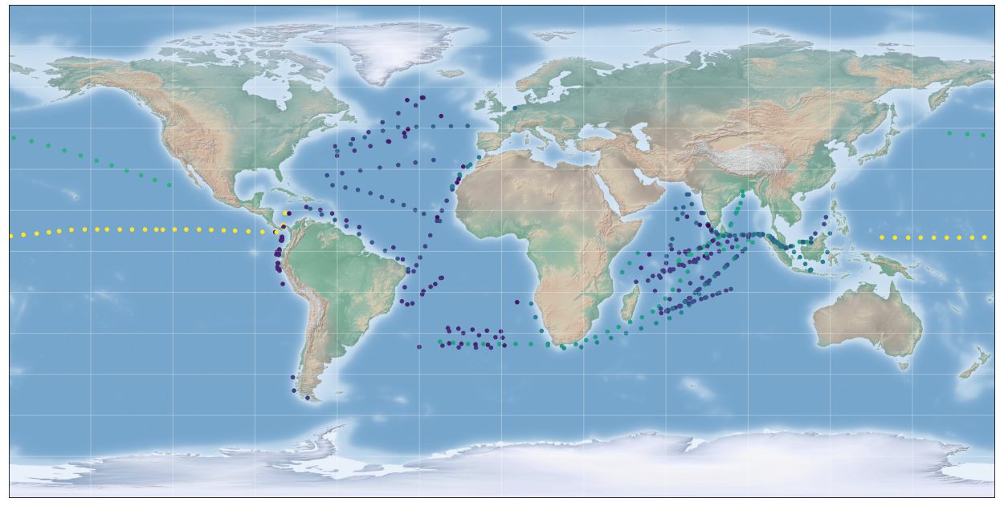

In [29]:
# select some journey id to desplay, for a data visualization checking
plotPorts(df_all_2[(df_all_2.journey_id>=273427218) & (df_all_2.journey_id<=282546097)],file_name="longVoyage_3000_drop1500.png")

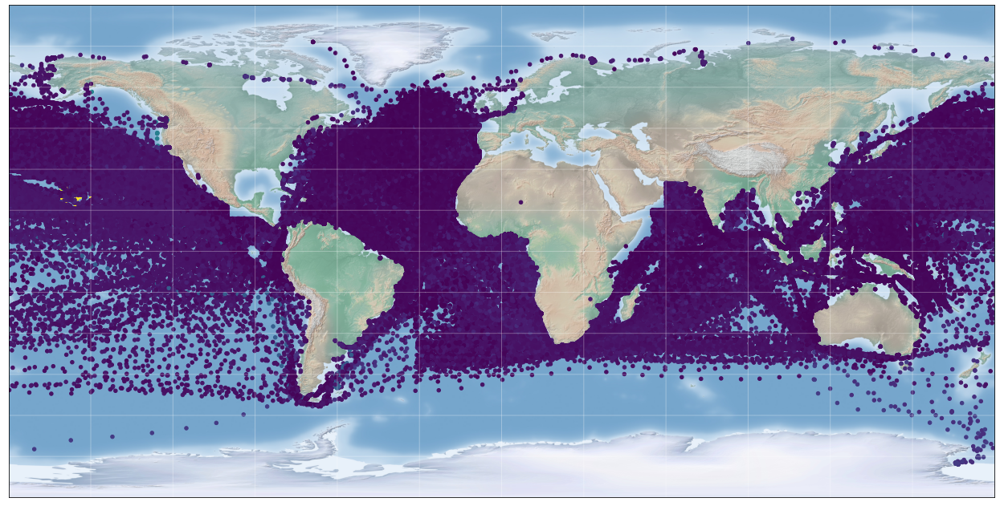

In [30]:
plotPorts(df_all_2,file_name="longVoyage_3000_noB1500+.png")

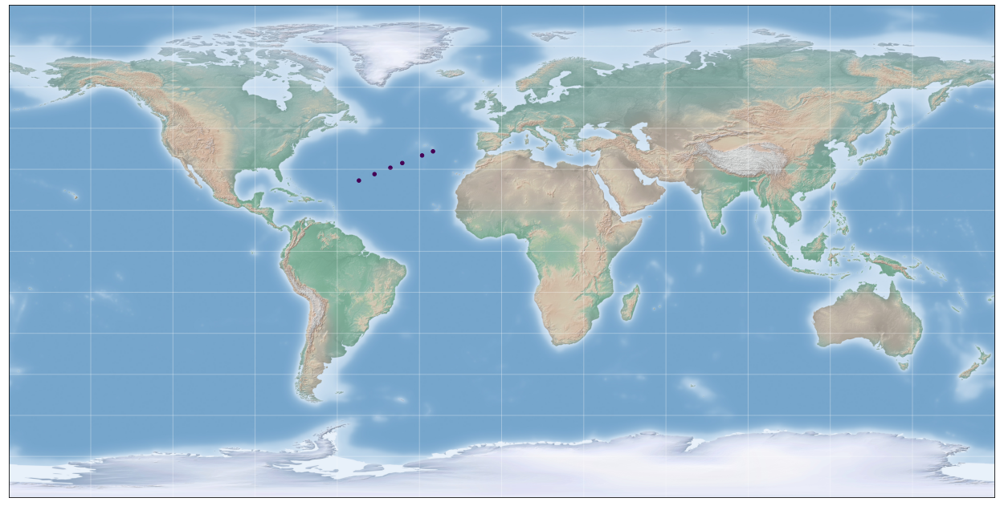

In [31]:
plotPorts(df_all_2[df_all_2.journey_id==286149910],file_name="longVoyage_3000_noB1500+_1.png")

In [32]:
df_all_2

,ais_position_id,ais_position_timestamp,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm,dist2start,dist2send
51,168182952,2014-01-31 15:27:27,16.17700,-71.45950,9281554.0,9281554.0,Mattheos I,283864844,2013-12-28 14:03:51,Point Comfort,United States of America,2014-02-09 06:47:55,Terminal da Alumar,Brazil,4103.238321,1576.508206,1964.451642
52,171550164,2014-02-01 07:15:17,14.71933,-68.45983,9281554.0,9281554.0,Mattheos I,283864844,2013-12-28 14:03:51,Point Comfort,United States of America,2014-02-09 06:47:55,Terminal da Alumar,Brazil,4103.238321,1769.854796,1771.344003
61,8830373,2014-01-02 23:29:55,36.55574,-25.04425,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,1549.949932,3059.851707
62,13121221,2014-01-03 17:58:56,35.06088,-29.03515,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,1750.148087,2847.053487
63,20000359,2014-01-04 23:53:10,32.28118,-36.26153,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,2122.038617,2449.905966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2190764,25805108759,2019-03-12 23:43:52,37.31098,-33.96405,9459060.0,9459060.0,Nave Atria,292318412,2019-03-03 18:22:37,Sarroch,Italy,2019-03-23 10:44:28,Buckeye Port Reading Terminal,United States of America,4111.340569,2018.575139,1879.266168
2190765,25820223135,2019-03-13 23:57:20,37.74989,-40.16130,9459060.0,9459060.0,Nave Atria,292318412,2019-03-03 18:22:37,Sarroch,Italy,2019-03-23 10:44:28,Buckeye Port Reading Terminal,United States of America,4111.340569,2293.538802,1589.532234
2190806,25847220596,2019-03-15 22:03:21,8.40040,74.18468,9459034.0,9459034.0,NCC Reem,292383019,2019-03-05 20:00:40,Jubail,Saudi Arabia,2019-03-27 17:03:19,Vopak Banyan Terminal,Singapore,3816.118051,1785.199583,1816.196392
2190807,25858515513,2019-03-16 17:38:50,6.63134,77.79204,9459034.0,9459034.0,NCC Reem,292383019,2019-03-05 20:00:40,Jubail,Saudi Arabia,2019-03-27 17:03:19,Vopak Banyan Terminal,Singapore,3816.118051,2016.540877,1584.678197


# d) save the final file, used for the weather data requiring.

In [33]:
df_all_2.to_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_3000nm_weather_v1.csv",index=False)

In [34]:
df_sameCountry=df_all_1[df_all_1.journey_start_location_country==df_all_1.journey_end_location_country]


In [35]:
df_sameCountry

,ais_position_id,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm
ais_position_timestamp,,,,,,,,,,,,,,
2014-01-01,4327148,-52.36579,-75.19329,9346469.0,9346469.0,Cabo San Antonio,287766425,2013-10-03 15:20:46,Puerto Sara,Chile,2014-07-27 02:27:56,Puerto Calbuco Terminal,Chile,28091.952949
2014-01-02,8609134,-52.95636,-70.75922,9346469.0,9346469.0,Cabo San Antonio,287766425,2013-10-03 15:20:46,Puerto Sara,Chile,2014-07-27 02:27:56,Puerto Calbuco Terminal,Chile,28091.952949
2014-01-03,10472806,-52.92734,-70.76017,9346469.0,9346469.0,Cabo San Antonio,287766425,2013-10-03 15:20:46,Puerto Sara,Chile,2014-07-27 02:27:56,Puerto Calbuco Terminal,Chile,28091.952949
2014-01-04,17283460,-52.92977,-70.80171,9346469.0,9346469.0,Cabo San Antonio,287766425,2013-10-03 15:20:46,Puerto Sara,Chile,2014-07-27 02:27:56,Puerto Calbuco Terminal,Chile,28091.952949
2014-01-05,23038963,-52.64484,-70.18538,9346469.0,9346469.0,Cabo San Antonio,287766425,2013-10-03 15:20:46,Puerto Sara,Chile,2014-07-27 02:27:56,Puerto Calbuco Terminal,Chile,28091.952949
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-03-18,25885792344,9.80828,-91.11758,9489118.0,9489118.0,Navig8 Constellation,292289256,2019-03-08 14:52:56,Los Angeles,United States of America,2019-03-27 05:56:38,Houston,United States of America,4610.755839
2019-03-19,25899617376,7.87110,-85.90152,9489118.0,9489118.0,Navig8 Constellation,292289256,2019-03-08 14:52:56,Los Angeles,United States of America,2019-03-27 05:56:38,Houston,United States of America,4610.755839
2019-03-20,25918993876,8.85013,-79.53331,9489118.0,9489118.0,Navig8 Constellation,292289256,2019-03-08 14:52:56,Los Angeles,United States of America,2019-03-27 05:56:38,Houston,United States of America,4610.755839


In [36]:
df_all_1

,ais_position_id,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm
ais_position_timestamp,,,,,,,,,,,,,,
2014-01-01,5811207,41.93912,139.07770,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
2014-01-02,8821505,39.15283,142.35820,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
2014-01-03,13536291,34.64402,139.67570,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
2014-01-04,19155353,34.03151,134.98734,9301407.0,9301407.0,Viktor Titov,285689022,2013-11-15 05:36:38,Nakhodka,Russia,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,7087.829763
2014-01-05,24344334,34.55417,135.43150,9301407.0,9301407.0,Viktor Titov,285689023,2014-01-05 14:27:16,JXTG Sakai Refinery,Japan,2014-02-03 01:15:37,De Kastri,Russia,4364.329539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-03-15,25848553475,1.48693,149.78317,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353
2019-03-16,25862262642,-2.61357,153.04519,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353
2019-03-17,25875803276,-6.77629,156.28137,9581693.0,9581693.0,Bougainville,291835447,2019-03-06 00:11:09,Yeosu,South Korea,2019-03-20 08:30:54,Honiara,Solomon Islands,3306.037353


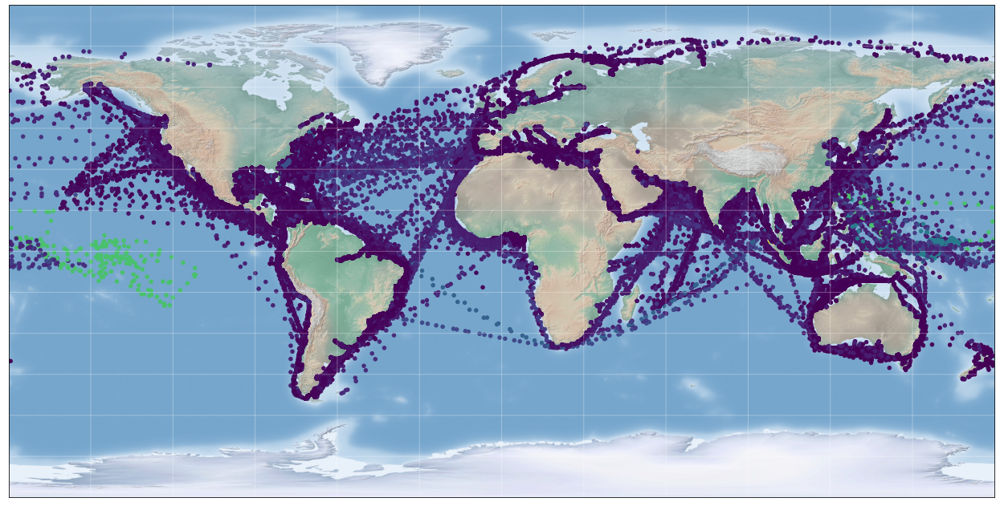

In [37]:
plotPorts(df_sameCountry,file_name="longVoyage_3000_sameCountry.png")

In [38]:
df_sameCountry

,ais_position_id,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm
ais_position_timestamp,,,,,,,,,,,,,,
2014-01-01,4327148,-52.36579,-75.19329,9346469.0,9346469.0,Cabo San Antonio,287766425,2013-10-03 15:20:46,Puerto Sara,Chile,2014-07-27 02:27:56,Puerto Calbuco Terminal,Chile,28091.952949
2014-01-02,8609134,-52.95636,-70.75922,9346469.0,9346469.0,Cabo San Antonio,287766425,2013-10-03 15:20:46,Puerto Sara,Chile,2014-07-27 02:27:56,Puerto Calbuco Terminal,Chile,28091.952949
2014-01-03,10472806,-52.92734,-70.76017,9346469.0,9346469.0,Cabo San Antonio,287766425,2013-10-03 15:20:46,Puerto Sara,Chile,2014-07-27 02:27:56,Puerto Calbuco Terminal,Chile,28091.952949
2014-01-04,17283460,-52.92977,-70.80171,9346469.0,9346469.0,Cabo San Antonio,287766425,2013-10-03 15:20:46,Puerto Sara,Chile,2014-07-27 02:27:56,Puerto Calbuco Terminal,Chile,28091.952949
2014-01-05,23038963,-52.64484,-70.18538,9346469.0,9346469.0,Cabo San Antonio,287766425,2013-10-03 15:20:46,Puerto Sara,Chile,2014-07-27 02:27:56,Puerto Calbuco Terminal,Chile,28091.952949
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-03-18,25885792344,9.80828,-91.11758,9489118.0,9489118.0,Navig8 Constellation,292289256,2019-03-08 14:52:56,Los Angeles,United States of America,2019-03-27 05:56:38,Houston,United States of America,4610.755839
2019-03-19,25899617376,7.87110,-85.90152,9489118.0,9489118.0,Navig8 Constellation,292289256,2019-03-08 14:52:56,Los Angeles,United States of America,2019-03-27 05:56:38,Houston,United States of America,4610.755839
2019-03-20,25918993876,8.85013,-79.53331,9489118.0,9489118.0,Navig8 Constellation,292289256,2019-03-08 14:52:56,Los Angeles,United States of America,2019-03-27 05:56:38,Houston,United States of America,4610.755839


In [39]:
df_sameCountry.to_csv("C:/posDoc-SDU-Denmark/SDU_research/shippingLabwp1/savedFile/ais_3000nm_weather_sameContry.csv",index=False)

In [40]:
df_all_1[(df_all_1.journey_end_location_name=="Sodegaura") & (df_all_1.journey_start_location_name=="Sodegaura")]

,ais_position_id,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm
ais_position_timestamp,,,,,,,,,,,,,,
2016-03-02,10020174808,35.48060,140.00648,9346744.0,9346744.0,FSL Shanghai,284862289,2016-03-02 00:51:45,Sodegaura,Japan,2016-05-14 00:56:46,Sodegaura,Japan,13614.227507
2016-03-03,10032825298,35.72004,141.51769,9346744.0,9346744.0,FSL Shanghai,284862289,2016-03-02 00:51:45,Sodegaura,Japan,2016-05-14 00:56:46,Sodegaura,Japan,13614.227507
2016-03-04,10045328341,39.31218,145.72179,9346744.0,9346744.0,FSL Shanghai,284862289,2016-03-02 00:51:45,Sodegaura,Japan,2016-05-14 00:56:46,Sodegaura,Japan,13614.227507
2016-03-05,10058136257,42.39775,149.83420,9346744.0,9346744.0,FSL Shanghai,284862289,2016-03-02 00:51:45,Sodegaura,Japan,2016-05-14 00:56:46,Sodegaura,Japan,13614.227507
2016-03-06,10070036793,45.40050,154.55065,9346744.0,9346744.0,FSL Shanghai,284862289,2016-03-02 00:51:45,Sodegaura,Japan,2016-05-14 00:56:46,Sodegaura,Japan,13614.227507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-27,23008806215,34.72557,130.00540,9256858.0,9256858.0,Lady M,283006795,2018-07-20 01:19:33,Sodegaura,Japan,2018-09-01 01:20:56,Sodegaura,Japan,4283.160234
2018-08-28,23024404015,33.06617,128.59359,9256858.0,9256858.0,Lady M,283006795,2018-07-20 01:19:33,Sodegaura,Japan,2018-09-01 01:20:56,Sodegaura,Japan,4283.160234
2018-08-29,23038491664,31.61259,132.26451,9256858.0,9256858.0,Lady M,283006795,2018-07-20 01:19:33,Sodegaura,Japan,2018-09-01 01:20:56,Sodegaura,Japan,4283.160234


In [41]:
df_all_2

,ais_position_id,ais_position_timestamp,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm,dist2start,dist2send
51,168182952,2014-01-31 15:27:27,16.17700,-71.45950,9281554.0,9281554.0,Mattheos I,283864844,2013-12-28 14:03:51,Point Comfort,United States of America,2014-02-09 06:47:55,Terminal da Alumar,Brazil,4103.238321,1576.508206,1964.451642
52,171550164,2014-02-01 07:15:17,14.71933,-68.45983,9281554.0,9281554.0,Mattheos I,283864844,2013-12-28 14:03:51,Point Comfort,United States of America,2014-02-09 06:47:55,Terminal da Alumar,Brazil,4103.238321,1769.854796,1771.344003
61,8830373,2014-01-02 23:29:55,36.55574,-25.04425,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,1549.949932,3059.851707
62,13121221,2014-01-03 17:58:56,35.06088,-29.03515,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,1750.148087,2847.053487
63,20000359,2014-01-04 23:53:10,32.28118,-36.26153,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,2122.038617,2449.905966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2190764,25805108759,2019-03-12 23:43:52,37.31098,-33.96405,9459060.0,9459060.0,Nave Atria,292318412,2019-03-03 18:22:37,Sarroch,Italy,2019-03-23 10:44:28,Buckeye Port Reading Terminal,United States of America,4111.340569,2018.575139,1879.266168
2190765,25820223135,2019-03-13 23:57:20,37.74989,-40.16130,9459060.0,9459060.0,Nave Atria,292318412,2019-03-03 18:22:37,Sarroch,Italy,2019-03-23 10:44:28,Buckeye Port Reading Terminal,United States of America,4111.340569,2293.538802,1589.532234
2190806,25847220596,2019-03-15 22:03:21,8.40040,74.18468,9459034.0,9459034.0,NCC Reem,292383019,2019-03-05 20:00:40,Jubail,Saudi Arabia,2019-03-27 17:03:19,Vopak Banyan Terminal,Singapore,3816.118051,1785.199583,1816.196392
2190807,25858515513,2019-03-16 17:38:50,6.63134,77.79204,9459034.0,9459034.0,NCC Reem,292383019,2019-03-05 20:00:40,Jubail,Saudi Arabia,2019-03-27 17:03:19,Vopak Banyan Terminal,Singapore,3816.118051,2016.540877,1584.678197


In [45]:
df_all_3=df2ts(df_all_2) # to dateseries
count_journey=df_all_2.journey_id.unique()
count_ships=df_all_2.ship_imo.unique()
print ("the number of journey is:",len(count_journey))
print ("the number of ships is:",len(count_ships))

the number of journey is: 53999
the number of ships is: 2565


In [46]:
df_all_3

,ais_position_id,ais_position_latitude,ais_position_longitude,ship_id,ship_imo,ship_name,journey_id,journey_start_timestamp,journey_start_location_name,journey_start_location_country,journey_end_timestamp,journey_end_location_name,journey_end_location_country,journey_distance_nm,dist2start,dist2send
ais_position_timestamp,,,,,,,,,,,,,,,,
2014-01-31,168182952,16.17700,-71.45950,9281554.0,9281554.0,Mattheos I,283864844,2013-12-28 14:03:51,Point Comfort,United States of America,2014-02-09 06:47:55,Terminal da Alumar,Brazil,4103.238321,1576.508206,1964.451642
2014-02-01,171550164,14.71933,-68.45983,9281554.0,9281554.0,Mattheos I,283864844,2013-12-28 14:03:51,Point Comfort,United States of America,2014-02-09 06:47:55,Terminal da Alumar,Brazil,4103.238321,1769.854796,1771.344003
2014-01-02,8830373,36.55574,-25.04425,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,1549.949932,3059.851707
2014-01-03,13121221,35.06088,-29.03515,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,1750.148087,2847.053487
2014-01-04,20000359,32.28118,-36.26153,9360415.0,9360415.0,Hafnia Hope,286149910,2013-12-24 17:18:21,Shell Pernis Refinery,Netherlands,2014-01-12 17:37:40,Pozos Colorados,Colombia,4681.640664,2122.038617,2449.905966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-03-12,25805108759,37.31098,-33.96405,9459060.0,9459060.0,Nave Atria,292318412,2019-03-03 18:22:37,Sarroch,Italy,2019-03-23 10:44:28,Buckeye Port Reading Terminal,United States of America,4111.340569,2018.575139,1879.266168
2019-03-13,25820223135,37.74989,-40.16130,9459060.0,9459060.0,Nave Atria,292318412,2019-03-03 18:22:37,Sarroch,Italy,2019-03-23 10:44:28,Buckeye Port Reading Terminal,United States of America,4111.340569,2293.538802,1589.532234
2019-03-15,25847220596,8.40040,74.18468,9459034.0,9459034.0,NCC Reem,292383019,2019-03-05 20:00:40,Jubail,Saudi Arabia,2019-03-27 17:03:19,Vopak Banyan Terminal,Singapore,3816.118051,1785.199583,1816.196392


In [52]:
print ("the length of time span (in days):",df_all_3.index.unique())
print ("the time span (in years):",1906/365)

the length of time span (in days): DatetimeIndex(['2014-01-31', '2014-02-01', '2014-01-02', '2014-01-03',
               '2014-01-04', '2014-01-05', '2014-01-06', '2014-01-07',
               '2014-01-01', '2014-02-09',
               ...
               '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01',
               '2019-02-15', '2019-02-16', '2019-02-13', '2019-02-14',
               '2019-03-20', '2019-03-21'],
              dtype='datetime64[ns]', name='ais_position_timestamp', length=1906, freq=None)
the time span (in years): 5.221917808219178
